# `Aadhaar Enrolment Dataset Analysis`

**Purpose**: To analyze new Aadhaar registrations and study enrolment trends, coverage growth, and regional disparities.

| **Attribute** | **Type** | **Description** | **Range/Format** |
| --- | --- | --- | --- |
| `date` | datetime | Enrolment transaction date | YYYY-MM-DD |
| `state` | categorical | State | 55 states |
| `district` | categorical | District-level administrative unit | ~985 districts |
| `pincode` | categorical | 6-digit postal code | 100000-855456 |
| `age_0_5` | integer | Enrolments for age group 0–5 years | ≥ 0 |
| `age_5_17` | integer | Enrolments for age group 5–17 years | ≥ 0 |
| `age_18_greater` | integer | Enrolments for age group 18+ years | ≥ 0 |

**Analytical Applications**:

- Enrolment Momentum Index (EMI) - growth/decline trends
- Enrolment Penetration Score (EPS) - coverage depth
- Regional Inequality Ratio (RIR) - intra-state disparities
- Child enrolment behavior patterns (hospital vs. school-driven adoption)
- Seasonal enrollment cycles and policy impact assessment

## 1. INITIAL SETUP

### 1.1 Neccessary Imports

In [4]:
# ----statistic mesasures----
import pandas as pd
import numpy as np

# ----preprocessing & feature engineering----
from datetime import datetime

# ----ignore warnings----
import warnings
warnings.filterwarnings('ignore')

# ----Visualization Settings----
import matplotlib.pyplot as plt
import seaborn as sns

### 1.2 Visual Theming

In [5]:
# Set style for better visualizations
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")

## 2. IMPORT DATA

In [7]:
# Load enrolment datasets
files = [
    "api_data_aadhar_enrolment_0_500000.csv",
    "api_data_aadhar_enrolment_500000_1000000.csv", 
    "api_data_aadhar_enrolment_1000000_1006029.csv"
]

# Read and combine
dfs = [pd.read_csv(f) for f in files]
df = pd.concat(dfs, ignore_index=True)

print(f"Enrolment dataset loaded: {df.shape[0]:,} rows × {df.shape[1]} columns")
print(f"Initial date range: {df['date'].min()} to {df['date'].max()}")

Enrolment dataset loaded: 1,006,029 rows × 7 columns
Initial date range: 01-04-2025 to 31-12-2025


### 2.1 Display basic information

In [8]:
print("Dataset Shape:", df.shape)

Dataset Shape: (1006029, 7)


In [9]:
print("\nColumn Information:")
print(df.info())


Column Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1006029 entries, 0 to 1006028
Data columns (total 7 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   date            1006029 non-null  object
 1   state           1006029 non-null  object
 2   district        1006029 non-null  object
 3   pincode         1006029 non-null  int64 
 4   age_0_5         1006029 non-null  int64 
 5   age_5_17        1006029 non-null  int64 
 6   age_18_greater  1006029 non-null  int64 
dtypes: int64(4), object(3)
memory usage: 53.7+ MB
None


In [10]:
print("\nFirst 5 rows:")
print(df.head())


First 5 rows:
         date          state          district  pincode  age_0_5  age_5_17  \
0  02-03-2025      Meghalaya  East Khasi Hills   793121       11        61   
1  09-03-2025      Karnataka   Bengaluru Urban   560043       14        33   
2  09-03-2025  Uttar Pradesh      Kanpur Nagar   208001       29        82   
3  09-03-2025  Uttar Pradesh           Aligarh   202133       62        29   
4  09-03-2025      Karnataka   Bengaluru Urban   560016       14        16   

   age_18_greater  
0              37  
1              39  
2              12  
3              15  
4              21  


In [11]:
print("\nMissing Values:")
print(df.isna().sum())


Missing Values:
date              0
state             0
district          0
pincode           0
age_0_5           0
age_5_17          0
age_18_greater    0
dtype: int64


In [12]:
# def basic_eda(df):
#     print("Rows:", len(df))
#     print("Date range:", df['date'].min(), "to", df['date'].max())
#     print("Unique states:", df['state'].nunique())
#     print("Unique districts:", df['district'].nunique())
#     print("Missing dates:", df['date'].isna().sum())
#     print("\nOverall totals by age-group:")
#     print(df[['age_0_5','age_5_17','age_18_greater','total_enrolments']].sum())
#     print("\nTop 10 rows by total_enrolments:")
#     display(df.sort_values('total_enrolments', ascending=False).head(10))

# basic_eda(df)

## 3. Data Preparartion Strategy

1. **Date Handling**  
   - Convert `date` column to `datetime` type  
   - Extract temporal features: `year`, `month`, `quarter`, `day_of_week`

2. **Aggregate Enrolments**  
   - Compute `total_enrolments` as the sum of all age groups (`0–5`, `5–17`, `18+`)

3. **Age Group Analysis**  
   - Calculate age group percentages:
     - `pct_0_5`, `pct_5_17`, `pct_18_plus`  
   - Enables demographic insights and trend analysis

4. **Data Quality Checks**  
   - Ensure no missing or malformed dates  
   - Verify totals match sum of age groups

5. **Output for Modeling**  
   - Preprocessed DataFrame includes:
     ```
     date, state, district, total_enrolments, pct_0_5, pct_5_17, pct_18_plus
     ```
   - Ready for feature engineering and predictive modeling


In [13]:
# ----Convert date to datetime----
df['date'] = df['date'] = pd.to_datetime(df['date'], format='%d-%m-%Y')

# ----Extract temporal features----
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['quarter'] = df['date'].dt.quarter
df['day_of_week'] = df['date'].dt.dayofweek

# ----Calculate total enrolments per record----
df['total_enrolments'] = df['age_0_5'] + df['age_5_17'] + df['age_18_greater']

# ----Child-Adult ratio (key metric for family coverage)----
df['child_adult_ratio'] = np.where(
    df['age_18_greater'] > 0,
    (df['age_0_5'] + df['age_5_17']) / df['age_18_greater'],
    np.nan  # Handle division by zero
)

# ----Calculate age group percentages----
df['pct_0_5'] = (df['age_0_5'] / df['total_enrolments']) * 100
df['pct_5_17'] = (df['age_5_17'] / df['total_enrolments']) * 100
df['pct_18_plus'] = (df['age_18_greater'] / df['total_enrolments']) * 100

# ----Display cleaned data info----
print("Data after preprocessing:")
df.head()

Data after preprocessing:


,date,state,district,pincode,age_0_5,age_5_17,age_18_greater,year,month,quarter,day_of_week,total_enrolments,child_adult_ratio,pct_0_5,pct_5_17,pct_18_plus
0,2025-03-02,Meghalaya,East Khasi Hills,793121,11,61,37,2025,3,1,6,109,1.945946,10.091743,55.963303,33.944954
1,2025-03-09,Karnataka,Bengaluru Urban,560043,14,33,39,2025,3,1,6,86,1.205128,16.279070,38.372093,45.348837
2,2025-03-09,Uttar Pradesh,Kanpur Nagar,208001,29,82,12,2025,3,1,6,123,9.250000,23.577236,66.666667,9.756098
3,2025-03-09,Uttar Pradesh,Aligarh,202133,62,29,15,2025,3,1,6,106,6.066667,58.490566,27.358491,14.150943
4,2025-03-09,Karnataka,Bengaluru Urban,560016,14,16,21,2025,3,1,6,51,1.428571,27.450980,31.372549,41.176471


In [14]:
# Aggregate to district-month level (operational decision unit)
district_month = df.groupby(['state', 'district', 'month']).agg({
    'total_enrolments': 'sum',
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum',
    'child_adult_ratio': 'mean',
    'pincode': 'nunique'
}).reset_index()

# Add derived metrics at aggregate level
district_month['avg_daily_enrolments'] = district_month['total_enrolments'] / 30  # Approximate
district_month['enrolments_per_pincode'] = district_month['total_enrolments'] / district_month['pincode']
district_month['is_high_volume'] = district_month['total_enrolments'] > district_month['total_enrolments'].median()

print(f"📈 District-month aggregates: {district_month.shape[0]:,} records")
display(district_month.head())

📈 District-month aggregates: 5,062 records


,state,district,month,total_enrolments,age_0_5,age_5_17,age_18_greater,child_adult_ratio,pincode,avg_daily_enrolments,enrolments_per_pincode,is_high_volume
0,100000,100000,9,12,0,0,12,0.0,1,0.400000,12.0,False
1,100000,100000,10,1,0,1,0,NaN,1,0.033333,1.0,False
2,100000,100000,11,11,0,0,11,0.0,1,0.366667,11.0,False
3,100000,100000,12,194,0,0,194,0.0,1,6.466667,194.0,False
4,Andaman & Nicobar Islands,Andamans,9,27,23,4,0,NaN,6,0.900000,4.5,False


## 4. EDA: Exploratory Data Analysis

### 4.1 Monthly Enrolment Trends and Seasonal Pattern Analysis

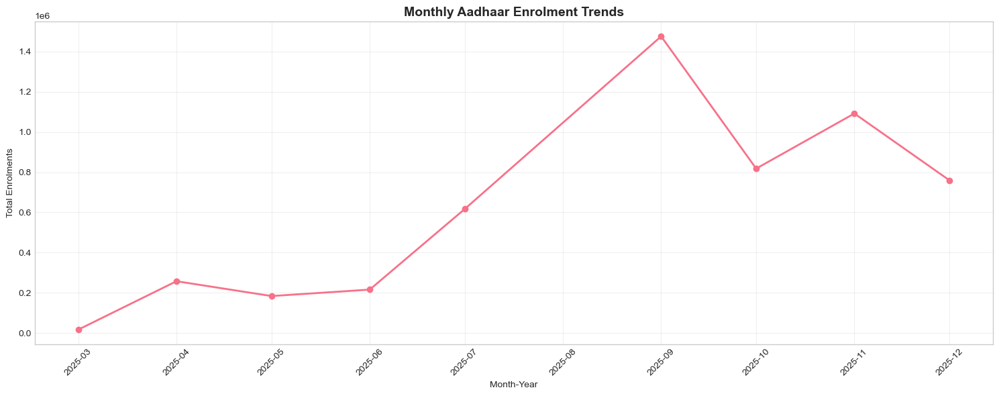

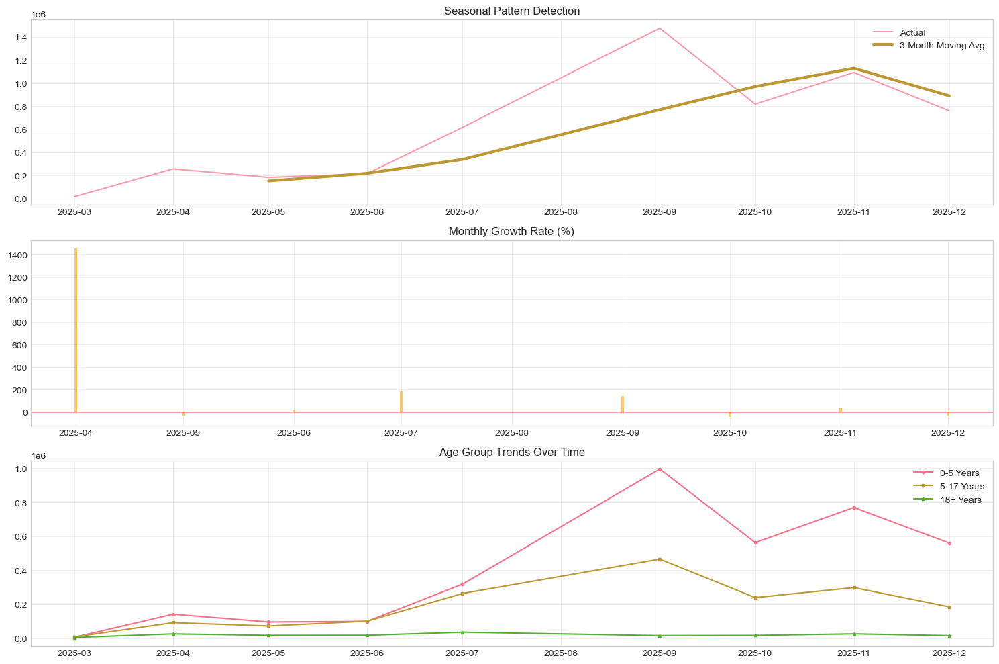

In [15]:
# Monthly trend analysis
monthly_trend = df.groupby(['year', 'month']).agg({
    'total_enrolments': 'sum',
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum'
}).reset_index()

# Create month-year column for plotting
monthly_trend['month_year'] = pd.to_datetime(
    monthly_trend['year'].astype(str) + '-' + monthly_trend['month'].astype(str) + '-01'
)

# Plot monthly trends
plt.figure(figsize=(15, 6))
plt.plot(monthly_trend['month_year'], monthly_trend['total_enrolments'], 
         marker='o', linewidth=2)
plt.title('Monthly Aadhaar Enrolment Trends', fontsize=14, fontweight='bold')
plt.xlabel('Month-Year')
plt.ylabel('Total Enrolments')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Seasonal decomposition
monthly_trend['moving_avg'] = monthly_trend['total_enrolments'].rolling(window=3).mean()
monthly_trend['growth_rate'] = monthly_trend['total_enrolments'].pct_change() * 100

plt.figure(figsize=(15, 10))

# Plot 1: Original vs Moving Average
plt.subplot(3, 1, 1)
plt.plot(monthly_trend['month_year'], monthly_trend['total_enrolments'], 
         label='Actual', alpha=0.7)
plt.plot(monthly_trend['month_year'], monthly_trend['moving_avg'], 
         label='3-Month Moving Avg', linewidth=3)
plt.title('Seasonal Pattern Detection', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 2: Growth Rate
plt.subplot(3, 1, 2)
plt.bar(monthly_trend['month_year'], monthly_trend['growth_rate'], 
        alpha=0.6, color='orange')
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.title('Monthly Growth Rate (%)', fontsize=12)
plt.grid(True, alpha=0.3)

# Plot 3: Age Group Trends
plt.subplot(3, 1, 3)
plt.plot(monthly_trend['month_year'], monthly_trend['age_0_5'], 
         label='0-5 Years', marker='o', markersize=3)
plt.plot(monthly_trend['month_year'], monthly_trend['age_5_17'], 
         label='5-17 Years', marker='s', markersize=3)
plt.plot(monthly_trend['month_year'], monthly_trend['age_18_greater'], 
         label='18+ Years', marker='^', markersize=3)
plt.title('Age Group Trends Over Time', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

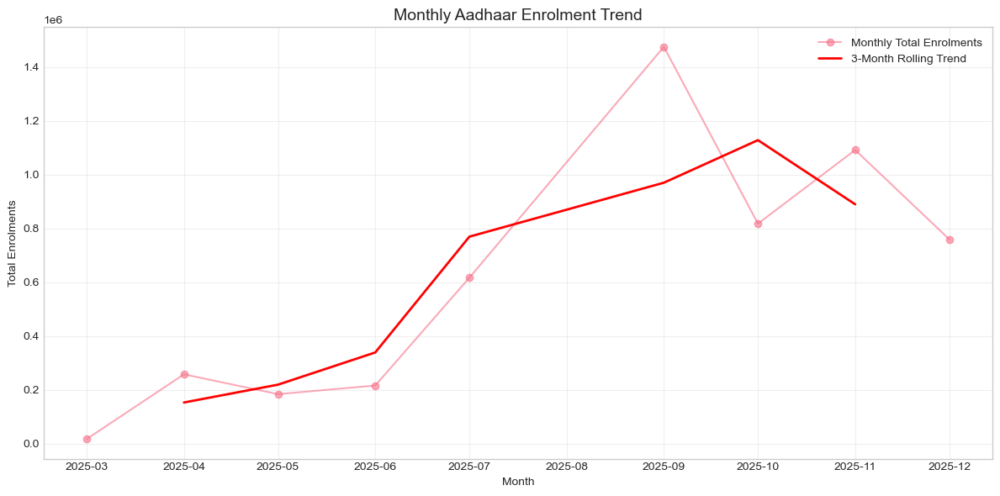

In [16]:
# Ensure month_year is datetime or period-based and sorted
monthly_trend = monthly_trend.sort_values('month_year')

# Create monthly time series
monthly_series = monthly_trend.set_index('month_year')['total_enrolments']

# 3-month rolling average for trend smoothing
rolling_trend_3m = monthly_series.rolling(window=3, center=True).mean()

# Plot monthly trend and rolling average
plt.figure(figsize=(12, 6))
plt.plot(
    monthly_series,
    label='Monthly Total Enrolments',
    marker='o',
    alpha=0.6
)
plt.plot(
    rolling_trend_3m,
    label='3-Month Rolling Trend',
    linewidth=2,
    color='red'
)

plt.title('Monthly Aadhaar Enrolment Trend', fontsize=14)
plt.xlabel('Month')
plt.ylabel('Total Enrolments')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 4.2 Understanding Enrolment Patterns
We analyze distribution, trends, and anomalies to identify:
1. National coverage levels
2. Geographic distribution patterns
3. Age-group dynamics
4. Temporal trends and seasonality

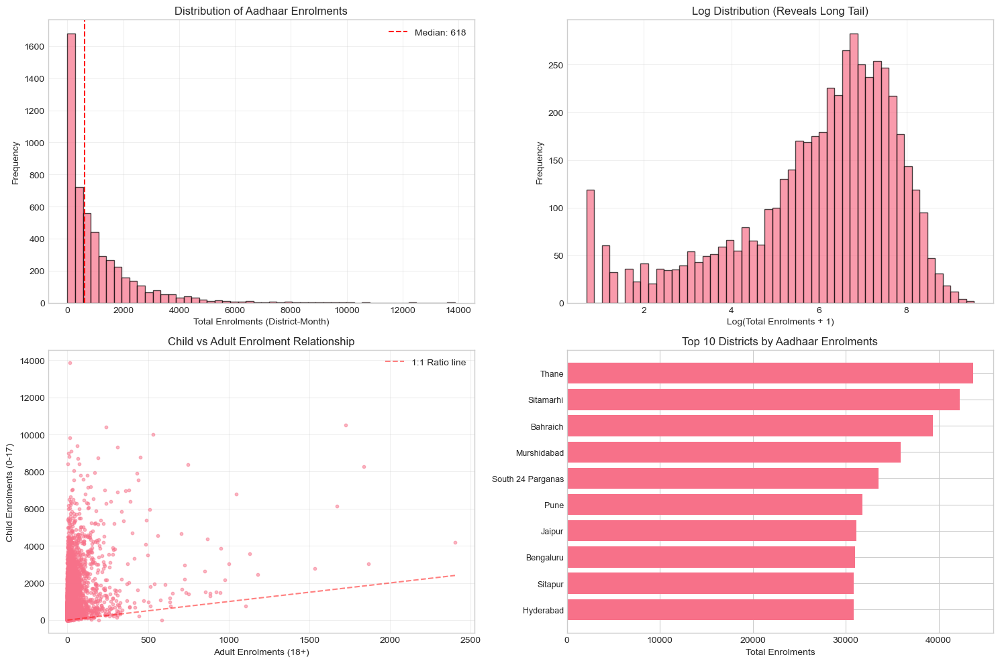

📊 KEY STATISTICS (District-Month Level):
Mean enrolments: 1,074
Median enrolments: 618
Std deviation: 1,342
Skewness: 2.55
Maximum: 13,877
75th percentile: 1,495
25th percentile: 167
IQR: 1,328

💡 Interpretation: Mean > Median indicates right skew - a few districts account for disproportionate enrolment volume.


In [17]:
# Create a 2x2 visualization grid
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# 1. Total enrolments distribution
axes[0, 0].hist(district_month['total_enrolments'], bins=50, edgecolor='black', alpha=0.7)
axes[0, 0].axvline(district_month['total_enrolments'].median(), color='red', linestyle='--', 
                   label=f'Median: {district_month["total_enrolments"].median():,.0f}')
axes[0, 0].set_xlabel('Total Enrolments (District-Month)')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Distribution of Aadhaar Enrolments')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# 2. Log-scale distribution (reveals skewness)
axes[0, 1].hist(np.log1p(district_month['total_enrolments']), bins=50, edgecolor='black', alpha=0.7)
axes[0, 1].set_xlabel('Log(Total Enrolments + 1)')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('Log Distribution (Reveals Long Tail)')
axes[0, 1].grid(True, alpha=0.3)

# 3. Age group composition scatter
axes[1, 0].scatter(district_month['age_18_greater'], district_month['age_0_5'] + district_month['age_5_17'], 
                   alpha=0.5, s=10)
axes[1, 0].plot([0, district_month['age_18_greater'].max()], 
                [0, district_month['age_18_greater'].max()], 
                'r--', alpha=0.5, label='1:1 Ratio line')
axes[1, 0].set_xlabel('Adult Enrolments (18+)')
axes[1, 0].set_ylabel('Child Enrolments (0-17)')
axes[1, 0].set_title('Child vs Adult Enrolment Relationship')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# 4. Top 10 districts by total enrolments
top_districts = district_month.groupby('district')['total_enrolments'].sum().nlargest(10)
axes[1, 1].barh(range(len(top_districts)), top_districts.values)
axes[1, 1].set_yticks(range(len(top_districts)))
axes[1, 1].set_yticklabels(top_districts.index, fontsize=9)
axes[1, 1].set_xlabel('Total Enrolments')
axes[1, 1].set_title('Top 10 Districts by Aadhaar Enrolments')
axes[1, 1].invert_yaxis()

plt.tight_layout()
plt.savefig('eda_visualizations.png', dpi=150, bbox_inches='tight')
plt.show()

# Print key statistics
print("📊 KEY STATISTICS (District-Month Level):")
print("=" * 50)
print(f"Mean enrolments: {district_month['total_enrolments'].mean():,.0f}")
print(f"Median enrolments: {district_month['total_enrolments'].median():,.0f}")
print(f"Std deviation: {district_month['total_enrolments'].std():,.0f}")
print(f"Skewness: {district_month['total_enrolments'].skew():.2f}")
print(f"Maximum: {district_month['total_enrolments'].max():,.0f}")
print(f"75th percentile: {district_month['total_enrolments'].quantile(0.75):,.0f}")
print(f"25th percentile: {district_month['total_enrolments'].quantile(0.25):,.0f}")
print(f"IQR: {district_month['total_enrolments'].quantile(0.75) - district_month['total_enrolments'].quantile(0.25):,.0f}")
print("\n💡 Interpretation: Mean > Median indicates right skew - a few districts account for disproportionate enrolment volume.")

### 4.3 TEMPORAL TREND ANALYSIS

TEMPORAL TREND ANALYSIS

1. DAILY ENROLMENT TRENDS


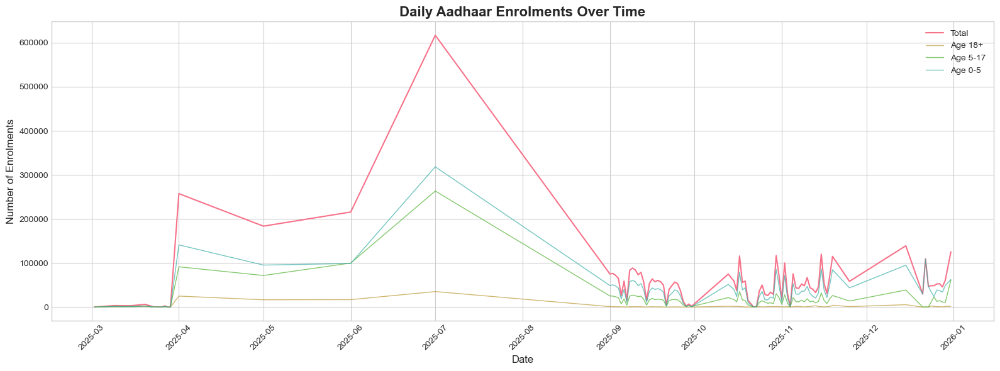


2. MONTHLY ENROLMENT PATTERNS
   Average monthly enrolments: 603,967
   Std deviation: 482,328
   Peak month: 2025-09
   Peak value: 1,475,879

3. YEAR-OVER-YEAR GROWTH ANALYSIS
   2025: 5,435,702

4. SEASONAL PATTERNS (Average by Month)


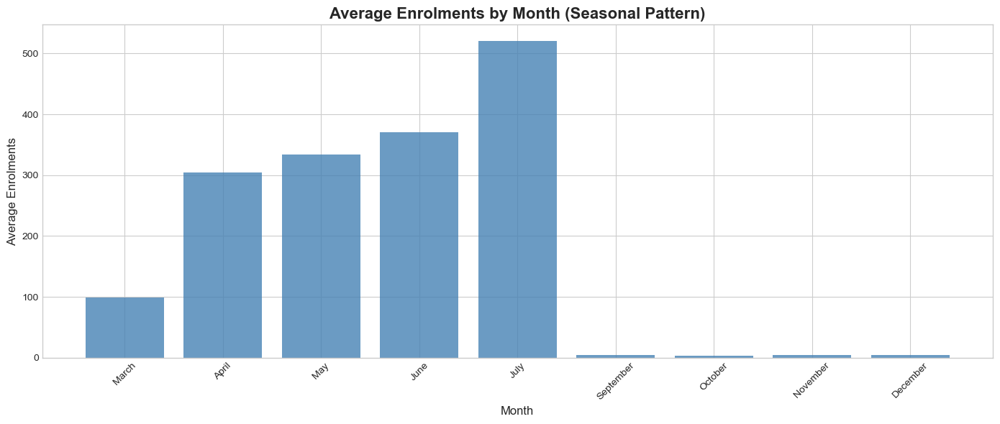

month_name  total_enrolments
     March         98.702381
     April        303.940968
       May        334.455373
      June        370.676976
      July        521.003378
 September          4.145041
   October          3.860244
  November          4.003090
  December          4.690231

5. DAY OF WEEK PATTERNS
 day_name  total_enrolments
   Monday          4.302342
  Tuesday          9.958414
Wednesday          4.620919
 Thursday          5.573971
   Friday          4.090632
 Saturday          4.048170
   Sunday          5.638170

6. TREND SMOOTHING WITH MOVING AVERAGES


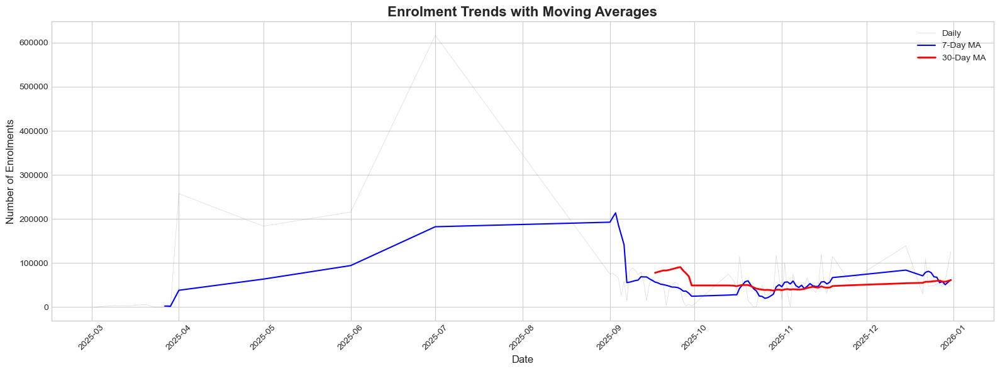


7. VOLATILITY METRICS
   Daily Coefficient of Variation: 125.38%
   Monthly Coefficient of Variation: 79.86%



In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# Assuming df is already loaded and preprocessed
# df = pd.read_csv('aadhaar_enrolment.csv')
# df['date'] = pd.to_datetime(df['date'])
# df['total_enrolments'] = df['age_0_5'] + df['age_5_17'] + df['age_18_greater']

print("="*80)
print("TEMPORAL TREND ANALYSIS")
print("="*80)

# Create time-based features
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['quarter'] = df['date'].dt.quarter
df['day_of_week'] = df['date'].dt.dayofweek
df['week_of_year'] = df['date'].dt.isocalendar().week
df['year_month'] = df['date'].dt.to_period('M')

# 1. DAILY ENROLMENT TRENDS
print("\n1. DAILY ENROLMENT TRENDS")
daily_trends = df.groupby('date').agg({
    'total_enrolments': 'sum',
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum'
}).reset_index()

plt.figure(figsize=(16, 6))
plt.plot(daily_trends['date'], daily_trends['total_enrolments'], linewidth=1.5, label='Total')
plt.plot(daily_trends['date'], daily_trends['age_18_greater'], linewidth=1, alpha=0.7, label='Age 18+')
plt.plot(daily_trends['date'], daily_trends['age_5_17'], linewidth=1, alpha=0.7, label='Age 5-17')
plt.plot(daily_trends['date'], daily_trends['age_0_5'], linewidth=1, alpha=0.7, label='Age 0-5')
plt.title('Daily Aadhaar Enrolments Over Time', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Enrolments', fontsize=12)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('daily_trends.png', dpi=300, bbox_inches='tight')
plt.show()

# 2. MONTHLY AGGREGATION
print("\n2. MONTHLY ENROLMENT PATTERNS")
monthly_trends = df.groupby('year_month').agg({
    'total_enrolments': 'sum',
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum'
}).reset_index()

print(f"   Average monthly enrolments: {monthly_trends['total_enrolments'].mean():,.0f}")
print(f"   Std deviation: {monthly_trends['total_enrolments'].std():,.0f}")
print(f"   Peak month: {monthly_trends.loc[monthly_trends['total_enrolments'].idxmax(), 'year_month']}")
print(f"   Peak value: {monthly_trends['total_enrolments'].max():,.0f}")

# 3. YEAR-OVER-YEAR GROWTH
print("\n3. YEAR-OVER-YEAR GROWTH ANALYSIS")
yearly_trends = df.groupby('year')['total_enrolments'].sum().reset_index()
yearly_trends['yoy_growth'] = yearly_trends['total_enrolments'].pct_change() * 100

for idx, row in yearly_trends.iterrows():
    if pd.notna(row['yoy_growth']):
        print(f"   {int(row['year'])}: {row['total_enrolments']:,.0f} ({row['yoy_growth']:+.2f}% YoY)")
    else:
        print(f"   {int(row['year'])}: {row['total_enrolments']:,.0f}")

# 4. SEASONAL PATTERNS (Month-wise)
print("\n4. SEASONAL PATTERNS (Average by Month)")
seasonal = df.groupby('month')['total_enrolments'].mean().reset_index()
seasonal['month_name'] = seasonal['month'].apply(lambda x: datetime(2024, x, 1).strftime('%B'))

plt.figure(figsize=(14, 6))
plt.bar(seasonal['month_name'], seasonal['total_enrolments'], color='steelblue', alpha=0.8)
plt.title('Average Enrolments by Month (Seasonal Pattern)', fontsize=16, fontweight='bold')
plt.xlabel('Month', fontsize=12)
plt.ylabel('Average Enrolments', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('seasonal_pattern.png', dpi=300, bbox_inches='tight')
plt.show()

print(seasonal[['month_name', 'total_enrolments']].to_string(index=False))

# 5. DAY OF WEEK ANALYSIS
print("\n5. DAY OF WEEK PATTERNS")
dow_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
dow_trends = df.groupby('day_of_week')['total_enrolments'].mean().reset_index()
dow_trends['day_name'] = dow_trends['day_of_week'].apply(lambda x: dow_names[x])

print(dow_trends[['day_name', 'total_enrolments']].to_string(index=False))

# 6. MOVING AVERAGES FOR TREND SMOOTHING
print("\n6. TREND SMOOTHING WITH MOVING AVERAGES")
daily_trends['MA_7'] = daily_trends['total_enrolments'].rolling(window=7).mean()
daily_trends['MA_30'] = daily_trends['total_enrolments'].rolling(window=30).mean()

plt.figure(figsize=(16, 6))
plt.plot(daily_trends['date'], daily_trends['total_enrolments'], 
         alpha=0.3, linewidth=0.5, label='Daily', color='gray')
plt.plot(daily_trends['date'], daily_trends['MA_7'], 
         linewidth=1.5, label='7-Day MA', color='blue')
plt.plot(daily_trends['date'], daily_trends['MA_30'], 
         linewidth=2, label='30-Day MA', color='red')
plt.title('Enrolment Trends with Moving Averages', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Enrolments', fontsize=12)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('moving_averages.png', dpi=300, bbox_inches='tight')
plt.show()

# 7. VOLATILITY ANALYSIS
print("\n7. VOLATILITY METRICS")
print(f"   Daily Coefficient of Variation: {(daily_trends['total_enrolments'].std() / daily_trends['total_enrolments'].mean()) * 100:.2f}%")
print(f"   Monthly Coefficient of Variation: {(monthly_trends['total_enrolments'].std() / monthly_trends['total_enrolments'].mean()) * 100:.2f}%")

print("\n" + "="*80)

### 4.4 State-wise Analysis of Aadhaar Enrolments

#### 4.4.1 [ STATE-LEVEL SUMMARY STATISTICS ]

In [19]:
# Group by state for aggregated analysis
state_analysis = df.groupby('state').agg({
    'total_enrolments': ['sum', 'mean', 'std', 'count'],
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum',
    'child_adult_ratio': 'mean',
    'pct_0_5': 'mean',
    'pct_5_17': 'mean',
    'pct_18_plus': 'mean'
}).round(2)

# Flatten multi-index columns
state_analysis.columns = ['_'.join(col).strip() for col in state_analysis.columns.values]
state_analysis = state_analysis.reset_index()

# Rename for clarity
state_analysis.rename(columns={
    'total_enrolments_sum': 'total_enrolments',
    'total_enrolments_mean': 'avg_daily_enrolments',
    'total_enrolments_std': 'std_daily_enrolments',
    'total_enrolments_count': 'records_count',
    'age_0_5_sum': 'total_0_5',
    'age_5_17_sum': 'total_5_17',
    'age_18_greater_sum': 'total_18_plus',
    'child_adult_ratio_mean': 'avg_child_adult_ratio',
    'pct_0_5_mean': 'avg_pct_0_5',
    'pct_5_17_mean': 'avg_pct_5_17',
    'pct_18_plus_mean': 'avg_pct_18_plus'
}, inplace=True)

# Calculate age distribution percentages
state_analysis['pct_children_0_17'] = ((state_analysis['total_0_5'] + state_analysis['total_5_17']) / 
                                        state_analysis['total_enrolments']) * 100
state_analysis['pct_adults'] = 100 - state_analysis['pct_children_0_17']

#### 4.4.2 [ TOP/BOTTOM PERFORMING STATES ]

In [20]:
print("\n" + "="*80)
print("TOP 10 STATES BY TOTAL ENROLMENTS")
print("="*80)
top_states = state_analysis.nlargest(10, 'total_enrolments')[['state', 'total_enrolments', 'avg_daily_enrolments']]
print(top_states.to_string(index=False))

print("\n" + "="*80)
print("BOTTOM 10 STATES BY TOTAL ENROLMENTS")
print("="*80)
bottom_states = state_analysis.nsmallest(10, 'total_enrolments')[['state', 'total_enrolments', 'avg_daily_enrolments']]
print(bottom_states.to_string(index=False))


TOP 10 STATES BY TOTAL ENROLMENTS
         state  total_enrolments  avg_daily_enrolments
 Uttar Pradesh           1018629                  9.23
         Bihar            609585                 10.06
Madhya Pradesh            493970                  9.84
   West Bengal            375297                  4.90
   Maharashtra            369139                  4.78
     Rajasthan            348458                  6.20
       Gujarat            280549                  6.02
         Assam            230197                  7.23
     Karnataka            223235                  3.18
    Tamil Nadu            220789                  2.39

BOTTOM 10 STATES BY TOTAL ENROLMENTS
               state  total_enrolments  avg_daily_enrolments
              ODISHA                 1                  1.00
          WESTBENGAL                 1                  1.00
         WEST BENGAL                 4                  1.00
      andhra pradesh                 5                  1.00
          Westben

#### 4.4.3 [ AGE DISTRIBUTION ANALYSIS BY STATE ]

In [21]:
print("\n" + "="*80)
print("STATES WITH HIGHEST CHILD ENROLMENT PERCENTAGE (>30%)")
print("="*80)
high_child_states = state_analysis[state_analysis['pct_children_0_17'] > 30][['state', 'pct_children_0_17', 'avg_child_adult_ratio']]
print(high_child_states.sort_values('pct_children_0_17', ascending=False).to_string(index=False))


STATES WITH HIGHEST CHILD ENROLMENT PERCENTAGE (>30%)
                                       state  pct_children_0_17  avg_child_adult_ratio
                   Andaman & Nicobar Islands         100.000000                    NaN
                 Andaman and Nicobar Islands         100.000000                    NaN
                             Jammu & Kashmir         100.000000                    NaN
                               Daman and Diu         100.000000                    NaN
                                 Daman & Diu         100.000000                    NaN
                        Dadra & Nagar Haveli         100.000000                    NaN
                                 West Bangal         100.000000                    NaN
                              andhra pradesh         100.000000                    NaN
                                  Westbengal         100.000000                    NaN
                                 West bengal         100.000000            

#### 4.4.4 [ TEMPORAL TRENDS BY STATE (YEARLY) ]

In [22]:
# Yearly enrolments by state
yearly_state = df.groupby(['state', 'year']).agg({
    'total_enrolments': 'sum',
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum'
}).reset_index()

# Calculate yearly growth rates - FIXED APPROACH
yearly_state = yearly_state.sort_values(['state', 'year'])
yearly_state['prev_year_enrolment'] = yearly_state.groupby('state')['total_enrolments'].shift(1)
yearly_state['yoy_growth'] = np.where(
    yearly_state['prev_year_enrolment'] > 0,
    ((yearly_state['total_enrolments'] - yearly_state['prev_year_enrolment']) / 
     yearly_state['prev_year_enrolment']) * 100,
    np.nan
)

# Identify states with highest growth (filter out NaN values)
print("\n" + "="*80)
print("STATES WITH HIGHEST YEAR-OVER-YEAR GROWTH (Latest Year)")
print("="*80)
latest_year = yearly_state['year'].max()
latest_year_data = yearly_state[yearly_state['year'] == latest_year].copy()

# Filter out states with NaN growth values
valid_growth_data = latest_year_data[latest_year_data['yoy_growth'].notna()]

if not valid_growth_data.empty:
    top_growth_states = valid_growth_data.nlargest(10, 'yoy_growth')[['state', 'total_enrolments', 'yoy_growth']]
    print(top_growth_states.to_string(index=False))
else:
    print("No valid YoY growth data available")


STATES WITH HIGHEST YEAR-OVER-YEAR GROWTH (Latest Year)
No valid YoY growth data available


#### 4.4.5 [ ENROLMENT CONCENTRATION ANALYSIS ]

In [23]:
# Calculate concentration metrics
total_national = state_analysis['total_enrolments'].sum()
state_analysis['national_share'] = (state_analysis['total_enrolments'] / total_national) * 100
state_analysis['cumulative_share'] = state_analysis['national_share'].cumsum()

print("\n" + "="*80)
print("STATE-WISE NATIONAL SHARE OF ENROLMENTS")
print("="*80)
concentration_analysis = state_analysis[['state', 'total_enrolments', 'national_share', 'cumulative_share']].sort_values('national_share', ascending=False)
print(concentration_analysis.head(15).to_string(index=False))

# Calculate how many states make up 80% of enrolments
states_80_percent = state_analysis[state_analysis['cumulative_share'] <= 80]
print(f"\n{len(states_80_percent)} states account for 80% of all enrolments")


STATE-WISE NATIONAL SHARE OF ENROLMENTS
         state  total_enrolments  national_share  cumulative_share
 Uttar Pradesh           1018629       18.739603         92.401294
         Bihar            609585       11.214467         17.891636
Madhya Pradesh            493970        9.087511         47.323639
   West Bengal            375297        6.904297         99.999669
   Maharashtra            369139        6.791009         54.114648
     Rajasthan            348458        6.410543         66.917925
       Gujarat            280549        5.161228         26.803750
         Assam            230197        4.234908          6.677169
     Karnataka            223235        4.106829         36.841240
    Tamil Nadu            220789        4.061830         71.020358
     Jharkhand            157539        2.898227         32.734410
     Telangana            131574        2.420552         73.440910
Andhra Pradesh            127681        2.348933          2.362344
        Odisha       

#### 4.4.6 [ STATE-WISE PERFORMANCE METRICS ]

In [24]:
print("\n" + "="*80)
print("STATE PERFORMANCE METRICS")
print("="*80)

# Most consistent states (lowest variability)
consistent_states = state_analysis[state_analysis['records_count'] > 10]  # Filter states with enough data
if not consistent_states.empty:
    most_consistent = consistent_states.nsmallest(5, 'std_daily_enrolments')[['state', 'avg_daily_enrolments', 'std_daily_enrolments']]
    print("\nMost Consistent States (Lowest Daily Variability):")
    print(most_consistent.to_string(index=False))

# Highest daily average states
high_daily_avg = state_analysis.nlargest(5, 'avg_daily_enrolments')[['state', 'avg_daily_enrolments', 'total_enrolments']]
print("\nHighest Daily Average Enrolments:")
print(high_daily_avg.to_string(index=False))


STATE PERFORMANCE METRICS

Most Consistent States (Lowest Daily Variability):
                    state  avg_daily_enrolments  std_daily_enrolments
             West  Bengal                  1.00                  0.00
     Dadra & Nagar Haveli                  1.04                  0.20
              Daman & Diu                  1.05                  0.22
Andaman & Nicobar Islands                  1.11                  0.31
          Jammu & Kashmir                  1.12                  0.36

Highest Daily Average Enrolments:
                                       state  avg_daily_enrolments  total_enrolments
                           Jammu And Kashmir                475.00               950
The Dadra And Nagar Haveli And Daman And Diu                358.00               716
                                   Meghalaya                 29.11            109771
                                       Delhi                 13.89             94529
                                       Bi

#### 4.4.7 [ VISUALIZATIONS ]

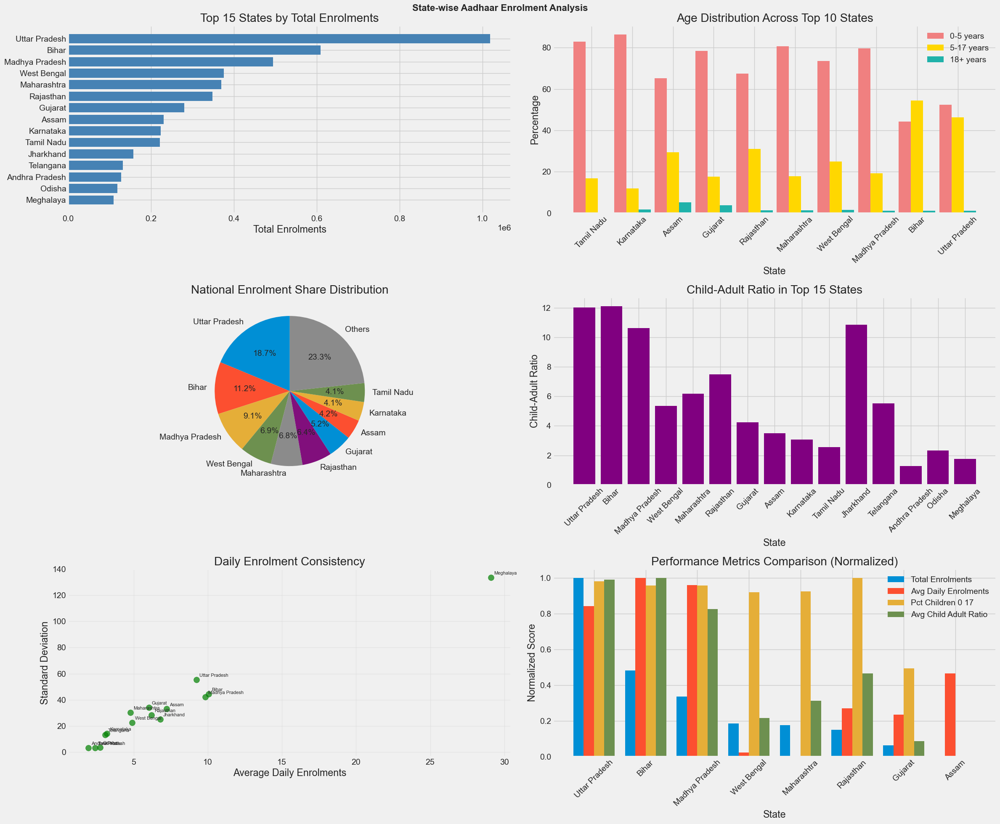

In [25]:
plt.style.use('fivethirtyeight')

# Create subplots
fig, axes = plt.subplots(3, 2, figsize=(24, 20))
fig.suptitle('State-wise Aadhaar Enrolment Analysis', fontsize=16, fontweight='bold')

# Plot 1: Top 15 states by total enrolments
top_15 = state_analysis.nlargest(15, 'total_enrolments')
axes[0, 0].barh(top_15['state'], top_15['total_enrolments'], color='steelblue')
axes[0, 0].set_title('Top 15 States by Total Enrolments')
axes[0, 0].set_xlabel('Total Enrolments')
axes[0, 0].invert_yaxis()

# Plot 2: Age distribution across states
sample_states = state_analysis.nlargest(10, 'total_enrolments')['state'].tolist()
age_data = state_analysis[state_analysis['state'].isin(sample_states)].sort_values('total_enrolments', ascending=True)
x = np.arange(len(sample_states))
width = 0.3
axes[0, 1].bar(x - width, age_data['avg_pct_0_5'], width, label='0-5 years', color='lightcoral')
axes[0, 1].bar(x, age_data['avg_pct_5_17'], width, label='5-17 years', color='gold')
axes[0, 1].bar(x + width, age_data['avg_pct_18_plus'], width, label='18+ years', color='lightseagreen')
axes[0, 1].set_title('Age Distribution Across Top 10 States')
axes[0, 1].set_xlabel('State')
axes[0, 1].set_ylabel('Percentage')
axes[0, 1].set_xticks(x)
axes[0, 1].set_xticklabels(age_data['state'], rotation=45)
axes[0, 1].legend()

# Plot 3: National share of top states
top_10_share = state_analysis.nlargest(10, 'national_share')
others_share = 100 - top_10_share['national_share'].sum()
pie_data = pd.concat([top_10_share['national_share'], pd.Series([others_share], index=['Others'])])
pie_labels = list(top_10_share['state']) + ['Others']
axes[1, 0].pie(pie_data, labels=pie_labels, autopct='%1.1f%%', startangle=90)
axes[1, 0].set_title('National Enrolment Share Distribution')

# Plot 4: Child-Adult ratio by state
ratio_data = state_analysis.nlargest(15, 'total_enrolments')
axes[1, 1].bar(ratio_data['state'], ratio_data['avg_child_adult_ratio'], color='purple')
axes[1, 1].set_title('Child-Adult Ratio in Top 15 States')
axes[1, 1].set_xlabel('State')
axes[1, 1].set_ylabel('Child-Adult Ratio')
axes[1, 1].tick_params(axis='x', rotation=45)

# Plot 5: Daily enrolment consistency
consistency_data = state_analysis.nlargest(15, 'total_enrolments')
axes[2, 0].scatter(consistency_data['avg_daily_enrolments'], 
                   consistency_data['std_daily_enrolments'],
                   s=100, alpha=0.7, color='green')
for i, row in consistency_data.iterrows():
    axes[2, 0].annotate(row['state'], 
                        (row['avg_daily_enrolments'], row['std_daily_enrolments']),
                        xytext=(5, 5), textcoords='offset points', fontsize=8)
axes[2, 0].set_title('Daily Enrolment Consistency')
axes[2, 0].set_xlabel('Average Daily Enrolments')
axes[2, 0].set_ylabel('Standard Deviation')
axes[2, 0].grid(True, alpha=0.3)

# Plot 6: Top states performance comparison
comparison_data = state_analysis.nlargest(8, 'total_enrolments')
metrics = ['total_enrolments', 'avg_daily_enrolments', 'pct_children_0_17', 'avg_child_adult_ratio']
normalized_data = comparison_data[metrics].copy()
for col in metrics:
    if col in normalized_data.columns:
        normalized_data[col] = (normalized_data[col] - normalized_data[col].min()) / (normalized_data[col].max() - normalized_data[col].min())

x_comparison = np.arange(len(comparison_data['state']))
width_comparison = 0.2
for idx, metric in enumerate(metrics):
    if metric in normalized_data.columns:
        axes[2, 1].bar(x_comparison + idx*width_comparison, normalized_data[metric], 
                       width_comparison, label=metric.replace('_', ' ').title())
axes[2, 1].set_title('Performance Metrics Comparison (Normalized)')
axes[2, 1].set_xlabel('State')
axes[2, 1].set_ylabel('Normalized Score')
axes[2, 1].set_xticks(x_comparison + width_comparison*1.5)
axes[2, 1].set_xticklabels(comparison_data['state'], rotation=45)
axes[2, 1].legend()

plt.tight_layout()
plt.show()

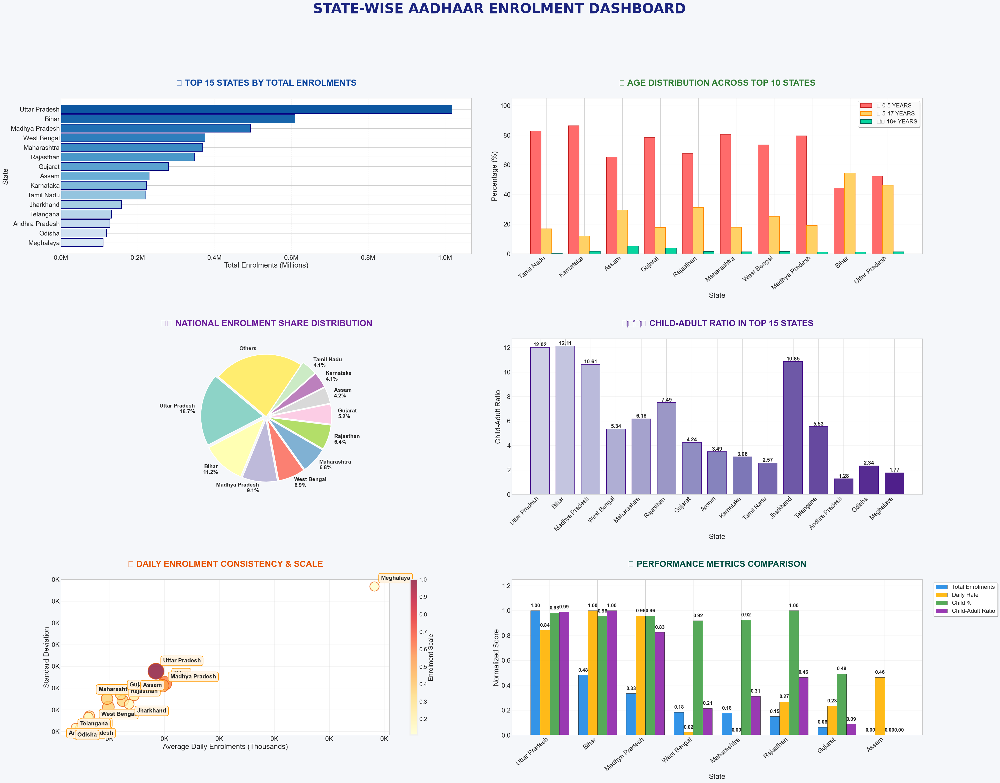

In [31]:
plt.style.use('fivethirtyeight')
plt.rcParams['axes.facecolor'] = '#FFFFFF'
plt.rcParams['figure.facecolor'] = '#F5F7FA'

fig, axes = plt.subplots(3, 2, figsize=(40, 30))
fig.suptitle('STATE-WISE AADHAAR ENROLMENT DASHBOARD', 
             fontsize=38, fontweight='heavy', y=1.03, 
             color='#1a237e', fontfamily='DejaVu Sans')

fig.subplots_adjust(hspace=0.65, wspace=0.5, top=0.92)

# Plot 1: Top 15 states by total enrolments
top_15 = state_analysis.nlargest(15, 'total_enrolments')
gradient = np.linspace(0.85, 0.15, len(top_15))
colors = plt.cm.Blues(gradient)
axes[0, 0].barh(top_15['state'], top_15['total_enrolments'], color=colors, edgecolor='navy', linewidth=1.5, height=0.85)
axes[0, 0].set_title('🏆 TOP 15 STATES BY TOTAL ENROLMENTS', fontsize=24, fontweight='bold', pad=35, color='#0d47a1')
axes[0, 0].set_xlabel('Total Enrolments (Millions)', fontsize=20)
axes[0, 0].set_ylabel('State', fontsize=20)
axes[0, 0].invert_yaxis()
axes[0, 0].tick_params(axis='both', labelsize=18)
axes[0, 0].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1e6:.1f}M'))
axes[0, 0].grid(axis='x', alpha=0.2, linestyle='--')

# Plot 2: Age distribution across states
sample_states = state_analysis.nlargest(10, 'total_enrolments')['state'].tolist()
age_data = state_analysis[state_analysis['state'].isin(sample_states)].sort_values('total_enrolments', ascending=True)
x = np.arange(len(sample_states))
width = 0.28
axes[0, 1].bar(x - width, age_data['avg_pct_0_5'], width, label='👶 0-5 YEARS', color='#FF6B6B', edgecolor='#c62828', linewidth=1.5)
axes[0, 1].bar(x, age_data['avg_pct_5_17'], width, label='🧒 5-17 YEARS', color='#FFD166', edgecolor='#ff8f00', linewidth=1.5)
axes[0, 1].bar(x + width, age_data['avg_pct_18_plus'], width, label='👨‍💼 18+ YEARS', color='#06D6A0', edgecolor='#00695c', linewidth=1.5)
axes[0, 1].set_title('📊 AGE DISTRIBUTION ACROSS TOP 10 STATES', fontsize=24, fontweight='bold', pad=35, color='#2e7d32')
axes[0, 1].set_xlabel('State', fontsize=20)
axes[0, 1].set_ylabel('Percentage (%)', fontsize=20)
axes[0, 1].set_xticks(x)
axes[0, 1].set_xticklabels(age_data['state'], rotation=40, ha='right', fontsize=18)
axes[0, 1].tick_params(axis='y', labelsize=18)
axes[0, 1].legend(fontsize=16, loc='upper right', frameon=True, framealpha=0.95, shadow=True)
axes[0, 1].set_ylim(0, 105)
axes[0, 1].grid(axis='y', alpha=0.15)

# Plot 3: National share of top states
top_10_share = state_analysis.nlargest(10, 'national_share')
others_share = 100 - top_10_share['national_share'].sum()
pie_data = pd.concat([top_10_share['national_share'], pd.Series([others_share], index=['Others'])])
pie_labels = [f"{state}\n{share:.1f}%" for state, share in zip(list(top_10_share['state']), list(top_10_share['national_share']))] + ['Others']
colors = plt.cm.Set3(np.linspace(0, 1, len(pie_data)))
explode = [0.05] * len(top_10_share) + [0]
wedges, texts, autotexts = axes[1, 0].pie(pie_data, labels=pie_labels, autopct='', 
                                          startangle=140, colors=colors, explode=explode,
                                          textprops={'fontsize': 14, 'fontweight': 'bold'})
axes[1, 0].set_title('🗺️ NATIONAL ENROLMENT SHARE DISTRIBUTION', fontsize=24, fontweight='bold', pad=35, color='#6a1b9a')
for text in texts:
    text.set_fontsize(15)
for wedge in wedges:
    wedge.set_edgecolor('white')
    wedge.set_linewidth(2)

# Plot 4: Child-Adult ratio by state
ratio_data = state_analysis.nlargest(15, 'total_enrolments')
colors_ratio = plt.cm.Purples(np.linspace(0.3, 0.9, len(ratio_data)))
bars = axes[1, 1].bar(ratio_data['state'], ratio_data['avg_child_adult_ratio'], 
               color=colors_ratio, edgecolor='#4a148c', linewidth=1.5, width=0.75)
axes[1, 1].set_title('👨‍👩‍👧‍👦 CHILD-ADULT RATIO IN TOP 15 STATES', fontsize=24, fontweight='bold', pad=35, color='#4a148c')
axes[1, 1].set_xlabel('State', fontsize=20)
axes[1, 1].set_ylabel('Child-Adult Ratio', fontsize=20)
axes[1, 1].tick_params(axis='both', labelsize=18)
plt.setp(axes[1, 1].get_xticklabels(), rotation=45, ha='right', fontsize=17)
for bar, ratio in zip(bars, ratio_data['avg_child_adult_ratio']):
    height = bar.get_height()
    axes[1, 1].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                   f'{ratio:.2f}', ha='center', va='bottom', fontsize=15, fontweight='bold')
axes[1, 1].grid(axis='y', alpha=0.2)

# Plot 5: Daily enrolment consistency
consistency_data = state_analysis.nlargest(15, 'total_enrolments')
x_center = consistency_data['avg_daily_enrolments'].median()
y_center = consistency_data['std_daily_enrolments'].median()
size_factor = consistency_data['total_enrolments'] / consistency_data['total_enrolments'].max()
sizes = 500 + size_factor * 1500

scatter = axes[2, 0].scatter(consistency_data['avg_daily_enrolments'], 
                   consistency_data['std_daily_enrolments'],
                   s=sizes, alpha=0.75, c=size_factor, cmap='YlOrRd', 
                   edgecolor='#e65100', linewidth=2)

offset_map = {}
for idx, row in consistency_data.iterrows():
    x_pos = row['avg_daily_enrolments']
    y_pos = row['std_daily_enrolments']
    
    if x_pos >= x_center and y_pos >= y_center:
        base_offset = (22, 22)
    elif x_pos < x_center and y_pos >= y_center:
        base_offset = (-22, 22)
    elif x_pos < x_center and y_pos < y_center:
        base_offset = (-22, -22)
    else:
        base_offset = (22, -22)
    
    final_offset = (base_offset[0] + np.random.uniform(-4, 4), 
                    base_offset[1] + np.random.uniform(-4, 4))
    offset_map[row['state']] = final_offset

for state, offset in offset_map.items():
    row = consistency_data[consistency_data['state'] == state].iloc[0]
    axes[2, 0].annotate(state, 
                       (row['avg_daily_enrolments'], row['std_daily_enrolments']),
                       xytext=offset, textcoords='offset points',
                       fontsize=16, fontweight='bold',
                       bbox=dict(boxstyle="round,pad=0.4", facecolor="#FFF3E0", 
                                edgecolor='#FF9800', alpha=0.95, linewidth=1.5))

axes[2, 0].set_title('📈 DAILY ENROLMENT CONSISTENCY & SCALE', fontsize=24, fontweight='bold', pad=35, color='#e65100')
axes[2, 0].set_xlabel('Average Daily Enrolments (Thousands)', fontsize=20)
axes[2, 0].set_ylabel('Standard Deviation', fontsize=20)
axes[2, 0].tick_params(axis='both', labelsize=18)
axes[2, 0].grid(True, alpha=0.25)
axes[2, 0].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1000:.0f}K'))
axes[2, 0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1000:.0f}K'))
cbar = plt.colorbar(scatter, ax=axes[2, 0])
cbar.set_label('Enrolment Scale', fontsize=18)
cbar.ax.tick_params(labelsize=16)

# Plot 6: Top states performance comparison
comparison_data = state_analysis.nlargest(8, 'total_enrolments')
metrics = ['total_enrolments', 'avg_daily_enrolments', 'pct_children_0_17', 'avg_child_adult_ratio']
metric_names = ['Total Enrolments', 'Daily Rate', 'Child %', 'Child-Adult Ratio']
normalized_data = comparison_data[metrics].copy()
for col in metrics:
    if col in normalized_data.columns:
        normalized_data[col] = (normalized_data[col] - normalized_data[col].min()) / (normalized_data[col].max() - normalized_data[col].min())

x_comparison = np.arange(len(comparison_data['state']))
width_comparison = 0.2
metric_colors = ['#1e88e5', '#ffb300', '#43a047', '#8e24aa']

for idx, (metric, name, color) in enumerate(zip(metrics, metric_names, metric_colors)):
    if metric in normalized_data.columns:
        bars = axes[2, 1].bar(x_comparison + idx*width_comparison, normalized_data[metric], 
                       width_comparison, label=name, color=color, edgecolor='black', alpha=0.9)
        for bar, val in zip(bars, normalized_data[metric]):
            axes[2, 1].text(bar.get_x() + bar.get_width()/2, val + 0.02,
                           f'{val:.2f}', ha='center', va='bottom', fontsize=14, fontweight='bold')

axes[2, 1].set_title('📋 PERFORMANCE METRICS COMPARISON', fontsize=24, fontweight='bold', pad=35, color='#004d40')
axes[2, 1].set_xlabel('State', fontsize=20)
axes[2, 1].set_ylabel('Normalized Score', fontsize=20)
axes[2, 1].set_xticks(x_comparison + width_comparison*1.5)
axes[2, 1].set_xticklabels(comparison_data['state'], rotation=40, ha='right', fontsize=18)
axes[2, 1].tick_params(axis='y', labelsize=18)
axes[2, 1].legend(fontsize=16, loc='upper left', bbox_to_anchor=(1.02, 1.0), frameon=True, shadow=True)
axes[2, 1].set_ylim(0, 1.25)
axes[2, 1].grid(axis='y', alpha=0.2)

# Add subtle borders to all subplots
for ax in axes.flat:
    for spine in ax.spines.values():
        spine.set_edgecolor('#CCCCCC')
        spine.set_linewidth(1.5)

plt.tight_layout(pad=4.0)
plt.savefig('aadhaar_analysis_dashboard.png', dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

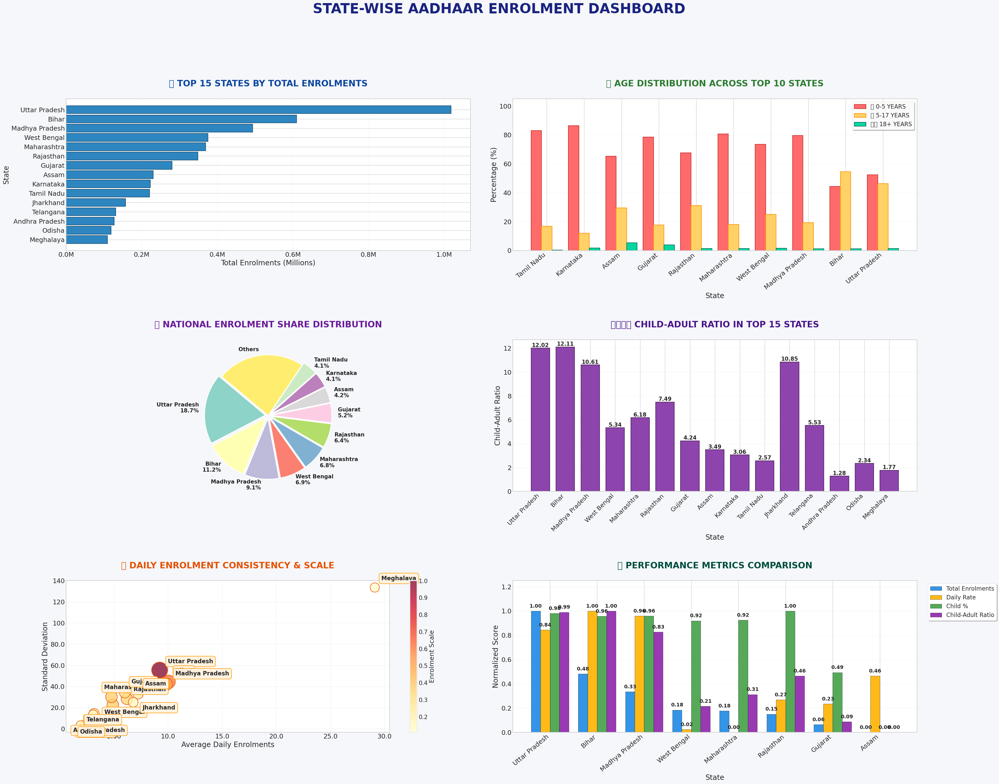

In [34]:
plt.style.use('fivethirtyeight')
plt.rcParams['axes.facecolor'] = '#FFFFFF'
plt.rcParams['figure.facecolor'] = '#F5F7FA'

fig, axes = plt.subplots(3, 2, figsize=(40, 30))
fig.suptitle('STATE-WISE AADHAAR ENROLMENT DASHBOARD', 
             fontsize=38, fontweight='heavy', y=1.03, 
             color='#1a237e', fontfamily='DejaVu Sans')

fig.subplots_adjust(hspace=0.65, wspace=0.5, top=0.92)

# Plot 1: Top 15 states by total enrolments - FIXED: Use static professional color
top_15 = state_analysis.nlargest(15, 'total_enrolments')
# FIXED: Changed gradient to static professional color
axes[0, 0].barh(top_15['state'], top_15['total_enrolments'], 
                color='#2E86C1', edgecolor='#1B4F72', linewidth=1.5, height=0.85)  # Single professional blue
axes[0, 0].set_title('🏆 TOP 15 STATES BY TOTAL ENROLMENTS', fontsize=24, fontweight='bold', pad=35, color='#0d47a1')
axes[0, 0].set_xlabel('Total Enrolments (Millions)', fontsize=20)
axes[0, 0].set_ylabel('State', fontsize=20)
axes[0, 0].invert_yaxis()
axes[0, 0].tick_params(axis='both', labelsize=18)
axes[0, 0].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1e6:.1f}M'))
axes[0, 0].grid(axis='x', alpha=0.2, linestyle='--')

# Plot 2: Age distribution across states
sample_states = state_analysis.nlargest(10, 'total_enrolments')['state'].tolist()
age_data = state_analysis[state_analysis['state'].isin(sample_states)].sort_values('total_enrolments', ascending=True)
x = np.arange(len(sample_states))
width = 0.28
axes[0, 1].bar(x - width, age_data['avg_pct_0_5'], width, label='👶 0-5 YEARS', color='#FF6B6B', edgecolor='#c62828', linewidth=1.5)
axes[0, 1].bar(x, age_data['avg_pct_5_17'], width, label='🧒 5-17 YEARS', color='#FFD166', edgecolor='#ff8f00', linewidth=1.5)
axes[0, 1].bar(x + width, age_data['avg_pct_18_plus'], width, label='👨‍💼 18+ YEARS', color='#06D6A0', edgecolor='#00695c', linewidth=1.5)
axes[0, 1].set_title('📊 AGE DISTRIBUTION ACROSS TOP 10 STATES', fontsize=24, fontweight='bold', pad=35, color='#2e7d32')
axes[0, 1].set_xlabel('State', fontsize=20)
axes[0, 1].set_ylabel('Percentage (%)', fontsize=20)
axes[0, 1].set_xticks(x)
axes[0, 1].set_xticklabels(age_data['state'], rotation=40, ha='right', fontsize=18)
axes[0, 1].tick_params(axis='y', labelsize=18)
axes[0, 1].legend(fontsize=16, loc='upper right', frameon=True, framealpha=0.95, shadow=True)
axes[0, 1].set_ylim(0, 105)
axes[0, 1].grid(axis='y', alpha=0.15)

# Plot 3: National share of top states
top_10_share = state_analysis.nlargest(10, 'national_share')
others_share = 100 - top_10_share['national_share'].sum()
pie_data = pd.concat([top_10_share['national_share'], pd.Series([others_share], index=['Others'])])
pie_labels = [f"{state}\n{share:.1f}%" for state, share in zip(list(top_10_share['state']), list(top_10_share['national_share']))] + ['Others']
colors = plt.cm.Set3(np.linspace(0, 1, len(pie_data)))
explode = [0.05] * len(top_10_share) + [0]
wedges, texts, autotexts = axes[1, 0].pie(pie_data, labels=pie_labels, autopct='', 
                                          startangle=140, colors=colors, explode=explode,
                                          textprops={'fontsize': 14, 'fontweight': 'bold'})
axes[1, 0].set_title('🗺️ NATIONAL ENROLMENT SHARE DISTRIBUTION', fontsize=24, fontweight='bold', pad=35, color='#6a1b9a')
for text in texts:
    text.set_fontsize(15)
for wedge in wedges:
    wedge.set_edgecolor('white')
    wedge.set_linewidth(2)

# Plot 4: Child-Adult ratio by state - FIXED: Use static professional color
ratio_data = state_analysis.nlargest(15, 'total_enrolments')
# FIXED: Changed gradient to static professional color
bars = axes[1, 1].bar(ratio_data['state'], ratio_data['avg_child_adult_ratio'], 
               color='#8E44AD', edgecolor='#4A235A', linewidth=1.5, width=0.75)  # Single professional purple
axes[1, 1].set_title('👨‍👩‍👧‍👦 CHILD-ADULT RATIO IN TOP 15 STATES', fontsize=24, fontweight='bold', pad=35, color='#4a148c')
axes[1, 1].set_xlabel('State', fontsize=20)
axes[1, 1].set_ylabel('Child-Adult Ratio', fontsize=20)
axes[1, 1].tick_params(axis='both', labelsize=18)
plt.setp(axes[1, 1].get_xticklabels(), rotation=45, ha='right', fontsize=17)

# FIXED: Format ratio values properly to avoid "0.000.00"
for bar, ratio in zip(bars, ratio_data['avg_child_adult_ratio']):
    height = bar.get_height()
    # Format with 2 decimal places, not scientific notation
    formatted_ratio = f'{ratio:.3f}' if ratio < 1 else f'{ratio:.2f}'
    axes[1, 1].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                   formatted_ratio, ha='center', va='bottom', fontsize=15, fontweight='bold')

axes[1, 1].grid(axis='y', alpha=0.2)

# Plot 5: Daily enrolment consistency - FIXED: x-axis formatting
consistency_data = state_analysis.nlargest(15, 'total_enrolments')
x_center = consistency_data['avg_daily_enrolments'].median()
y_center = consistency_data['std_daily_enrolments'].median()
size_factor = consistency_data['total_enrolments'] / consistency_data['total_enrolments'].max()
sizes = 500 + size_factor * 1500

scatter = axes[2, 0].scatter(consistency_data['avg_daily_enrolments'], 
                   consistency_data['std_daily_enrolments'],
                   s=sizes, alpha=0.75, c=size_factor, cmap='YlOrRd', 
                   edgecolor='#e65100', linewidth=2)

offset_map = {}
for idx, row in consistency_data.iterrows():
    x_pos = row['avg_daily_enrolments']
    y_pos = row['std_daily_enrolments']
    
    if x_pos >= x_center and y_pos >= y_center:
        base_offset = (22, 22)
    elif x_pos < x_center and y_pos >= y_center:
        base_offset = (-22, 22)
    elif x_pos < x_center and y_pos < y_center:
        base_offset = (-22, -22)
    else:
        base_offset = (22, -22)
    
    final_offset = (base_offset[0] + np.random.uniform(-4, 4), 
                    base_offset[1] + np.random.uniform(-4, 4))
    offset_map[row['state']] = final_offset

for state, offset in offset_map.items():
    row = consistency_data[consistency_data['state'] == state].iloc[0]
    axes[2, 0].annotate(state, 
                       (row['avg_daily_enrolments'], row['std_daily_enrolments']),
                       xytext=offset, textcoords='offset points',
                       fontsize=16, fontweight='bold',
                       bbox=dict(boxstyle="round,pad=0.4", facecolor="#FFF3E0", 
                                edgecolor='#FF9800', alpha=0.95, linewidth=1.5))

axes[2, 0].set_title('📈 DAILY ENROLMENT CONSISTENCY & SCALE', fontsize=24, fontweight='bold', pad=35, color='#e65100')
axes[2, 0].set_xlabel('Average Daily Enrolments', fontsize=20)
axes[2, 0].set_ylabel('Standard Deviation', fontsize=20)
axes[2, 0].tick_params(axis='both', labelsize=18)
axes[2, 0].grid(True, alpha=0.25)

# FIXED: Proper x-axis formatting to handle small values
def format_axis(x, p):
    if x >= 1e6:
        return f'{x/1e6:.1f}M'
    elif x >= 1e5:
        return f'{x/1e3:.0f}K'
    elif x >= 1000:
        return f'{x/1e3:.1f}K'
    elif x >= 100:
        return f'{x:.0f}'
    elif x >= 10:
        return f'{x:.1f}'
    elif x > 0:
        return f'{x:.2f}'
    else:
        return '0'

# Apply the fixed formatter to both axes
axes[2, 0].xaxis.set_major_formatter(plt.FuncFormatter(format_axis))
axes[2, 0].yaxis.set_major_formatter(plt.FuncFormatter(format_axis))

cbar = plt.colorbar(scatter, ax=axes[2, 0])
cbar.set_label('Enrolment Scale', fontsize=18)
cbar.ax.tick_params(labelsize=16)

# Plot 6: Top states performance comparison
comparison_data = state_analysis.nlargest(8, 'total_enrolments')
metrics = ['total_enrolments', 'avg_daily_enrolments', 'pct_children_0_17', 'avg_child_adult_ratio']
metric_names = ['Total Enrolments', 'Daily Rate', 'Child %', 'Child-Adult Ratio']
normalized_data = comparison_data[metrics].copy()
for col in metrics:
    if col in normalized_data.columns:
        normalized_data[col] = (normalized_data[col] - normalized_data[col].min()) / (normalized_data[col].max() - normalized_data[col].min())

x_comparison = np.arange(len(comparison_data['state']))
width_comparison = 0.2
metric_colors = ['#1e88e5', '#ffb300', '#43a047', '#8e24aa']

for idx, (metric, name, color) in enumerate(zip(metrics, metric_names, metric_colors)):
    if metric in normalized_data.columns:
        bars = axes[2, 1].bar(x_comparison + idx*width_comparison, normalized_data[metric], 
                       width_comparison, label=name, color=color, edgecolor='black', alpha=0.9)
        for bar, val in zip(bars, normalized_data[metric]):
            axes[2, 1].text(bar.get_x() + bar.get_width()/2, val + 0.02,
                           f'{val:.2f}', ha='center', va='bottom', fontsize=14, fontweight='bold')

axes[2, 1].set_title('📋 PERFORMANCE METRICS COMPARISON', fontsize=24, fontweight='bold', pad=35, color='#004d40')
axes[2, 1].set_xlabel('State', fontsize=20)
axes[2, 1].set_ylabel('Normalized Score', fontsize=20)
axes[2, 1].set_xticks(x_comparison + width_comparison*1.5)
axes[2, 1].set_xticklabels(comparison_data['state'], rotation=40, ha='right', fontsize=18)
axes[2, 1].tick_params(axis='y', labelsize=18)
axes[2, 1].legend(fontsize=16, loc='upper left', bbox_to_anchor=(1.02, 1.0), frameon=True, shadow=True)
axes[2, 1].set_ylim(0, 1.25)
axes[2, 1].grid(axis='y', alpha=0.2)

# Add subtle borders to all subplots
for ax in axes.flat:
    for spine in ax.spines.values():
        spine.set_edgecolor('#CCCCCC')
        spine.set_linewidth(1.5)

plt.tight_layout(pad=4.0)
plt.savefig('aadhaar_analysis_dashboard.png', dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

#### 4.4.8 [ KEY INSIGHTS FROM STATE-WISE ANALYSIS ] 

In [35]:
print("\n" + "="*80)
print("KEY INSIGHTS FROM STATE-WISE ANALYSIS")
print("="*80)

# Insight 1: Top performing states
top_3_states = top_states.head(3)
print(f"\n1. TOP PERFORMERS:")
for idx, row in top_3_states.iterrows():
    print(f"   - {row['state']}: {row['total_enrolments']:,} enrolments "
          f"({row['total_enrolments']/total_national*100:.1f}% of national total)")

# Insight 2: Child enrolment patterns
if not high_child_states.empty:
    print(f"\n2. CHILD ENROLMENT FOCUS STATES:")
    for idx, row in high_child_states.head(3).iterrows():
        print(f"   - {row['state']}: {row['pct_children_0_17']:.1f}% children enrolment")

# Insight 3: Most consistent enrolments
if not consistent_states.empty and 'std_daily_enrolments' in consistent_states.columns:
    most_consistent_state = consistent_states.nsmallest(1, 'std_daily_enrolments')
    if not most_consistent_state.empty:
        print(f"\n3. MOST CONSISTENT STATE:")
        print(f"   - {most_consistent_state['state'].iloc[0]}: "
              f"Avg {most_consistent_state['avg_daily_enrolments'].iloc[0]:.1f} ± "
              f"{most_consistent_state['std_daily_enrolments'].iloc[0]:.1f} daily enrolments")

# Insight 4: Growth champions
if not valid_growth_data.empty and 'yoy_growth' in valid_growth_data.columns:
    # Filter for meaningful growth (positive growth)
    positive_growth = valid_growth_data[valid_growth_data['yoy_growth'] > 0]
    if not positive_growth.empty:
        growth_champ = positive_growth.nlargest(1, 'yoy_growth')
        if not growth_champ.empty:
            print(f"\n4. FASTEST GROWING STATE:")
            print(f"   - {growth_champ['state'].iloc[0]}: "
                  f"{growth_champ['yoy_growth'].iloc[0]:.1f}% YoY growth")

# Insight 5: Concentration analysis
if not states_80_percent.empty:
    print(f"\n5. MARKET CONCENTRATION:")
    print(f"   - Top {len(states_80_percent)} states account for 80% of all enrolments")
    if len(states_80_percent) <= 10:
        states_list = ', '.join(states_80_percent['state'].tolist())
        print(f"     States: {states_list}")

# Insight 6: Demographic patterns
print(f"\n6. NATIONAL DEMOGRAPHIC SNAPSHOT:")
national_child_pct = ((state_analysis['total_0_5'].sum() + state_analysis['total_5_17'].sum()) / 
                      state_analysis['total_enrolments'].sum()) * 100
national_adult_pct = (state_analysis['total_18_plus'].sum() / 
                      state_analysis['total_enrolments'].sum()) * 100
print(f"   - Children (0-17 years): {national_child_pct:.1f}%")
print(f"   - Adults (18+ years): {national_adult_pct:.1f}%")

# Insight 7: Performance range
print(f"\n7. PERFORMANCE RANGE ACROSS STATES:")
print(f"   - Highest daily avg: {state_analysis['avg_daily_enrolments'].max():.1f} enrolments/day")
print(f"   - Lowest daily avg: {state_analysis['avg_daily_enrolments'].min():.1f} enrolments/day")
print(f"   - Average across states: {state_analysis['avg_daily_enrolments'].mean():.1f} enrolments/day")

print("\n" + "="*80)
print("ANALYSIS COMPLETE")
print("="*80)


KEY INSIGHTS FROM STATE-WISE ANALYSIS

1. TOP PERFORMERS:
   - Uttar Pradesh: 1,018,629 enrolments (18.7% of national total)
   - Bihar: 609,585 enrolments (11.2% of national total)
   - Madhya Pradesh: 493,970 enrolments (9.1% of national total)

2. CHILD ENROLMENT FOCUS STATES:
   - Andaman & Nicobar Islands: 100.0% children enrolment
   - Andaman and Nicobar Islands: 100.0% children enrolment
   - Andhra Pradesh: 98.8% children enrolment

3. MOST CONSISTENT STATE:
   - West  Bengal: Avg 1.0 ± 0.0 daily enrolments

5. MARKET CONCENTRATION:
   - Top 45 states account for 80% of all enrolments

6. NATIONAL DEMOGRAPHIC SNAPSHOT:
   - Children (0-17 years): 96.9%
   - Adults (18+ years): 3.1%

7. PERFORMANCE RANGE ACROSS STATES:
   - Highest daily avg: 475.0 enrolments/day
   - Lowest daily avg: 1.0 enrolments/day
   - Average across states: 19.1 enrolments/day

ANALYSIS COMPLETE


#### 4.4.9  [ STATE CATEGORIZATION BY PERFORMANCE ]

In [486]:
print("\n" + "="*80)
print("STATE CATEGORIZATION BY PERFORMANCE")
print("="*80)

# Categorize states based on multiple metrics
state_analysis['performance_score'] = (
    (state_analysis['total_enrolments'] / state_analysis['total_enrolments'].max()) * 0.4 +
    (state_analysis['avg_daily_enrolments'] / state_analysis['avg_daily_enrolments'].max()) * 0.3 +
    (1 - (state_analysis['std_daily_enrolments'] / state_analysis['std_daily_enrolments'].max())) * 0.3
)

# Create performance categories
state_analysis['performance_category'] = pd.qcut(state_analysis['performance_score'], 
                                                  q=4, 
                                                  labels=['Low', 'Medium', 'High', 'Very High'])

print("\nState Performance Categories:")
category_summary = state_analysis.groupby('performance_category').agg({
    'state': 'count',
    'total_enrolments': 'mean',
    'avg_daily_enrolments': 'mean',
    'pct_children_0_17': 'mean'
}).round(2)
print(category_summary)

print("\nStates by Performance Category:")
for category in ['Very High', 'High', 'Medium', 'Low']:
    states_in_category = state_analysis[state_analysis['performance_category'] == category]['state'].tolist()
    if states_in_category:
        print(f"\n{category} Performance ({len(states_in_category)} states):")
        print(f"  {', '.join(states_in_category)}")


STATE CATEGORIZATION BY PERFORMANCE

State Performance Categories:
                      state  total_enrolments  avg_daily_enrolments  \
performance_category                                                  
Low                      14          33818.43                 32.26   
Medium                   13            608.00                  1.63   
High                     13          41309.38                  2.35   
Very High                13         339793.54                 41.81   

                      pct_children_0_17  
performance_category                     
Low                               87.56  
Medium                            98.03  
High                              99.28  
Very High                         97.06  

States by Performance Category:

Very High Performance (13 states):
  Andhra Pradesh, Assam, Bihar, Gujarat, Jammu And Kashmir, Karnataka, Madhya Pradesh, Maharashtra, Odisha, Rajasthan, Tamil Nadu, Uttar Pradesh, West Bengal

High Performance (13 stat

#### 4.4.10 [ EXPORT KEY FINDINGS ]

In [36]:
# Create a summary DataFrame for export
summary_report = state_analysis[[
    'state', 'total_enrolments', 'national_share', 
    'avg_daily_enrolments', 'std_daily_enrolments',
    'pct_children_0_17', 'avg_child_adult_ratio',
    'performance_category'
]].sort_values('total_enrolments', ascending=False)

print("\n" + "="*80)
print("SUMMARY REPORT (Top 20 States)")
print("="*80)
print(summary_report.head(20).to_string(index=False))

KeyError: "['performance_category'] not in index"

### 4.5 District-wise Analysis of Aadhaar Enrolments

In [37]:
print("Starting district-wise analysis...")
print(f"Total districts in dataset: {df['district'].nunique()}")
print(f"Total states in dataset: {df['state'].nunique()}")

Starting district-wise analysis...
Total districts in dataset: 985
Total states in dataset: 55


#### 4.5.1 [ DISTRICT-LEVEL SUMMARY STATISTICS ]

In [38]:
# Group by state and district for aggregated analysis
district_analysis = df.groupby(['state', 'district']).agg({
    'total_enrolments': ['sum', 'mean', 'std', 'count'],
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum',
    'child_adult_ratio': 'mean',
    'pct_0_5': 'mean',
    'pct_5_17': 'mean',
    'pct_18_plus': 'mean',
    'pincode': 'nunique'  # Number of unique pincodes in each district
}).round(2)

# Flatten multi-index columns
district_analysis.columns = ['_'.join(col).strip() for col in district_analysis.columns.values]
district_analysis = district_analysis.reset_index()

# Rename for clarity
district_analysis.rename(columns={
    'total_enrolments_sum': 'total_enrolments',
    'total_enrolments_mean': 'avg_daily_enrolments',
    'total_enrolments_std': 'std_daily_enrolments',
    'total_enrolments_count': 'records_count',
    'age_0_5_sum': 'total_0_5',
    'age_5_17_sum': 'total_5_17',
    'age_18_greater_sum': 'total_18_plus',
    'child_adult_ratio_mean': 'avg_child_adult_ratio',
    'pct_0_5_mean': 'avg_pct_0_5',
    'pct_5_17_mean': 'avg_pct_5_17',
    'pct_18_plus_mean': 'avg_pct_18_plus',
    'pincode_nunique': 'unique_pincodes'
}, inplace=True)

# Calculate additional metrics
district_analysis['pct_children_0_17'] = ((district_analysis['total_0_5'] + district_analysis['total_5_17']) / 
                                          district_analysis['total_enrolments']) * 100
district_analysis['enrolments_per_pincode'] = district_analysis['total_enrolments'] / district_analysis['unique_pincodes']
district_analysis['coverage_density'] = district_analysis['records_count'] / district_analysis['unique_pincodes']

print(f"\nTotal districts analyzed: {len(district_analysis)}")


Total districts analyzed: 1070


#### 4.5.2 [ TOP/BOTTOM PERFORMING DISTRICTS NATIONALLY ]

In [39]:
print("\n" + "="*100)
print("TOP 20 DISTRICTS NATIONALLY BY TOTAL ENROLMENTS")
print("="*100)
top_districts_national = district_analysis.nlargest(20, 'total_enrolments')[['state', 'district', 'total_enrolments', 'avg_daily_enrolments', 'unique_pincodes']]
print(top_districts_national.to_string(index=False))

print("\n" + "="*100)
print("BOTTOM 20 DISTRICTS NATIONALLY BY TOTAL ENROLMENTS")
print("="*100)
bottom_districts_national = district_analysis.nsmallest(20, 'total_enrolments')[['state', 'district', 'total_enrolments', 'avg_daily_enrolments', 'unique_pincodes']]
print(bottom_districts_national.to_string(index=False))


TOP 20 DISTRICTS NATIONALLY BY TOTAL ENROLMENTS
        state          district  total_enrolments  avg_daily_enrolments  unique_pincodes
  Maharashtra             Thane             43688                 10.31               93
        Bihar         Sitamarhi             42232                 25.26               25
Uttar Pradesh          Bahraich             39338                 24.82               25
  West Bengal       Murshidabad             35911                  7.87               98
  West Bengal South 24 Parganas             33540                  7.36               92
  Maharashtra              Pune             31763                  4.77              147
    Rajasthan            Jaipur             31146                  6.67               81
    Karnataka         Bengaluru             30980                  5.84              125
Uttar Pradesh           Sitapur             30854                 17.94               25
        Bihar    West Champaran             30438            

#### 4.5.3 [ TOP DISTRICTS WITHIN EACH STATE ]

In [40]:
print("\n" + "="*100)
print("TOP 3 DISTRICTS IN EACH STATE BY ENROLMENTS")
print("="*100)

# Get top 3 districts per state
top_districts_per_state = district_analysis.sort_values(['state', 'total_enrolments'], ascending=[True, False])
top_3_per_state = top_districts_per_state.groupby('state').head(3)

# Display in a readable format
for state in sorted(top_3_per_state['state'].unique()):
    state_districts = top_3_per_state[top_3_per_state['state'] == state]
    print(f"\n{state}:")
    for idx, row in state_districts.iterrows():
        print(f"  {row['district']}: {row['total_enrolments']:,} enrolments "
              f"(Avg: {row['avg_daily_enrolments']:.1f}/day)")


TOP 3 DISTRICTS IN EACH STATE BY ENROLMENTS

100000:
  100000: 218 enrolments (Avg: 9.9/day)

Andaman & Nicobar Islands:
  Andamans: 75 enrolments (Avg: 1.1/day)
  South Andaman: 38 enrolments (Avg: 1.1/day)
  Nicobars: 1 enrolments (Avg: 1.0/day)

Andaman and Nicobar Islands:
  South Andaman: 190 enrolments (Avg: 1.2/day)
  North And Middle Andaman: 132 enrolments (Avg: 1.3/day)
  Nicobar: 75 enrolments (Avg: 2.0/day)

Andhra Pradesh:
  Kurnool: 11,770 enrolments (Avg: 3.0/day)
  Guntur: 9,729 enrolments (Avg: 2.4/day)
  Chittoor: 8,195 enrolments (Avg: 2.3/day)

Arunachal Pradesh:
  Longding: 897 enrolments (Avg: 11.5/day)
  Changlang: 803 enrolments (Avg: 4.4/day)
  Papum Pare: 447 enrolments (Avg: 1.9/day)

Assam:
  Cachar: 17,514 enrolments (Avg: 6.8/day)
  Karimganj: 14,833 enrolments (Avg: 9.5/day)
  Barpeta: 14,383 enrolments (Avg: 11.2/day)

Bihar:
  Sitamarhi: 42,232 enrolments (Avg: 25.3/day)
  West Champaran: 30,438 enrolments (Avg: 23.8/day)
  East Champaran: 29,323 enrol

#### 4.5.4 [ DISTRICT PERFORMANCE METRICS ]

In [41]:
print("\n" + "="*100)
print("DISTRICT PERFORMANCE METRICS")
print("="*100)

# Highest daily average districts
print("\nDISTRICTS WITH HIGHEST DAILY ENROLMENT RATES:")
high_daily_districts = district_analysis.nlargest(10, 'avg_daily_enrolments')[['state', 'district', 'avg_daily_enrolments', 'total_enrolments', 'records_count']]
print(high_daily_districts.to_string(index=False))

# Most consistent districts (lowest variability)
print("\nMOST CONSISTENT DISTRICTS (Lowest Daily Variability):")
consistent_districts = district_analysis[district_analysis['records_count'] > 10]  # Filter for sufficient data
if not consistent_districts.empty:
    most_consistent = consistent_districts.nsmallest(10, 'std_daily_enrolments')[['state', 'district', 'avg_daily_enrolments', 'std_daily_enrolments']]
    print(most_consistent.to_string(index=False))

# Districts with highest child enrolment
print("\nDISTRICTS WITH HIGHEST CHILD ENROLMENT PERCENTAGE:")
high_child_districts = district_analysis.nlargest(10, 'pct_children_0_17')[['state', 'district', 'pct_children_0_17', 'total_enrolments', 'avg_child_adult_ratio']]
print(high_child_districts.to_string(index=False))


DISTRICT PERFORMANCE METRICS

DISTRICTS WITH HIGHEST DAILY ENROLMENT RATES:
            state           district  avg_daily_enrolments  total_enrolments  records_count
    Uttar Pradesh        Kushi Nagar               1570.00              1570              1
      West Bengal     Dinajpur Uttar               1061.00             11671             11
          Haryana                Nuh                753.00              1506              2
    Uttar Pradesh    Siddharth Nagar                723.50              4341              6
    Uttar Pradesh          Shravasti                633.75              2535              4
            Bihar    Purbi Champaran                619.62             14871             24
   Madhya Pradesh         Ashoknagar                602.20              3011              5
Jammu And Kashmir               Doda                538.00               538              1
      West Bengal   Dinajpur Dakshin                498.50               997              2
   

#### 4.5.5 [ DISTRICT COVERAGE AND DENSITY ANALYSIS ]

In [42]:
print("\n" + "="*100)
print("DISTRICT COVERAGE AND DENSITY ANALYSIS")
print("="*100)

# Districts with highest pincode coverage
print("\nDISTRICTS WITH WIDEST GEOGRAPHIC COVERAGE (Most Pincodes):")
wide_coverage = district_analysis.nlargest(10, 'unique_pincodes')[['state', 'district', 'unique_pincodes', 'enrolments_per_pincode', 'total_enrolments']]
print(wide_coverage.to_string(index=False))

# Districts with highest enrolment density
print("\nDISTRICTS WITH HIGHEST ENROLMENT DENSITY (Enrolments per Pincode):")
high_density = district_analysis.nlargest(10, 'enrolments_per_pincode')[['state', 'district', 'enrolments_per_pincode', 'unique_pincodes', 'total_enrolments']]
print(high_density.to_string(index=False))

# Districts with highest coverage density
print("\nDISTRICTS WITH HIGHEST COVERAGE DENSITY (Records per Pincode):")
high_coverage_density = district_analysis.nlargest(10, 'coverage_density')[['state', 'district', 'coverage_density', 'unique_pincodes', 'records_count']]
print(high_coverage_density.to_string(index=False))


DISTRICT COVERAGE AND DENSITY ANALYSIS

DISTRICTS WITH WIDEST GEOGRAPHIC COVERAGE (Most Pincodes):
         state           district  unique_pincodes  enrolments_per_pincode  total_enrolments
        Kerala           Thrissur              168               42.089286              7071
   West Bengal         Barddhaman              167               94.826347             15836
   West Bengal  North 24 Parganas              150              190.706667             28606
Andhra Pradesh      East Godavari              147               52.231293              7678
   Maharashtra               Pune              147              216.074830             31763
        Kerala           Palakkad              138               48.724638              6724
        Kerala          Ernakulam              135               46.844444              6324
        Kerala Thiruvananthapuram              130               51.253846              6663
     Karnataka          Bengaluru              125             

#### 4.5.6 DISTRICT PERFORMANCE CLUSTERING

In [43]:
print("\n" + "="*100)
print("DISTRICT PERFORMANCE CLUSTERING")
print("="*100)

# Create performance score for clustering
district_analysis['performance_score'] = (
    (district_analysis['total_enrolments'] / district_analysis['total_enrolments'].max()) * 0.3 +
    (district_analysis['avg_daily_enrolments'] / district_analysis['avg_daily_enrolments'].max()) * 0.3 +
    (1 - (district_analysis['std_daily_enrolments'] / district_analysis['std_daily_enrolments'].max())) * 0.2 +
    (district_analysis['coverage_density'] / district_analysis['coverage_density'].max()) * 0.2
)

# Categorize districts into performance tiers
district_analysis['performance_tier'] = pd.qcut(district_analysis['performance_score'], 
                                                q=5, 
                                                labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])

print("\nDistrict Performance Tier Distribution:")
tier_distribution = district_analysis['performance_tier'].value_counts().sort_index()
for tier, count in tier_distribution.items():
    percentage = (count / len(district_analysis)) * 100
    print(f"  {tier}: {count} districts ({percentage:.1f}%)")


DISTRICT PERFORMANCE CLUSTERING

District Performance Tier Distribution:
  Very Low: 208 districts (19.4%)
  Low: 207 districts (19.3%)
  Medium: 208 districts (19.4%)
  High: 207 districts (19.3%)
  Very High: 208 districts (19.4%)


#### 4.5.7 [ STATE-WISE DISTRICT PERFORMANCE DISTRIBUTION ]

In [44]:
print("\n" + "="*100)
print("STATE-WISE DISTRICT PERFORMANCE DISTRIBUTION")
print("="*100)

# Analyze district distribution within each state
state_district_summary = district_analysis.groupby('state').agg({
    'district': 'count',
    'total_enrolments': ['sum', 'mean', 'std'],
    'performance_tier': lambda x: (x == 'Very High').sum()
}).round(2)

state_district_summary.columns = ['num_districts', 'state_total_enrolments', 
                                  'avg_district_enrolments', 'std_district_enrolments',
                                  'high_performing_districts']

state_district_summary = state_district_summary.reset_index()

print("\nStates with Most High-Performing Districts:")
high_performing_states = state_district_summary.nlargest(10, 'high_performing_districts')
print(high_performing_states[['state', 'high_performing_districts', 'num_districts', 
                             'state_total_enrolments']].to_string(index=False))

# Calculate district efficiency (enrolments per district)
state_district_summary['enrolments_per_district'] = state_district_summary['state_total_enrolments'] / state_district_summary['num_districts']

print("\nStates with Highest Enrolments per District:")
efficient_states = state_district_summary.nlargest(10, 'enrolments_per_district')
print(efficient_states[['state', 'enrolments_per_district', 'num_districts', 
                       'state_total_enrolments']].to_string(index=False))


STATE-WISE DISTRICT PERFORMANCE DISTRIBUTION

States with Most High-Performing Districts:
         state  high_performing_districts  num_districts  state_total_enrolments
 Uttar Pradesh                         52             89                 1018629
Madhya Pradesh                         31             61                  493970
         Bihar                         30             48                  609585
     Rajasthan                         21             43                  348458
   Maharashtra                         14             53                  369139
   West Bengal                         12             58                  375297
         Assam                          9             38                  230197
         Delhi                          7             14                   94529
     Jharkhand                          6             35                  157539
       Gujarat                          5             40                  280549

States with Highe

#### 4.5.8 [ VISUALIZATIONS ]

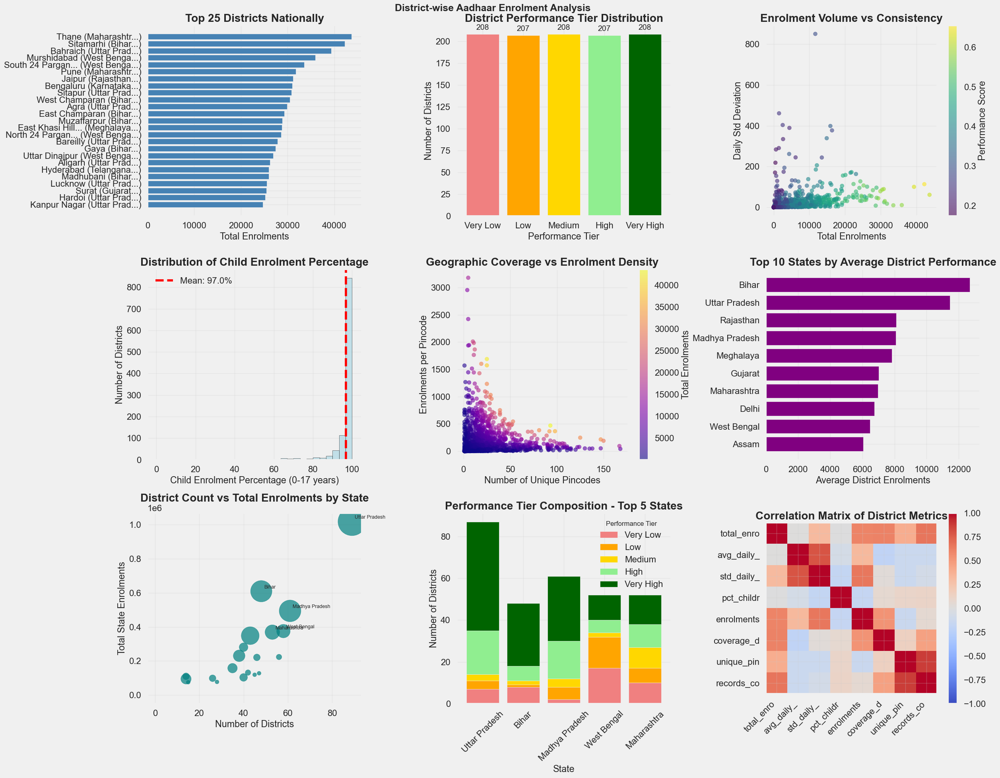

In [512]:
plt.style.use('fivethirtyeight')

# Create comprehensive visualizations
fig = plt.figure(figsize=(25, 20))
fig.suptitle('District-wise Aadhaar Enrolment Analysis', fontsize=18, fontweight='bold')

# Plot 1: Top 25 districts nationally
ax1 = plt.subplot(3, 3, 1)
top_25 = district_analysis.nlargest(25, 'total_enrolments')
ax1.barh(range(len(top_25)), top_25['total_enrolments'], color='steelblue')
ax1.set_yticks(range(len(top_25)))
ax1.set_yticklabels(top_25.apply(lambda x: f"{x['district'][:15]}... ({x['state'][:10]}...)" 
                                 if len(x['district']) > 15 else f"{x['district']} ({x['state'][:10]}...)", axis=1))
ax1.set_xlabel('Total Enrolments')
ax1.set_title('Top 25 Districts Nationally')
ax1.invert_yaxis()

# Plot 2: District performance tiers distribution
ax2 = plt.subplot(3, 3, 2)
tier_counts = district_analysis['performance_tier'].value_counts().sort_index()
colors = ['lightcoral', 'orange', 'gold', 'lightgreen', 'darkgreen']
ax2.bar(tier_counts.index, tier_counts.values, color=colors)
ax2.set_xlabel('Performance Tier')
ax2.set_ylabel('Number of Districts')
ax2.set_title('District Performance Tier Distribution')
for i, v in enumerate(tier_counts.values):
    ax2.text(i, v + 5, str(v), ha='center')

# Plot 3: Scatter plot of enrolment vs consistency
ax3 = plt.subplot(3, 3, 3)
scatter = ax3.scatter(district_analysis['total_enrolments'], 
                     district_analysis['std_daily_enrolments'],
                     c=district_analysis['performance_score'], 
                     cmap='viridis', alpha=0.6, s=50)
ax3.set_xlabel('Total Enrolments')
ax3.set_ylabel('Daily Std Deviation')
ax3.set_title('Enrolment Volume vs Consistency')
ax3.grid(True, alpha=0.3)
plt.colorbar(scatter, ax=ax3, label='Performance Score')

# Plot 4: Child enrolment percentage distribution
ax4 = plt.subplot(3, 3, 4)
ax4.hist(district_analysis['pct_children_0_17'], bins=30, edgecolor='black', alpha=0.7, color='lightblue')
ax4.axvline(district_analysis['pct_children_0_17'].mean(), color='red', linestyle='--', 
           label=f'Mean: {district_analysis["pct_children_0_17"].mean():.1f}%')
ax4.set_xlabel('Child Enrolment Percentage (0-17 years)')
ax4.set_ylabel('Number of Districts')
ax4.set_title('Distribution of Child Enrolment Percentage')
ax4.legend()
ax4.grid(True, alpha=0.3)

# Plot 5: Enrolments per pincode vs unique pincodes
ax5 = plt.subplot(3, 3, 5)
scatter2 = ax5.scatter(district_analysis['unique_pincodes'], 
                      district_analysis['enrolments_per_pincode'],
                      c=district_analysis['total_enrolments'], 
                      cmap='plasma', alpha=0.6, s=50)
ax5.set_xlabel('Number of Unique Pincodes')
ax5.set_ylabel('Enrolments per Pincode')
ax5.set_title('Geographic Coverage vs Enrolment Density')
ax5.grid(True, alpha=0.3)
plt.colorbar(scatter2, ax=ax5, label='Total Enrolments')

# Plot 6: Top 10 states by average district enrolment
ax6 = plt.subplot(3, 3, 6)
top_states_avg = state_district_summary.nlargest(10, 'avg_district_enrolments')
ax6.barh(range(len(top_states_avg)), top_states_avg['avg_district_enrolments'], color='purple')
ax6.set_yticks(range(len(top_states_avg)))
ax6.set_yticklabels(top_states_avg['state'])
ax6.set_xlabel('Average District Enrolments')
ax6.set_title('Top 10 States by Average District Performance')
ax6.invert_yaxis()

# Plot 7: District count vs total enrolments by state
ax7 = plt.subplot(3, 3, 7)
scatter3 = ax7.scatter(state_district_summary['num_districts'], 
                      state_district_summary['state_total_enrolments'],
                      s=state_district_summary['high_performing_districts']*50, 
                      alpha=0.7, c='teal')
ax7.set_xlabel('Number of Districts')
ax7.set_ylabel('Total State Enrolments')
ax7.set_title('District Count vs Total Enrolments by State')
ax7.grid(True, alpha=0.3)
# Add state labels for top states
for idx, row in state_district_summary.nlargest(5, 'state_total_enrolments').iterrows():
    ax7.annotate(row['state'], (row['num_districts'], row['state_total_enrolments']),
                xytext=(5, 5), textcoords='offset points', fontsize=9)

# Plot 8: Performance tier composition for top 5 states
ax8 = plt.subplot(3, 3, 8)
top_5_states = state_district_summary.nlargest(5, 'state_total_enrolments')['state'].tolist()
tier_composition = {}
for state in top_5_states:
    state_data = district_analysis[district_analysis['state'] == state]
    tier_counts = state_data['performance_tier'].value_counts().sort_index()
    tier_composition[state] = tier_counts

# Create stacked bar chart
tiers = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
bottom = np.zeros(len(top_5_states))
colors = ['lightcoral', 'orange', 'gold', 'lightgreen', 'darkgreen']

for i, tier in enumerate(tiers):
    values = [tier_composition[state].get(tier, 0) for state in top_5_states]
    ax8.bar(top_5_states, values, bottom=bottom, label=tier, color=colors[i])
    bottom += values

ax8.set_xlabel('State')
ax8.set_ylabel('Number of Districts')
ax8.set_title('Performance Tier Composition - Top 5 States')
ax8.tick_params(axis='x', rotation=45)
ax8.legend(title='Performance Tier')

# Plot 9: Correlation heatmap of district metrics
ax9 = plt.subplot(3, 3, 9)
correlation_metrics = ['total_enrolments', 'avg_daily_enrolments', 'std_daily_enrolments',
                      'pct_children_0_17', 'enrolments_per_pincode', 'coverage_density',
                      'unique_pincodes', 'records_count']
corr_matrix = district_analysis[correlation_metrics].corr()
im = ax9.imshow(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)
ax9.set_xticks(range(len(correlation_metrics)))
ax9.set_yticks(range(len(correlation_metrics)))
ax9.set_xticklabels([m[:10] for m in correlation_metrics], rotation=45, ha='right')
ax9.set_yticklabels([m[:10] for m in correlation_metrics])
ax9.set_title('Correlation Matrix of District Metrics')
plt.colorbar(im, ax=ax9)

plt.tight_layout()
plt.show()

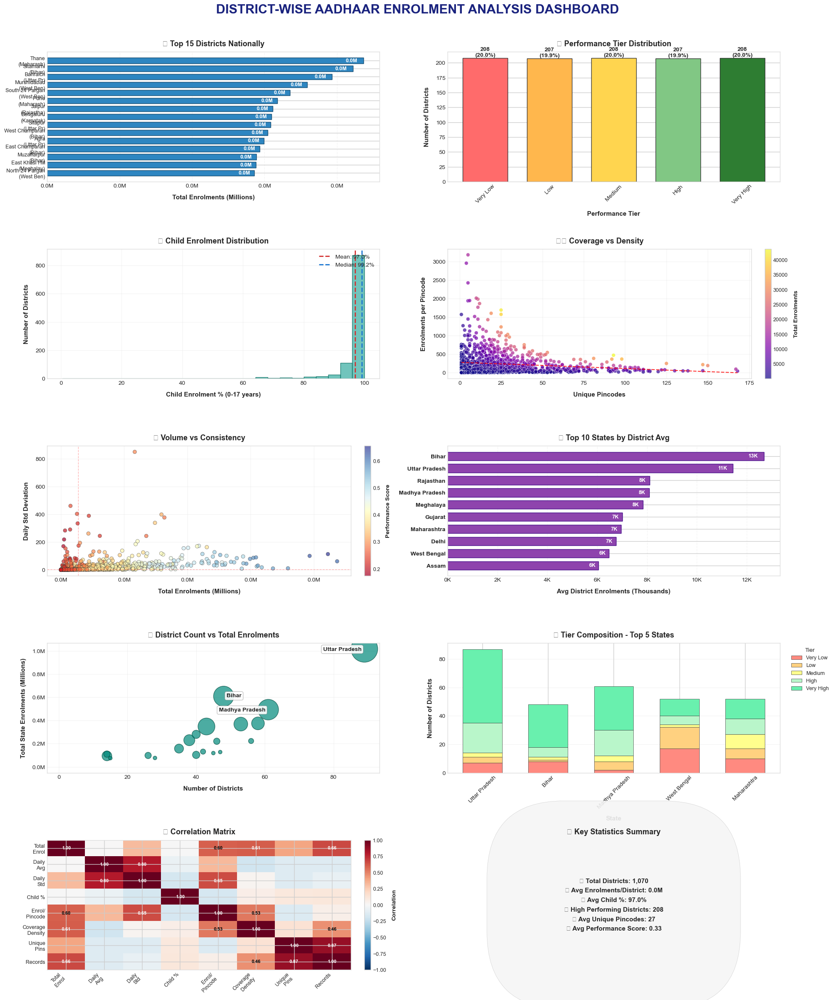

In [48]:
plt.style.use('seaborn-v0_8-whitegrid')

# Create 2-column layout with 5 rows (5x2 grid for 10 plots total)
fig, axes = plt.subplots(5, 2, figsize=(20, 25))  # Perfect portrait ratio
fig.suptitle('DISTRICT-WISE AADHAAR ENROLMENT ANALYSIS DASHBOARD', 
             fontsize=22, fontweight='bold', y=0.98, color='#1a237e')

# Optimize spacing
plt.subplots_adjust(hspace=0.4, wspace=0.25, top=0.95, bottom=0.05)

# ============================================
# ROW 1: Top Performers
# ============================================

# Plot 1: Top 15 Districts Nationally (Left Column)
ax1 = axes[0, 0]
top_15 = district_analysis.nlargest(15, 'total_enrolments')  # Reduced from 25 to 15 for better fit
y_pos = np.arange(len(top_15))
bars1 = ax1.barh(y_pos, top_15['total_enrolments'], 
                height=0.7, color='#2E86C1', edgecolor='#1B4F72', linewidth=1)
ax1.set_yticks(y_pos)
# Clean label formatting
ax1.set_yticklabels([f"{row['district'][:15]}\n({row['state'][:8]})" 
                    for _, row in top_15.iterrows()], fontsize=9)
ax1.set_xlabel('Total Enrolments (Millions)', fontsize=11, fontweight='bold')
ax1.set_title('🏆 Top 15 Districts Nationally', fontsize=13, fontweight='bold', pad=10)
ax1.invert_yaxis()
ax1.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1e6:.1f}M'))
ax1.grid(axis='x', alpha=0.2, linestyle='--')

# Add value labels inside bars
for bar, enrolments in zip(bars1, top_15['total_enrolments']):
    width = bar.get_width()
    ax1.text(width * 0.98, bar.get_y() + bar.get_height()/2,
            f'{width/1e6:.1f}M', ha='right', va='center', 
            fontsize=9, fontweight='bold', color='white')

# Plot 2: Performance Tier Distribution (Right Column)
ax2 = axes[0, 1]
tier_counts = district_analysis['performance_tier'].value_counts().sort_index()
colors = ['#FF6B6B', '#FFB74D', '#FFD54F', '#81C784', '#2E7D32']
bars2 = ax2.bar(tier_counts.index, tier_counts.values, 
               color=colors, edgecolor='#333', linewidth=1, width=0.7)
ax2.set_xlabel('Performance Tier', fontsize=11, fontweight='bold')
ax2.set_ylabel('Number of Districts', fontsize=11, fontweight='bold')
ax2.set_title('📊 Performance Tier Distribution', fontsize=13, fontweight='bold', pad=10)
ax2.tick_params(axis='x', rotation=45)

# Smart annotations
for bar, count in zip(bars2, tier_counts.values):
    height = bar.get_height()
    percentage = (count / tier_counts.sum()) * 100
    ax2.text(bar.get_x() + bar.get_width()/2, height + 0.5, 
             f'{count}\n({percentage:.1f}%)', ha='center', va='bottom', 
             fontsize=10, fontweight='bold', linespacing=1.2)

# ============================================
# ROW 2: Distribution Analysis
# ============================================

# Plot 3: Child Enrolment Distribution (Left)
ax3 = axes[1, 0]
n, bins, patches = ax3.hist(district_analysis['pct_children_0_17'], bins=25, 
                           color='#4DB6AC', edgecolor='#00695C', alpha=0.8, linewidth=1)
ax3.axvline(district_analysis['pct_children_0_17'].mean(), color='#D32F2F', 
           linestyle='--', linewidth=2, label=f'Mean: {district_analysis["pct_children_0_17"].mean():.1f}%')
ax3.axvline(district_analysis['pct_children_0_17'].median(), color='#1976D2', 
           linestyle='--', linewidth=2, label=f'Median: {district_analysis["pct_children_0_17"].median():.1f}%')
ax3.set_xlabel('Child Enrolment % (0-17 years)', fontsize=11, fontweight='bold')
ax3.set_ylabel('Number of Districts', fontsize=11, fontweight='bold')
ax3.set_title('👶 Child Enrolment Distribution', fontsize=13, fontweight='bold', pad=10)
ax3.legend(fontsize=10, framealpha=0.9, loc='upper right')
ax3.grid(True, alpha=0.2)

# Plot 4: Geographic Coverage vs Density (Right)
ax4 = axes[1, 1]
scatter1 = ax4.scatter(district_analysis['unique_pincodes'], 
                      district_analysis['enrolments_per_pincode'],
                      c=district_analysis['total_enrolments'], 
                      cmap='plasma', alpha=0.7, s=40, edgecolor='white', linewidth=0.5)
ax4.set_xlabel('Unique Pincodes', fontsize=11, fontweight='bold')
ax4.set_ylabel('Enrolments per Pincode', fontsize=11, fontweight='bold')
ax4.set_title('🗺️ Coverage vs Density', fontsize=13, fontweight='bold', pad=10)
ax4.grid(True, alpha=0.2)

# Add trend line
z = np.polyfit(district_analysis['unique_pincodes'], 
               district_analysis['enrolments_per_pincode'], 1)
p = np.poly1d(z)
x_range = np.linspace(district_analysis['unique_pincodes'].min(), 
                     district_analysis['unique_pincodes'].max(), 100)
ax4.plot(x_range, p(x_range), "r--", alpha=0.8, linewidth=1.5, label='Trend')

cbar1 = plt.colorbar(scatter1, ax=ax4, fraction=0.046, pad=0.04)
cbar1.set_label('Total Enrolments', fontsize=10, fontweight='bold')
cbar1.ax.tick_params(labelsize=9)

# ============================================
# ROW 3: Performance Analysis
# ============================================

# Plot 5: Enrolment Volume vs Consistency (Left)
ax5 = axes[2, 0]
scatter2 = ax5.scatter(district_analysis['total_enrolments'], 
                      district_analysis['std_daily_enrolments'],
                      c=district_analysis['performance_score'], 
                      cmap='RdYlBu', alpha=0.7, s=40, edgecolor='#333', linewidth=0.5)
ax5.set_xlabel('Total Enrolments (Millions)', fontsize=11, fontweight='bold')
ax5.set_ylabel('Daily Std Deviation', fontsize=11, fontweight='bold')
ax5.set_title('📈 Volume vs Consistency', fontsize=13, fontweight='bold', pad=10)
ax5.grid(True, alpha=0.2)
ax5.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1e6:.1f}M'))

# Add quadrant analysis
median_x = district_analysis['total_enrolments'].median()
median_y = district_analysis['std_daily_enrolments'].median()
ax5.axvline(median_x, color='red', alpha=0.3, linestyle='--', linewidth=1)
ax5.axhline(median_y, color='red', alpha=0.3, linestyle='--', linewidth=1)

cbar2 = plt.colorbar(scatter2, ax=ax5, fraction=0.046, pad=0.04)
cbar2.set_label('Performance Score', fontsize=10, fontweight='bold')
cbar2.ax.tick_params(labelsize=9)

# Plot 6: Top States by Average District (Right)
ax6 = axes[2, 1]
top_states_avg = state_district_summary.nlargest(10, 'avg_district_enrolments')
bars3 = ax6.barh(range(len(top_states_avg)), top_states_avg['avg_district_enrolments'], 
                height=0.7, color='#8E44AD', edgecolor='#4A148C', linewidth=1)
ax6.set_yticks(range(len(top_states_avg)))
ax6.set_yticklabels(top_states_avg['state'], fontsize=10, fontweight='bold')
ax6.set_xlabel('Avg District Enrolments (Thousands)', fontsize=11, fontweight='bold')
ax6.set_title('👑 Top 10 States by District Avg', fontsize=13, fontweight='bold', pad=10)
ax6.invert_yaxis()
ax6.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1e3:.0f}K'))
ax6.grid(axis='x', alpha=0.2, linestyle='--')

# Add value labels
for bar, value in zip(bars3, top_states_avg['avg_district_enrolments']):
    width = bar.get_width()
    ax6.text(width * 0.98, bar.get_y() + bar.get_height()/2,
            f'{width/1e3:.0f}K', ha='right', va='center', 
            fontsize=9, fontweight='bold', color='white')

# ============================================
# ROW 4: State-Level Analysis
# ============================================

# Plot 7: District Count vs Total Enrolments (Left)
ax7 = axes[3, 0]
scatter3 = ax7.scatter(state_district_summary['num_districts'], 
                      state_district_summary['state_total_enrolments'],
                      s=state_district_summary['high_performing_districts']*40, 
                      alpha=0.7, c='#00897B', edgecolor='#004D40', linewidth=1)
ax7.set_xlabel('Number of Districts', fontsize=11, fontweight='bold')
ax7.set_ylabel('Total State Enrolments (Millions)', fontsize=11, fontweight='bold')
ax7.set_title('📦 District Count vs Total Enrolments', fontsize=13, fontweight='bold', pad=10)
ax7.grid(True, alpha=0.2)
ax7.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1e6:.1f}M'))

# Smart annotation - only top 3 states
top_states = state_district_summary.nlargest(3, 'state_total_enrolments')
for idx, row in top_states.iterrows():
    offset_x = 5 if idx % 2 == 0 else -5
    offset_y = 5 if idx % 2 == 0 else -5
    ax7.annotate(row['state'], (row['num_districts'], row['state_total_enrolments']),
                xytext=(offset_x, offset_y), textcoords='offset points', 
                fontsize=10, fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', 
                         alpha=0.9, edgecolor='gray'),
                ha='right' if offset_x < 0 else 'left',
                va='bottom' if offset_y < 0 else 'top')

# Plot 8: Performance Tier Composition (Right)
ax8 = axes[3, 1]
top_5_states = state_district_summary.nlargest(5, 'state_total_enrolments')['state'].tolist()
tier_composition = {}
for state in top_5_states:
    state_data = district_analysis[district_analysis['state'] == state]
    tier_counts = state_data['performance_tier'].value_counts().sort_index()
    tier_composition[state] = tier_counts

tiers = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
colors_stacked = ['#FF8A80', '#FFD180', '#FFFF8D', '#B9F6CA', '#69F0AE']
bottom = np.zeros(len(top_5_states))

for i, tier in enumerate(tiers):
    values = [tier_composition[state].get(tier, 0) for state in top_5_states]
    ax8.bar(top_5_states, values, bottom=bottom, label=tier, 
           color=colors_stacked[i], edgecolor='#333', linewidth=0.5, width=0.6)
    bottom += values

ax8.set_xlabel('State', fontsize=11, fontweight='bold')
ax8.set_ylabel('Number of Districts', fontsize=11, fontweight='bold')
ax8.set_title('🎯 Tier Composition - Top 5 States', fontsize=13, fontweight='bold', pad=10)
ax8.tick_params(axis='x', rotation=45, labelsize=10)
ax8.legend(title='Tier', fontsize=9, title_fontsize=10, 
          loc='upper left', bbox_to_anchor=(1.02, 1))
ax8.grid(axis='y', alpha=0.2)

# ============================================
# ROW 5: Correlation Analysis
# ============================================

# Plot 9: Correlation Matrix (Left - Full width)
ax9 = axes[4, 0]
correlation_metrics = ['total_enrolments', 'avg_daily_enrolments', 'std_daily_enrolments',
                      'pct_children_0_17', 'enrolments_per_pincode', 'coverage_density',
                      'unique_pincodes', 'records_count']
corr_matrix = district_analysis[correlation_metrics].corr()
im = ax9.imshow(corr_matrix, cmap='RdBu_r', vmin=-1, vmax=1, aspect='auto')
ax9.set_xticks(range(len(correlation_metrics)))
ax9.set_yticks(range(len(correlation_metrics)))
metric_labels = ['Total\nEnrol', 'Daily\nAvg', 'Daily\nStd', 'Child %', 
                 'Enrol/\nPincode', 'Coverage\nDensity', 'Unique\nPins', 'Records']
ax9.set_xticklabels(metric_labels, fontsize=9, rotation=45, ha='right')
ax9.set_yticklabels(metric_labels, fontsize=9)
ax9.set_title('🔗 Correlation Matrix', fontsize=13, fontweight='bold', pad=10)

# Add correlation values
for i in range(len(correlation_metrics)):
    for j in range(len(correlation_metrics)):
        value = corr_matrix.iloc[i, j]
        if abs(value) > 0.4:  # Only show strong correlations
            color = 'white' if abs(value) > 0.6 else 'black'
            ax9.text(j, i, f'{value:.2f}', ha='center', va='center', 
                    color=color, fontsize=8, fontweight='bold')

cbar3 = plt.colorbar(im, ax=ax9, fraction=0.046, pad=0.04)
cbar3.set_label('Correlation', fontsize=10, fontweight='bold')
cbar3.ax.tick_params(labelsize=9)

# Plot 10: Summary Statistics (Right)
ax10 = axes[4, 1]
# Hide axes for text display
ax10.axis('off')

# Create summary statistics
summary_stats = [
    f"📊 Total Districts: {len(district_analysis):,}",
    f"📈 Avg Enrolments/District: {district_analysis['total_enrolments'].mean()/1e6:.1f}M",
    f"👶 Avg Child %: {district_analysis['pct_children_0_17'].mean():.1f}%",
    f"🏆 High Performing Districts: {state_district_summary['high_performing_districts'].sum():,}",
    f"📱 Avg Unique Pincodes: {district_analysis['unique_pincodes'].mean():.0f}",
    f"⭐ Avg Performance Score: {district_analysis['performance_score'].mean():.2f}"
]

# Display summary text
summary_text = "\n".join(summary_stats)
ax10.text(0.5, 0.5, summary_text, fontsize=11, fontweight='bold',
         ha='center', va='center', linespacing=1.8,
         bbox=dict(boxstyle='round', facecolor='#F5F5F5', 
                  alpha=0.9, edgecolor='#CCCCCC', pad=12))

ax10.set_title('📋 Key Statistics Summary', fontsize=13, fontweight='bold', pad=10)

# ============================================
# FINAL POLISH
# ============================================

# Add subtle borders to all subplots
for ax in axes.flat:
    for spine in ax.spines.values():
        spine.set_edgecolor('#DDDDDD')
        spine.set_linewidth(1)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.savefig('district_analysis_2column_dashboard.png', 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

#### 4.5.9 [ KEY INSIGHTS FROM DISTRICT-WISE ANALYSIS ]

In [49]:
print("\n" + "="*100)
print("KEY INSIGHTS FROM DISTRICT-WISE ANALYSIS")
print("="*100)

# Insight 1: Top performing districts
top_district = district_analysis.nlargest(1, 'total_enrolments').iloc[0]
print(f"\n1. TOP PERFORMING DISTRICT:")
print(f"   - {top_district['district']}, {top_district['state']}")
print(f"     Total Enrolments: {top_district['total_enrolments']:,}")
print(f"     Daily Average: {top_district['avg_daily_enrolments']:.1f}")
print(f"     Child Enrolment: {top_district['pct_children_0_17']:.1f}%")

# Insight 2: Performance distribution
print(f"\n2. PERFORMANCE DISTRIBUTION:")
for tier in ['Very High', 'High', 'Medium', 'Low', 'Very Low']:
    count = len(district_analysis[district_analysis['performance_tier'] == tier])
    percentage = (count / len(district_analysis)) * 100
    print(f"   - {tier}: {count} districts ({percentage:.1f}%)")

# Insight 3: Geographic coverage patterns
print(f"\n3. GEOGRAPHIC COVERAGE PATTERNS:")
print(f"   - Average pincodes per district: {district_analysis['unique_pincodes'].mean():.1f}")
print(f"   - Average enrolments per pincode: {district_analysis['enrolments_per_pincode'].mean():.1f}")
print(f"   - District with widest coverage: {wide_coverage.iloc[0]['district']}, "
      f"{wide_coverage.iloc[0]['state']} ({wide_coverage.iloc[0]['unique_pincodes']} pincodes)")

# Insight 4: Child enrolment focus
print(f"\n4. CHILD ENROLMENT FOCUS DISTRICTS:")
print(f"   - National average child enrolment: {district_analysis['pct_children_0_17'].mean():.1f}%")
high_child_avg = district_analysis['pct_children_0_17'].quantile(0.9)
high_child_districts_count = len(district_analysis[district_analysis['pct_children_0_17'] > high_child_avg])
print(f"   - Districts with >{high_child_avg:.1f}% child enrolment: {high_child_districts_count}")

# Insight 5: State-level patterns
print(f"\n5. STATE-LEVEL DISTRICT PATTERNS:")
most_districts_state = state_district_summary.nlargest(1, 'num_districts').iloc[0]
most_efficient_state = state_district_summary.nlargest(1, 'enrolments_per_district').iloc[0]
print(f"   - State with most districts: {most_districts_state['state']} "
      f"({most_districts_state['num_districts']} districts)")
print(f"   - Most efficient state (enrolments per district): {most_efficient_state['state']} "
      f"({most_efficient_state['enrolments_per_district']:,.0f} enrolments/district)")

# Insight 6: Consistency analysis
print(f"\n6. ENROLMENT CONSISTENCY:")
high_consistency = district_analysis.nsmallest(1, 'std_daily_enrolments').iloc[0]
print(f"   - Most consistent district: {high_consistency['district']}, {high_consistency['state']}")
print(f"     Daily avg: {high_consistency['avg_daily_enrolments']:.1f} ± "
      f"{high_consistency['std_daily_enrolments']:.1f}")

# Insight 7: Coverage density insights
print(f"\n7. COVERAGE DENSITY INSIGHTS:")
high_density_district = district_analysis.nlargest(1, 'coverage_density').iloc[0]
print(f"   - District with highest coverage density: {high_density_district['district']}, "
      f"{high_density_district['state']}")
print(f"     Records per pincode: {high_density_district['coverage_density']:.1f}")

print("\n" + "="*100)
print("ANALYSIS COMPLETE")
print("="*100)


KEY INSIGHTS FROM DISTRICT-WISE ANALYSIS

1. TOP PERFORMING DISTRICT:
   - Thane, Maharashtra
     Total Enrolments: 43,688
     Daily Average: 10.3
     Child Enrolment: 97.8%

2. PERFORMANCE DISTRIBUTION:
   - Very High: 208 districts (19.4%)
   - High: 207 districts (19.3%)
   - Medium: 208 districts (19.4%)
   - Low: 207 districts (19.3%)
   - Very Low: 208 districts (19.4%)

3. GEOGRAPHIC COVERAGE PATTERNS:
   - Average pincodes per district: 27.1
   - Average enrolments per pincode: 233.2
   - District with widest coverage: Thrissur, Kerala (168 pincodes)

4. CHILD ENROLMENT FOCUS DISTRICTS:
   - National average child enrolment: 97.0%
   - Districts with >100.0% child enrolment: 0

5. STATE-LEVEL DISTRICT PATTERNS:
   - State with most districts: Uttar Pradesh (89 districts)
   - Most efficient state (enrolments per district): Bihar (12,700 enrolments/district)

6. ENROLMENT CONSISTENCY:
   - Most consistent district: Mahabubnagar, Andhra Pradesh
     Daily avg: 1.0 ± 0.0

7. C

#### 4.5.10 [ EXPORT DISTRICT-LEVEL FINDINGS ]

In [50]:
# Create comprehensive summary report
district_summary_report = district_analysis[[
    'state', 'district', 'total_enrolments', 'avg_daily_enrolments',
    'std_daily_enrolments', 'pct_children_0_17', 'unique_pincodes',
    'enrolments_per_pincode', 'coverage_density', 'performance_tier'
]].sort_values('total_enrolments', ascending=False)

print("\n" + "="*100)
print("DISTRICT SUMMARY REPORT (Top 30 Districts)")
print("="*100)
print(district_summary_report.head(30).to_string(index=False))

# Export state-wise district performance
print("\n" + "="*100)
print("STATE-WISE DISTRICT PERFORMANCE SUMMARY")
print("="*100)
for state in sorted(district_analysis['state'].unique()):
    state_data = district_analysis[district_analysis['state'] == state]
    top_state_district = state_data.nlargest(1, 'total_enrolments').iloc[0]
    avg_enrolments = state_data['total_enrolments'].mean()
    
    print(f"\n{state}:")
    print(f"  Districts: {len(state_data)}")
    print(f"  Total Enrolments: {state_data['total_enrolments'].sum():,}")
    print(f"  Average per District: {avg_enrolments:,.0f}")
    print(f"  Top District: {top_state_district['district']} "
          f"({top_state_district['total_enrolments']:,} enrolments)")
    print(f"  High-Performing Districts: "
          f"{len(state_data[state_data['performance_tier'] == 'Very High'])}")


DISTRICT SUMMARY REPORT (Top 30 Districts)
        state          district  total_enrolments  avg_daily_enrolments  std_daily_enrolments  pct_children_0_17  unique_pincodes  enrolments_per_pincode  coverage_density performance_tier
  Maharashtra             Thane             43688                 10.31                 61.27          97.786578               93              469.763441         45.548387        Very High
        Bihar         Sitamarhi             42232                 25.26                113.38          93.613847               25             1689.280000         66.880000        Very High
Uttar Pradesh          Bahraich             39338                 24.82                100.23          94.143068               25             1573.520000         63.400000        Very High
  West Bengal       Murshidabad             35911                  7.87                 10.81          99.760519               98              366.438776         46.551020        Very High
  West Beng

### 4.6 Age-wise Analysis of Aadhaar Enrolments

#### 4.6.0 [ PREPARE AGE-RELATED COLUMNS ]

In [51]:
# Create child percentage column
df['pct_children'] = df['pct_0_5'] + df['pct_5_17']

# Create a safer child_adult_ratio (handle NaN and infinite values)
df['child_adult_ratio_safe'] = np.where(
    (df['age_18_greater'] > 0) & (df['age_18_greater'].notna()),
    (df['age_0_5'] + df['age_5_17']) / df['age_18_greater'],
    np.nan
)

# Cap extreme values for better visualization
df['child_adult_ratio_capped'] = df['child_adult_ratio_safe'].clip(upper=10)  # Cap at 10 for visualization

#### 4.6.1 [ NATIONAL-LEVEL AGE DISTRIBUTION ANALYSIS ]

In [52]:
# Calculate national totals for each age group
national_age_totals = {
    '0_5': df['age_0_5'].sum(),
    '5_17': df['age_5_17'].sum(),
    '18_plus': df['age_18_greater'].sum()
}

national_total = sum(national_age_totals.values())
national_percentages = {k: (v/national_total)*100 for k, v in national_age_totals.items()}

print("\n" + "="*80)
print("NATIONAL AGE DISTRIBUTION SUMMARY")
print("="*80)
print(f"\nTotal Enrolments: {national_total:,}")
print(f"\nAge Group Distribution:")
print(f"- 0-5 years: {national_age_totals['0_5']:,} ({national_percentages['0_5']:.2f}%)")
print(f"- 5-17 years: {national_age_totals['5_17']:,} ({national_percentages['5_17']:.2f}%)")
print(f"- 18+ years: {national_age_totals['18_plus']:,} ({national_percentages['18_plus']:.2f}%)")

# Calculate child vs adult distribution
total_children = national_age_totals['0_5'] + national_age_totals['5_17']
total_adults = national_age_totals['18_plus']
child_percentage = (total_children/national_total)*100
adult_percentage = (total_adults/national_total)*100

print(f"\nChild (0-17) vs Adult Distribution:")
print(f"- Children (0-17): {total_children:,} ({child_percentage:.2f}%)")
print(f"- Adults (18+): {total_adults:,} ({adult_percentage:.2f}%)")
print(f"- Child-Adult Ratio: {total_children/total_adults:.3f}")


NATIONAL AGE DISTRIBUTION SUMMARY

Total Enrolments: 5,435,702

Age Group Distribution:
- 0-5 years: 3,546,965 (65.25%)
- 5-17 years: 1,720,384 (31.65%)
- 18+ years: 168,353 (3.10%)

Child (0-17) vs Adult Distribution:
- Children (0-17): 5,267,349 (96.90%)
- Adults (18+): 168,353 (3.10%)
- Child-Adult Ratio: 31.288


#### 4.6.2 [ TEMPORAL TRENDS IN AGE DISTRIBUTION ]

In [53]:
# Yearly age distribution
yearly_age_dist = df.groupby('year').agg({
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum',
    'total_enrolments': 'sum'
}).reset_index()

# Calculate percentages for each year
yearly_age_dist['pct_0_5'] = (yearly_age_dist['age_0_5'] / yearly_age_dist['total_enrolments']) * 100
yearly_age_dist['pct_5_17'] = (yearly_age_dist['age_5_17'] / yearly_age_dist['total_enrolments']) * 100
yearly_age_dist['pct_18_plus'] = (yearly_age_dist['age_18_greater'] / yearly_age_dist['total_enrolments']) * 100
yearly_age_dist['pct_children'] = yearly_age_dist['pct_0_5'] + yearly_age_dist['pct_5_17']

print("\n" + "="*80)
print("YEARLY AGE DISTRIBUTION TRENDS")
print("="*80)
print(yearly_age_dist[['year', 'total_enrolments', 'pct_0_5', 'pct_5_17', 'pct_18_plus', 'pct_children']].to_string(index=False))

# Calculate YoY changes
yearly_age_dist['yoy_change_0_5'] = yearly_age_dist['pct_0_5'].pct_change() * 100
yearly_age_dist['yoy_change_5_17'] = yearly_age_dist['pct_5_17'].pct_change() * 100
yearly_age_dist['yoy_change_18_plus'] = yearly_age_dist['pct_18_plus'].pct_change() * 100


YEARLY AGE DISTRIBUTION TRENDS
 year  total_enrolments   pct_0_5  pct_5_17  pct_18_plus  pct_children
 2025           5435702 65.253117 31.649711     3.097171     96.902829


#### 4.6.3 [ MONTHLY/SEASONAL AGE DISTRIBUTION PATTERN ]

In [54]:
monthly_age_dist = df.groupby('month').agg({
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum',
    'total_enrolments': 'sum'
}).reset_index()

# Calculate monthly percentages
monthly_age_dist['pct_0_5'] = (monthly_age_dist['age_0_5'] / monthly_age_dist['total_enrolments']) * 100
monthly_age_dist['pct_5_17'] = (monthly_age_dist['age_5_17'] / monthly_age_dist['total_enrolments']) * 100
monthly_age_dist['pct_18_plus'] = (monthly_age_dist['age_18_greater'] / monthly_age_dist['total_enrolments']) * 100
monthly_age_dist['pct_children'] = monthly_age_dist['pct_0_5'] + monthly_age_dist['pct_5_17']

print("\n" + "="*80)
print("MONTHLY AGE DISTRIBUTION PATTERNS")
print("="*80)
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
monthly_age_dist['month_name'] = monthly_age_dist['month'].apply(lambda x: month_names[x-1])
print(monthly_age_dist[['month_name', 'total_enrolments', 'pct_0_5', 'pct_5_17', 'pct_18_plus', 'pct_children']].to_string(index=False))


MONTHLY AGE DISTRIBUTION PATTERNS
month_name  total_enrolments   pct_0_5  pct_5_17  pct_18_plus  pct_children
       Mar             16582 32.366421 44.668918    22.964660     77.035340
       Apr            257438 54.830289 35.492429     9.677282     90.322718
       May            183616 51.924669 39.043438     9.031893     90.968107
       Jun            215734 45.863424 46.312125     7.824450     92.175550
       Jul            616868 51.607799 42.688711     5.703489     94.296511
       Sep           1475879 67.458918 31.533818     1.007264     98.992736
       Oct            817920 68.815532 29.215327     1.969141     98.030859
       Nov           1092007 70.435080 27.257884     2.307036     97.692964
       Dec            759658 73.741473 24.307649     1.950878     98.049122


#### 4.6.4 [ STATE-WISE AGE DISTRIBUTION ANALYSIS ]

In [55]:
state_age_dist = df.groupby('state').agg({
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum',
    'total_enrolments': 'sum',
    'child_adult_ratio_safe': 'mean'
}).reset_index()

# Calculate state-wise percentages
state_age_dist['pct_0_5'] = (state_age_dist['age_0_5'] / state_age_dist['total_enrolments']) * 100
state_age_dist['pct_5_17'] = (state_age_dist['age_5_17'] / state_age_dist['total_enrolments']) * 100
state_age_dist['pct_18_plus'] = (state_age_dist['age_18_greater'] / state_age_dist['total_enrolments']) * 100
state_age_dist['pct_children'] = state_age_dist['pct_0_5'] + state_age_dist['pct_5_17']

print("\n" + "="*80)
print("TOP 10 STATES WITH HIGHEST CHILD ENROLMENT PERCENTAGE")
print("="*80)
top_child_states = state_age_dist.nlargest(10, 'pct_children')[['state', 'total_enrolments', 'pct_children', 'pct_0_5', 'pct_5_17', 'child_adult_ratio_safe']]
print(top_child_states.to_string(index=False))

print("\n" + "="*80)
print("TOP 10 STATES WITH HIGHEST ADULT ENROLMENT PERCENTAGE")
print("="*80)
top_adult_states = state_age_dist.nlargest(10, 'pct_18_plus')[['state', 'total_enrolments', 'pct_18_plus', 'child_adult_ratio_safe']]
print(top_adult_states.to_string(index=False))

print("\n" + "="*80)
print("STATES WITH HIGHEST CHILD-ADULT RATIO")
print("="*80)
top_ratio_states = state_age_dist.nlargest(10, 'child_adult_ratio_safe')[['state', 'child_adult_ratio_safe', 'pct_children', 'total_enrolments']]
print(top_ratio_states.to_string(index=False))


TOP 10 STATES WITH HIGHEST CHILD ENROLMENT PERCENTAGE
                      state  total_enrolments  pct_children    pct_0_5  pct_5_17  child_adult_ratio_safe
  Andaman & Nicobar Islands               114         100.0  95.614035  4.385965                     NaN
Andaman and Nicobar Islands               397         100.0  93.198992  6.801008                     NaN
       Dadra & Nagar Haveli                25         100.0  88.000000 12.000000                     NaN
              Daman and Diu               120         100.0  89.166667 10.833333                     NaN
                     ODISHA                 1         100.0 100.000000  0.000000                     NaN
                     Orissa              4149         100.0  85.514582 14.485418                     NaN
                Pondicherry              1272         100.0  93.789308  6.210692                     NaN
                WEST BENGAL                 4         100.0  75.000000 25.000000                     NaN


#### 4.6.5 [ DISTRICT-WISE AGE DISTRIBUTION ANALYSIS ]

In [56]:
# For top 20 districts by total enrolments
top_districts = df.groupby(['state', 'district']).agg({
    'total_enrolments': 'sum'
}).nlargest(20, 'total_enrolments').reset_index()

district_age_analysis = []
for _, row in top_districts.iterrows():
    district_data = df[(df['state'] == row['state']) & (df['district'] == row['district'])]
    total = district_data['total_enrolments'].sum()
    age_0_5 = district_data['age_0_5'].sum()
    age_5_17 = district_data['age_5_17'].sum()
    age_18 = district_data['age_18_greater'].sum()
    
    district_age_analysis.append({
        'state': row['state'],
        'district': row['district'],
        'total_enrolments': total,
        'pct_0_5': (age_0_5/total)*100,
        'pct_5_17': (age_5_17/total)*100,
        'pct_18_plus': (age_18/total)*100,
        'pct_children': ((age_0_5 + age_5_17)/total)*100,
        'child_adult_ratio': (age_0_5 + age_5_17) / age_18 if age_18 > 0 else np.nan
    })

district_age_df = pd.DataFrame(district_age_analysis)

print("\n" + "="*80)
print("AGE DISTRIBUTION IN TOP 20 DISTRICTS BY ENROLMENTS")
print("="*80)
print(district_age_df[['state', 'district', 'total_enrolments', 'pct_0_5', 'pct_5_17', 
                      'pct_18_plus', 'pct_children', 'child_adult_ratio']].to_string(index=False))


AGE DISTRIBUTION IN TOP 20 DISTRICTS BY ENROLMENTS
        state          district  total_enrolments   pct_0_5  pct_5_17  pct_18_plus  pct_children  child_adult_ratio
  Maharashtra             Thane             43688 66.590368 31.196209     2.213422     97.786578          44.178904
        Bihar         Sitamarhi             42232 48.965240 44.648608     6.386153     93.613847          14.658880
Uttar Pradesh          Bahraich             39338 37.302354 56.840714     5.856932     94.143068          16.073785
  West Bengal       Murshidabad             35911 87.555345 12.205174     0.239481     99.760519         416.569767
  West Bengal South 24 Parganas             33540 74.654144 24.439475     0.906380     99.093620         109.328947
  Maharashtra              Pune             31763 75.836665 20.577401     3.585933     96.414067          26.886743
    Rajasthan            Jaipur             31146 68.824247 28.819110     2.356643     97.643357          41.433243
    Karnataka       

#### 4.6.6 [  AGE DISTRIBUTION BY QUARTER ]

In [57]:
quarterly_age_dist = df.groupby('quarter').agg({
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum',
    'total_enrolments': 'sum'
}).reset_index()

quarterly_age_dist['pct_0_5'] = (quarterly_age_dist['age_0_5'] / quarterly_age_dist['total_enrolments']) * 100
quarterly_age_dist['pct_5_17'] = (quarterly_age_dist['age_5_17'] / quarterly_age_dist['total_enrolments']) * 100
quarterly_age_dist['pct_18_plus'] = (quarterly_age_dist['age_18_greater'] / quarterly_age_dist['total_enrolments']) * 100
quarterly_age_dist['pct_children'] = quarterly_age_dist['pct_0_5'] + quarterly_age_dist['pct_5_17']

print("\n" + "="*80)
print("QUARTERLY AGE DISTRIBUTION")
print("="*80)
print(quarterly_age_dist[['quarter', 'total_enrolments', 'pct_0_5', 'pct_5_17', 'pct_18_plus', 'pct_children']].to_string(index=False))


QUARTERLY AGE DISTRIBUTION
 quarter  total_enrolments   pct_0_5  pct_5_17  pct_18_plus  pct_children
       1             16582 32.366421 44.668918    22.964660     77.035340
       2            656788 51.072644 40.039099     8.888256     91.111744
       3           2092747 62.786567 34.821887     2.391546     97.608454
       4           2669585 70.879743 27.018095     2.102162     97.897838


#### 4.6.7 [ STATISTICAL ANALYSIS OF AGE DISTRIBUTION ]

In [58]:
print("\n" + "="*80)
print("STATISTICAL ANALYSIS OF AGE DISTRIBUTION")
print("="*80)

# Calculate statistics for each age group percentage
age_stats = pd.DataFrame({
    'Metric': ['Mean', 'Median', 'Std Dev', 'Min', 'Max', '25th Percentile', '75th Percentile'],
    '0-5 years': [
        df['pct_0_5'].mean(),
        df['pct_0_5'].median(),
        df['pct_0_5'].std(),
        df['pct_0_5'].min(),
        df['pct_0_5'].max(),
        df['pct_0_5'].quantile(0.25),
        df['pct_0_5'].quantile(0.75)
    ],
    '5-17 years': [
        df['pct_5_17'].mean(),
        df['pct_5_17'].median(),
        df['pct_5_17'].std(),
        df['pct_5_17'].min(),
        df['pct_5_17'].max(),
        df['pct_5_17'].quantile(0.25),
        df['pct_5_17'].quantile(0.75)
    ],
    '18+ years': [
        df['pct_18_plus'].mean(),
        df['pct_18_plus'].median(),
        df['pct_18_plus'].std(),
        df['pct_18_plus'].min(),
        df['pct_18_plus'].max(),
        df['pct_18_plus'].quantile(0.25),
        df['pct_18_plus'].quantile(0.75)
    ],
    'Children (0-17)': [
        df['pct_children'].mean(),
        df['pct_children'].median(),
        df['pct_children'].std(),
        df['pct_children'].min(),
        df['pct_children'].max(),
        df['pct_children'].quantile(0.25),
        df['pct_children'].quantile(0.75)
    ],
    'Child-Adult Ratio': [
        df['child_adult_ratio_safe'].mean(),
        df['child_adult_ratio_safe'].median(),
        df['child_adult_ratio_safe'].std(),
        df['child_adult_ratio_safe'].min(),
        df['child_adult_ratio_safe'].max(),
        df['child_adult_ratio_safe'].quantile(0.25),
        df['child_adult_ratio_safe'].quantile(0.75)
    ]
})

print("\nStatistical Summary of Age Distribution:")
print(age_stats.to_string(index=False))


STATISTICAL ANALYSIS OF AGE DISTRIBUTION

Statistical Summary of Age Distribution:
         Metric  0-5 years  5-17 years  18+ years  Children (0-17)  Child-Adult Ratio
           Mean  74.014066   24.392678   1.593255        98.406745           6.715992
         Median 100.000000    0.000000   0.000000       100.000000           3.000000
        Std Dev  34.764344   33.807974  10.376495        10.376495          11.676165
            Min   0.000000    0.000000   0.000000         0.000000           0.000000
            Max 100.000000  100.000000 100.000000       100.000000         298.000000
25th Percentile  50.000000    0.000000   0.000000       100.000000           0.777778
75th Percentile 100.000000   50.000000   0.000000       100.000000           8.000000


#### 4.6.8 [ AGE DISTRIBUTION CATEGORIZATION ]

In [59]:
# Categorize records based on age distribution
def categorize_age_distribution(row):
    child_pct = row['pct_children'] if pd.notna(row['pct_children']) else 0
    adult_pct = row['pct_18_plus'] if pd.notna(row['pct_18_plus']) else 0
    
    if child_pct > 40:
        return 'Child Dominant'
    elif child_pct > 25:
        return 'Balanced with Children'
    elif adult_pct > 80:
        return 'Adult Dominant'
    else:
        return 'Mixed'

df['age_category'] = df.apply(categorize_age_distribution, axis=1)

age_category_dist = df['age_category'].value_counts()
print("\n" + "="*80)
print("AGE DISTRIBUTION CATEGORIES")
print("="*80)
for category, count in age_category_dist.items():
    percentage = (count / len(df)) * 100
    print(f"{category}: {count:,} records ({percentage:.1f}%)")


AGE DISTRIBUTION CATEGORIES
Child Dominant: 996,123 records (99.0%)
Adult Dominant: 8,003 records (0.8%)
Balanced with Children: 1,371 records (0.1%)
Mixed: 532 records (0.1%)


#### 4.6.9 [ CORRELATION ANALYSIS ]

In [60]:
# Calculate correlations between age groups
correlation_matrix = df[['pct_0_5', 'pct_5_17', 'pct_18_plus', 'pct_children', 
                        'child_adult_ratio_safe', 'total_enrolments']].corr()

print("\n" + "="*80)
print("CORRELATION MATRIX")
print("="*80)
print(correlation_matrix.round(3))


CORRELATION MATRIX
                        pct_0_5  pct_5_17  pct_18_plus  pct_children  \
pct_0_5                   1.000    -0.955       -0.240         0.240   
pct_5_17                 -0.955     1.000       -0.060         0.060   
pct_18_plus              -0.240    -0.060        1.000        -1.000   
pct_children              0.240     0.060       -1.000         1.000   
child_adult_ratio_safe    0.335     0.344       -0.520         0.520   
total_enrolments         -0.043     0.037        0.025        -0.025   

                        child_adult_ratio_safe  total_enrolments  
pct_0_5                                  0.335            -0.043  
pct_5_17                                 0.344             0.037  
pct_18_plus                             -0.520             0.025  
pct_children                             0.520            -0.025  
child_adult_ratio_safe                   1.000             0.582  
total_enrolments                         0.582             1.000  


#### 4.6.10 [ VISUALIZATIONS ]

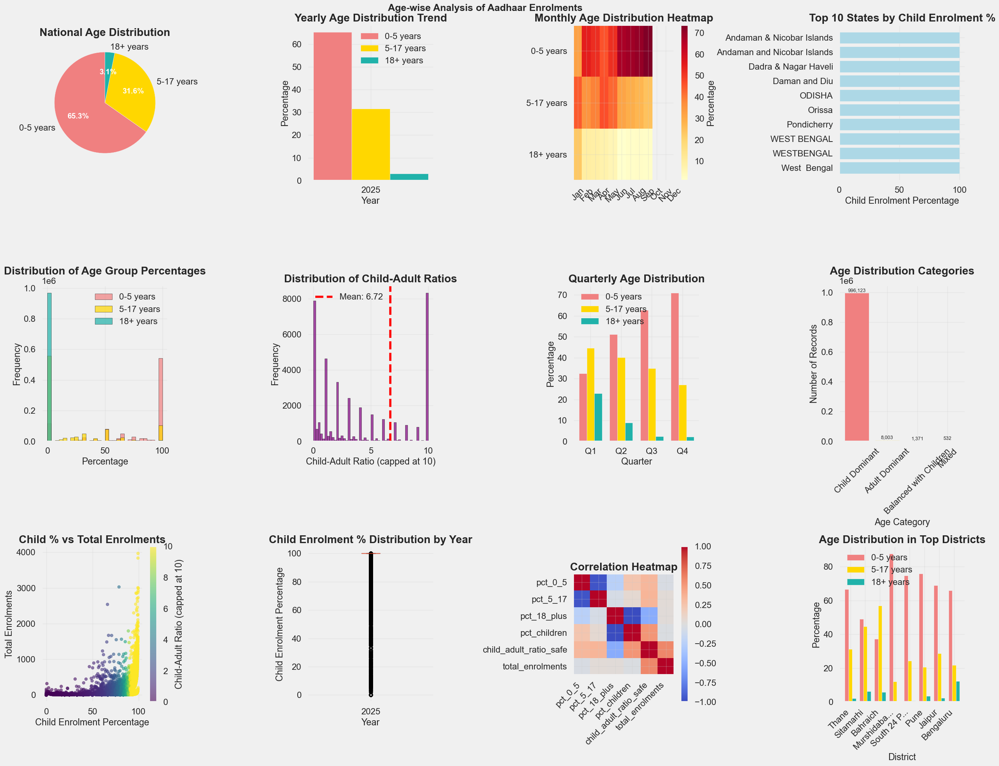

In [554]:
plt.style.use('fivethirtyeight')

# Create comprehensive visualizations
fig = plt.figure(figsize=(25, 20))
fig.suptitle('Age-wise Analysis of Aadhaar Enrolments', fontsize=18, fontweight='bold')

# Plot 1: National Age Distribution Pie Chart
ax1 = plt.subplot(3, 4, 1)
age_groups = ['0-5 years', '5-17 years', '18+ years']
age_values = [national_age_totals['0_5'], national_age_totals['5_17'], national_age_totals['18_plus']]
colors = ['lightcoral', 'gold', 'lightseagreen']
wedges, texts, autotexts = ax1.pie(age_values, labels=age_groups, autopct='%1.1f%%', 
                                   colors=colors, startangle=90)
ax1.set_title('National Age Distribution')
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')

# Plot 2: Yearly Trend of Age Distribution
ax2 = plt.subplot(3, 4, 2)
years = yearly_age_dist['year']
width = 0.25
x = np.arange(len(years))
ax2.bar(x - width, yearly_age_dist['pct_0_5'], width, label='0-5 years', color='lightcoral')
ax2.bar(x, yearly_age_dist['pct_5_17'], width, label='5-17 years', color='gold')
ax2.bar(x + width, yearly_age_dist['pct_18_plus'], width, label='18+ years', color='lightseagreen')
ax2.set_xlabel('Year')
ax2.set_ylabel('Percentage')
ax2.set_title('Yearly Age Distribution Trend')
ax2.set_xticks(x)
ax2.set_xticklabels(years)
ax2.legend()
ax2.grid(True, alpha=0.3)

# Plot 3: Monthly Age Distribution Heatmap
ax3 = plt.subplot(3, 4, 3)
heatmap_data = monthly_age_dist[['pct_0_5', 'pct_5_17', 'pct_18_plus']].T
im = ax3.imshow(heatmap_data, cmap='YlOrRd', aspect='auto')
ax3.set_yticks(range(3))
ax3.set_yticklabels(['0-5 years', '5-17 years', '18+ years'])
ax3.set_xticks(range(12))
ax3.set_xticklabels(month_names, rotation=45)
ax3.set_title('Monthly Age Distribution Heatmap')
plt.colorbar(im, ax=ax3, label='Percentage')

# Plot 4: Top States by Child Percentage
ax4 = plt.subplot(3, 4, 4)
top_10_child_states = state_age_dist.nlargest(10, 'pct_children')
ax4.barh(range(len(top_10_child_states)), top_10_child_states['pct_children'], color='lightblue')
ax4.set_yticks(range(len(top_10_child_states)))
ax4.set_yticklabels(top_10_child_states['state'])
ax4.set_xlabel('Child Enrolment Percentage')
ax4.set_title('Top 10 States by Child Enrolment %')
ax4.invert_yaxis()
ax4.grid(True, alpha=0.3)

# Plot 5: Age Distribution Histograms
ax5 = plt.subplot(3, 4, 5)
ax5.hist(df['pct_0_5'], bins=30, alpha=0.7, label='0-5 years', color='lightcoral', edgecolor='black')
ax5.hist(df['pct_5_17'], bins=30, alpha=0.7, label='5-17 years', color='gold', edgecolor='black')
ax5.hist(df['pct_18_plus'], bins=30, alpha=0.7, label='18+ years', color='lightseagreen', edgecolor='black')
ax5.set_xlabel('Percentage')
ax5.set_ylabel('Frequency')
ax5.set_title('Distribution of Age Group Percentages')
ax5.legend()
ax5.grid(True, alpha=0.3)

# Plot 6: Child-Adult Ratio Distribution
ax6 = plt.subplot(3, 4, 6)
valid_ratios = df['child_adult_ratio_capped'].dropna()
ax6.hist(valid_ratios, bins=50, color='purple', alpha=0.7, edgecolor='black')
ax6.axvline(df['child_adult_ratio_safe'].mean(), color='red', linestyle='--', 
           label=f'Mean: {df["child_adult_ratio_safe"].mean():.2f}')
ax6.set_xlabel('Child-Adult Ratio (capped at 10)')
ax6.set_ylabel('Frequency')
ax6.set_title('Distribution of Child-Adult Ratios')
ax6.legend()
ax6.grid(True, alpha=0.3)

# Plot 7: Quarterly Age Distribution
ax7 = plt.subplot(3, 4, 7)
quarters = quarterly_age_dist['quarter']
x = np.arange(len(quarters))
width = 0.25
ax7.bar(x - width, quarterly_age_dist['pct_0_5'], width, label='0-5 years', color='lightcoral')
ax7.bar(x, quarterly_age_dist['pct_5_17'], width, label='5-17 years', color='gold')
ax7.bar(x + width, quarterly_age_dist['pct_18_plus'], width, label='18+ years', color='lightseagreen')
ax7.set_xlabel('Quarter')
ax7.set_ylabel('Percentage')
ax7.set_title('Quarterly Age Distribution')
ax7.set_xticks(x)
ax7.set_xticklabels([f'Q{q}' for q in quarters])
ax7.legend()
ax7.grid(True, alpha=0.3)

# Plot 8: Age Category Distribution
ax8 = plt.subplot(3, 4, 8)
categories = age_category_dist.index
counts = age_category_dist.values
colors_cat = ['lightcoral', 'gold', 'lightseagreen', 'lightblue']
bars = ax8.bar(categories, counts, color=colors_cat)
ax8.set_xlabel('Age Category')
ax8.set_ylabel('Number of Records')
ax8.set_title('Age Distribution Categories')
ax8.tick_params(axis='x', rotation=45)
for bar, count in zip(bars, counts):
    height = bar.get_height()
    ax8.text(bar.get_x() + bar.get_width()/2., height + 0.1,
            f'{count:,}', ha='center', va='bottom', fontsize=9)
ax8.grid(True, alpha=0.3)

# Plot 9: Scatter Plot - Child % vs Total Enrolments
ax9 = plt.subplot(3, 4, 9)
# Filter out extreme values for better visualization
scatter_data = df[(df['pct_children'] <= 100) & (df['pct_children'] >= 0)]
scatter = ax9.scatter(scatter_data['pct_children'], scatter_data['total_enrolments'], 
                     c=scatter_data['child_adult_ratio_capped'], cmap='viridis', 
                     alpha=0.6, s=30, vmin=0, vmax=10)
ax9.set_xlabel('Child Enrolment Percentage')
ax9.set_ylabel('Total Enrolments')
ax9.set_title('Child % vs Total Enrolments')
ax9.grid(True, alpha=0.3)
plt.colorbar(scatter, ax=ax9, label='Child-Adult Ratio (capped at 10)')

# Plot 10: Box Plot of Age Percentages by Year
ax10 = plt.subplot(3, 4, 10)
boxplot_data = [df[df['year'] == year]['pct_children'].dropna() for year in sorted(df['year'].unique())]
bp = ax10.boxplot(boxplot_data, patch_artist=True)
for patch, color in zip(bp['boxes'], ['lightblue']*len(boxplot_data)):
    patch.set_facecolor(color)
ax10.set_xlabel('Year')
ax10.set_ylabel('Child Enrolment Percentage')
ax10.set_title('Child Enrolment % Distribution by Year')
ax10.set_xticklabels(sorted(df['year'].unique()))
ax10.grid(True, alpha=0.3)

# Plot 11: Correlation Heatmap
ax11 = plt.subplot(3, 4, 11)
corr_heatmap = ax11.imshow(correlation_matrix, cmap='coolwarm', vmin=-1, vmax=1)
ax11.set_xticks(range(len(correlation_matrix.columns)))
ax11.set_yticks(range(len(correlation_matrix.columns)))
ax11.set_xticklabels(correlation_matrix.columns, rotation=45, ha='right')
ax11.set_yticklabels(correlation_matrix.columns)
ax11.set_title('Correlation Heatmap')
plt.colorbar(corr_heatmap, ax=ax11)

# Plot 12: Age Group Composition in Top Districts
ax12 = plt.subplot(3, 4, 12)
if len(district_age_df) > 0:
    top_8_districts = district_age_df.head(8)
    x = np.arange(len(top_8_districts))
    width = 0.25
    ax12.bar(x - width, top_8_districts['pct_0_5'], width, label='0-5 years', color='lightcoral')
    ax12.bar(x, top_8_districts['pct_5_17'], width, label='5-17 years', color='gold')
    ax12.bar(x + width, top_8_districts['pct_18_plus'], width, label='18+ years', color='lightseagreen')
    ax12.set_xlabel('District')
    ax12.set_ylabel('Percentage')
    ax12.set_title('Age Distribution in Top Districts')
    ax12.set_xticks(x)
    district_labels = [f"{d[:10]}..." if len(d) > 10 else d for d in top_8_districts['district']]
    ax12.set_xticklabels(district_labels, rotation=45, ha='right')
    ax12.legend()
    ax12.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

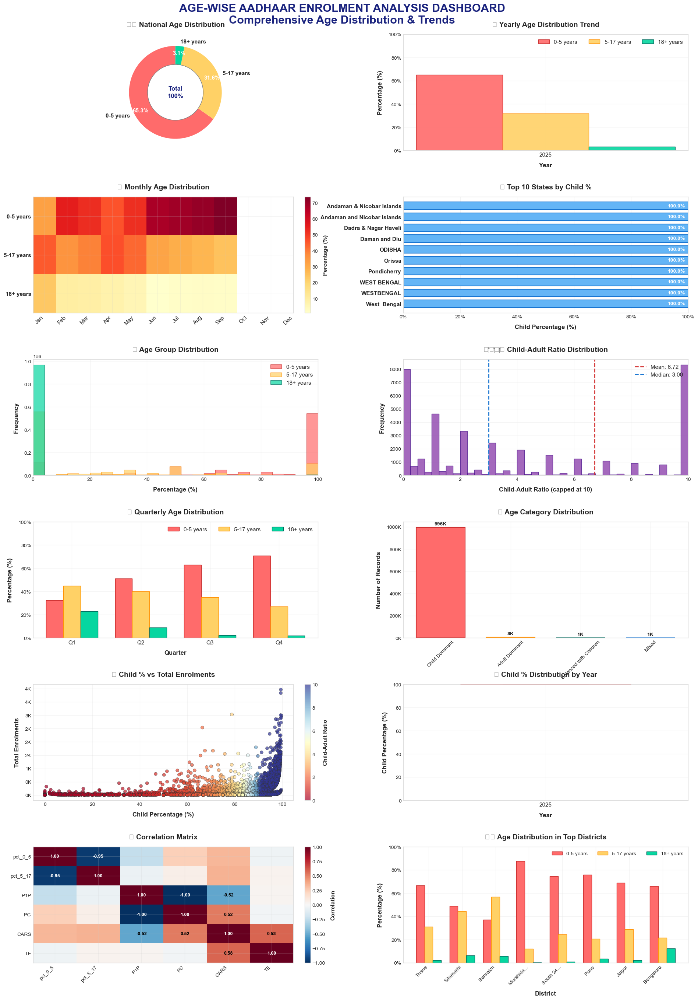

In [62]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter

# Set professional style
plt.style.use('seaborn-v0_8-whitegrid')

# Create figure with perfect 2-column layout
fig = plt.figure(figsize=(20, 28))  # Perfect portrait ratio
fig.suptitle('AGE-WISE AADHAAR ENROLMENT ANALYSIS DASHBOARD\nComprehensive Age Distribution & Trends', 
             fontsize=22, fontweight='bold', y=0.98, color='#1a237e')

# Create grid for 12 plots (6x2)
gs = fig.add_gridspec(6, 2, hspace=0.4, wspace=0.3, 
                      left=0.08, right=0.97, top=0.95, bottom=0.05)

# Professional color palette
age_colors = {
    '0-5 years': '#FF6B6B',    # Coral red
    '5-17 years': '#FFD166',   # Gold
    '18+ years': '#06D6A0'     # Teal
}

# Helper functions for formatting
def format_percent(x, pos):
    return f'{x:.0f}%'

def format_millions(x, pos):
    if x >= 1e6:
        return f'{x/1e6:.1f}M'
    return f'{x/1e3:.0f}K'

# ============================================
# ROW 1: National & Temporal Trends
# ============================================

# Plot 1: National Age Distribution Pie Chart
ax1 = fig.add_subplot(gs[0, 0])
age_groups = ['0-5 years', '5-17 years', '18+ years']
age_values = [national_age_totals['0_5'], national_age_totals['5_17'], national_age_totals['18_plus']]
colors = [age_colors['0-5 years'], age_colors['5-17 years'], age_colors['18+ years']]

wedges, texts, autotexts = ax1.pie(age_values, labels=age_groups, autopct='%1.1f%%', 
                                   colors=colors, startangle=90, pctdistance=0.85,
                                   textprops={'fontsize': 10, 'fontweight': 'bold'})

ax1.set_title('🏛️ National Age Distribution', fontsize=14, fontweight='bold', pad=15)

# Enhance pie chart labels
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontsize(11)
    autotext.set_fontweight('bold')

for text in texts:
    text.set_fontsize(11)
    text.set_fontweight('bold')

# Add center circle for donut effect
centre_circle = plt.Circle((0,0), 0.60, fc='white', edgecolor='gray', linewidth=1)
ax1.add_artist(centre_circle)
ax1.text(0, 0, f"Total\n100%", ha='center', va='center', 
         fontsize=12, fontweight='bold', color='#1a237e', linespacing=1.5)

# Plot 2: Yearly Trend of Age Distribution
ax2 = fig.add_subplot(gs[0, 1])
years = yearly_age_dist['year']
width = 0.25
x = np.arange(len(years))

bars_0_5 = ax2.bar(x - width, yearly_age_dist['pct_0_5'], width, 
                   label='0-5 years', color=age_colors['0-5 years'], 
                   edgecolor='#C62828', linewidth=1, alpha=0.9)
bars_5_17 = ax2.bar(x, yearly_age_dist['pct_5_17'], width, 
                    label='5-17 years', color=age_colors['5-17 years'], 
                    edgecolor='#FF8F00', linewidth=1, alpha=0.9)
bars_18_plus = ax2.bar(x + width, yearly_age_dist['pct_18_plus'], width, 
                       label='18+ years', color=age_colors['18+ years'], 
                       edgecolor='#00695C', linewidth=1, alpha=0.9)

ax2.set_xlabel('Year', fontsize=12, fontweight='bold')
ax2.set_ylabel('Percentage (%)', fontsize=12, fontweight='bold')
ax2.set_title('📈 Yearly Age Distribution Trend', fontsize=14, fontweight='bold', pad=15)
ax2.set_xticks(x)
ax2.set_xticklabels(years, fontsize=11)
ax2.legend(fontsize=11, framealpha=0.9, loc='upper right', ncol=3)
ax2.grid(True, alpha=0.2, axis='y')
ax2.set_ylim(0, 100)
ax2.yaxis.set_major_formatter(FuncFormatter(format_percent))

# ============================================
# ROW 2: Monthly & State Analysis
# ============================================

# Plot 3: Monthly Age Distribution Heatmap
ax3 = fig.add_subplot(gs[1, 0])
heatmap_data = monthly_age_dist[['pct_0_5', 'pct_5_17', 'pct_18_plus']].T
im = ax3.imshow(heatmap_data, cmap='YlOrRd', aspect='auto')
ax3.set_yticks(range(3))
ax3.set_yticklabels(['0-5 years', '5-17 years', '18+ years'], fontsize=11, fontweight='bold')
ax3.set_xticks(range(12))
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ax3.set_xticklabels(month_labels, rotation=45, ha='right', fontsize=11)
ax3.set_title('📅 Monthly Age Distribution', fontsize=14, fontweight='bold', pad=15)

cbar1 = plt.colorbar(im, ax=ax3, fraction=0.046, pad=0.04)
cbar1.set_label('Percentage (%)', fontsize=11, fontweight='bold')
cbar1.ax.tick_params(labelsize=10)

# Plot 4: Top States by Child Percentage
ax4 = fig.add_subplot(gs[1, 1])
top_10_child_states = state_age_dist.nlargest(10, 'pct_children')
y_pos = np.arange(len(top_10_child_states))
bars4 = ax4.barh(y_pos, top_10_child_states['pct_children'], 
                height=0.7, color='#64B5F6', edgecolor='#1976D2', linewidth=1.5)

ax4.set_yticks(y_pos)
ax4.set_yticklabels(top_10_child_states['state'], fontsize=11, fontweight='bold')
ax4.set_xlabel('Child Percentage (%)', fontsize=12, fontweight='bold')
ax4.set_title('👶 Top 10 States by Child %', fontsize=14, fontweight='bold', pad=15)
ax4.invert_yaxis()
ax4.grid(True, alpha=0.2, axis='x')
ax4.set_xlim(0, 100)
ax4.xaxis.set_major_formatter(FuncFormatter(format_percent))

# Add value labels
for bar, percentage in zip(bars4, top_10_child_states['pct_children']):
    width = bar.get_width()
    ax4.text(width - 1, bar.get_y() + bar.get_height()/2,
            f'{percentage:.1f}%', ha='right', va='center', 
            fontsize=10, fontweight='bold', color='white')

# ============================================
# ROW 3: Distribution Analysis
# ============================================

# Plot 5: Age Distribution Histograms
ax5 = fig.add_subplot(gs[2, 0])
# Use stacked histograms with transparency
hist_bins = np.linspace(0, 100, 26)
ax5.hist(df['pct_0_5'].dropna(), bins=hist_bins, alpha=0.7, 
        label='0-5 years', color=age_colors['0-5 years'], 
        edgecolor='#C62828', linewidth=0.8)
ax5.hist(df['pct_5_17'].dropna(), bins=hist_bins, alpha=0.7, 
        label='5-17 years', color=age_colors['5-17 years'], 
        edgecolor='#FF8F00', linewidth=0.8)
ax5.hist(df['pct_18_plus'].dropna(), bins=hist_bins, alpha=0.7, 
        label='18+ years', color=age_colors['18+ years'], 
        edgecolor='#00695C', linewidth=0.8)

ax5.set_xlabel('Percentage (%)', fontsize=12, fontweight='bold')
ax5.set_ylabel('Frequency', fontsize=12, fontweight='bold')
ax5.set_title('📊 Age Group Distribution', fontsize=14, fontweight='bold', pad=15)
ax5.legend(fontsize=11, framealpha=0.9)
ax5.grid(True, alpha=0.2)
ax5.set_xlim(0, 100)

# Plot 6: Child-Adult Ratio Distribution
ax6 = fig.add_subplot(gs[2, 1])
valid_ratios = df['child_adult_ratio_capped'].dropna()
n, bins, patches = ax6.hist(valid_ratios, bins=40, color='#8E44AD', 
                           alpha=0.8, edgecolor='#4A148C', linewidth=1)

if 'child_adult_ratio_safe' in df.columns:
    mean_val = df['child_adult_ratio_safe'].mean()
    median_val = df['child_adult_ratio_safe'].median()
else:
    mean_val = valid_ratios.mean()
    median_val = valid_ratios.median()

ax6.axvline(mean_val, color='#D32F2F', linestyle='--', linewidth=2, 
           label=f'Mean: {mean_val:.2f}')
ax6.axvline(median_val, color='#1976D2', linestyle='--', linewidth=2, 
           label=f'Median: {median_val:.2f}')

ax6.set_xlabel('Child-Adult Ratio (capped at 10)', fontsize=12, fontweight='bold')
ax6.set_ylabel('Frequency', fontsize=12, fontweight='bold')
ax6.set_title('👨‍👩‍👧‍👦 Child-Adult Ratio Distribution', fontsize=14, fontweight='bold', pad=15)
ax6.legend(fontsize=11, framealpha=0.9, loc='upper right')
ax6.grid(True, alpha=0.2)
ax6.set_xlim(0, 10)

# ============================================
# ROW 4: Quarterly & Categorical Analysis
# ============================================

# Plot 7: Quarterly Age Distribution
ax7 = fig.add_subplot(gs[3, 0])
quarters = quarterly_age_dist['quarter']
x = np.arange(len(quarters))
width = 0.25

bars_q1 = ax7.bar(x - width, quarterly_age_dist['pct_0_5'], width, 
                 label='0-5 years', color=age_colors['0-5 years'], 
                 edgecolor='#C62828', linewidth=1)
bars_q2 = ax7.bar(x, quarterly_age_dist['pct_5_17'], width, 
                 label='5-17 years', color=age_colors['5-17 years'], 
                 edgecolor='#FF8F00', linewidth=1)
bars_q3 = ax7.bar(x + width, quarterly_age_dist['pct_18_plus'], width, 
                 label='18+ years', color=age_colors['18+ years'], 
                 edgecolor='#00695C', linewidth=1)

ax7.set_xlabel('Quarter', fontsize=12, fontweight='bold')
ax7.set_ylabel('Percentage (%)', fontsize=12, fontweight='bold')
ax7.set_title('📅 Quarterly Age Distribution', fontsize=14, fontweight='bold', pad=15)
ax7.set_xticks(x)
ax7.set_xticklabels([f'Q{q}' for q in quarters], fontsize=11)
ax7.legend(fontsize=11, framealpha=0.9, loc='upper right', ncol=3)
ax7.grid(True, alpha=0.2, axis='y')
ax7.set_ylim(0, 100)
ax7.yaxis.set_major_formatter(FuncFormatter(format_percent))

# Plot 8: Age Category Distribution
ax8 = fig.add_subplot(gs[3, 1])
if age_category_dist is not None:
    categories = age_category_dist.index
    counts = age_category_dist.values
    colors_cat = ['#FF6B6B', '#FFD166', '#06D6A0', '#64B5F6']
    
    bars8 = ax8.bar(categories, counts, color=colors_cat, 
                   edgecolor=['#C62828', '#FF8F00', '#00695C', '#1976D2'], 
                   linewidth=1.5, width=0.7)
    
    ax8.set_xlabel('Age Category', fontsize=12, fontweight='bold')
    ax8.set_ylabel('Number of Records', fontsize=12, fontweight='bold')
    ax8.set_title('📋 Age Category Distribution', fontsize=14, fontweight='bold', pad=15)
    ax8.tick_params(axis='x', rotation=45)
    ax8.grid(True, alpha=0.2, axis='y')
    
    # Format y-axis based on magnitude
    max_count = counts.max()
    if max_count > 1000000:
        ax8.yaxis.set_major_formatter(FuncFormatter(lambda x, p: f'{x/1e6:.1f}M'))
    elif max_count > 1000:
        ax8.yaxis.set_major_formatter(FuncFormatter(lambda x, p: f'{x/1e3:.0f}K'))
    
    # Add value labels
    for bar, count in zip(bars8, counts):
        height = bar.get_height()
        if max_count > 1000000:
            label = f'{count/1e6:.1f}M'
        elif max_count > 1000:
            label = f'{count/1e3:.0f}K'
        else:
            label = f'{count:.0f}'
        
        ax8.text(bar.get_x() + bar.get_width()/2., height + (max_count * 0.01),
                label, ha='center', va='bottom', fontsize=10, fontweight='bold')
else:
    ax8.text(0.5, 0.5, 'Age Category Data\nNot Available', 
             ha='center', va='center', fontsize=14, fontweight='bold',
             transform=ax8.transAxes)
    ax8.set_xticks([])
    ax8.set_yticks([])

# ============================================
# ROW 5: Relationships & Trends
# ============================================

# Plot 9: Scatter Plot - Child % vs Total Enrolments
ax9 = fig.add_subplot(gs[4, 0])
# Ensure we have the required columns
if 'pct_children' in df.columns and 'total_enrolments' in df.columns:
    scatter_data = df[(df['pct_children'] <= 100) & (df['pct_children'] >= 0)].copy()
    
    # Use safe ratio if available
    if 'child_adult_ratio_capped' in scatter_data.columns:
        ratio_col = 'child_adult_ratio_capped'
    elif 'child_adult_ratio_safe' in scatter_data.columns:
        ratio_col = 'child_adult_ratio_safe'
    else:
        # Create safe ratio if neither exists
        scatter_data['ratio'] = scatter_data['pct_children'] / (100 - scatter_data['pct_children']).clip(lower=1)
        ratio_col = 'ratio'
    
    scatter = ax9.scatter(scatter_data['pct_children'], scatter_data['total_enrolments'], 
                         c=scatter_data[ratio_col], cmap='RdYlBu', alpha=0.7, s=40, 
                         edgecolor='#333', linewidth=0.5, vmin=0, vmax=10)
    
    ax9.set_xlabel('Child Percentage (%)', fontsize=12, fontweight='bold')
    ax9.set_ylabel('Total Enrolments', fontsize=12, fontweight='bold')
    ax9.set_title('📈 Child % vs Total Enrolments', fontsize=14, fontweight='bold', pad=15)
    ax9.grid(True, alpha=0.2)
    ax9.yaxis.set_major_formatter(FuncFormatter(format_millions))
    
    cbar2 = plt.colorbar(scatter, ax=ax9, fraction=0.046, pad=0.04)
    cbar2.set_label('Child-Adult Ratio', fontsize=11, fontweight='bold')
    cbar2.ax.tick_params(labelsize=10)
else:
    ax9.text(0.5, 0.5, 'Required Data\nNot Available', 
             ha='center', va='center', fontsize=14, fontweight='bold',
             transform=ax9.transAxes)
    ax9.set_xticks([])
    ax9.set_yticks([])

# Plot 10: Box Plot of Age Percentages by Year
ax10 = fig.add_subplot(gs[4, 1])
if 'pct_children' in df.columns and 'year' in df.columns:
    years_sorted = sorted(df['year'].unique())
    boxplot_data = [df[df['year'] == year]['pct_children'].dropna() for year in years_sorted]
    
    if boxplot_data:  # Check if we have data
        bp = ax10.boxplot(boxplot_data, patch_artist=True, widths=0.6, showfliers=False)
        
        # Customize box colors
        for patch in bp['boxes']:
            patch.set_facecolor('#90CAF9')
            patch.set_alpha(0.8)
            patch.set_edgecolor('#1976D2')
            patch.set_linewidth(1.5)
        
        # Customize median lines
        for median in bp['medians']:
            median.set_color('#D32F2F')
            median.set_linewidth(2)
        
        ax10.set_xlabel('Year', fontsize=12, fontweight='bold')
        ax10.set_ylabel('Child Percentage (%)', fontsize=12, fontweight='bold')
        ax10.set_title('📦 Child % Distribution by Year', fontsize=14, fontweight='bold', pad=15)
        ax10.set_xticklabels(years_sorted, fontsize=11)
        ax10.grid(True, alpha=0.2, axis='y')
        ax10.set_ylim(0, 100)
else:
    ax10.text(0.5, 0.5, 'Required Data\nNot Available', 
             ha='center', va='center', fontsize=14, fontweight='bold',
             transform=ax10.transAxes)
    ax10.set_xticks([])
    ax10.set_yticks([])

# ============================================
# ROW 6: Correlation & District Analysis
# ============================================

# Plot 11: Correlation Heatmap
ax11 = fig.add_subplot(gs[5, 0])
if correlation_matrix is not None:
    im2 = ax11.imshow(correlation_matrix, cmap='RdBu_r', vmin=-1, vmax=1, aspect='auto')
    
    # Create labels
    col_labels = []
    for col in correlation_matrix.columns:
        if len(col) > 10:
            # Shorten long column names
            if '_' in col:
                parts = col.split('_')
                short_name = ''.join([p[0] for p in parts])
                col_labels.append(short_name.upper())
            else:
                col_labels.append(col[:8])
        else:
            col_labels.append(col)
    
    ax11.set_xticks(range(len(correlation_matrix.columns)))
    ax11.set_yticks(range(len(correlation_matrix.columns)))
    ax11.set_xticklabels(col_labels, rotation=45, ha='right', fontsize=10)
    ax11.set_yticklabels(col_labels, fontsize=10)
    ax11.set_title('🔗 Correlation Matrix', fontsize=14, fontweight='bold', pad=15)
    
    # Add correlation values for strong correlations
    for i in range(len(correlation_matrix.columns)):
        for j in range(len(correlation_matrix.columns)):
            value = correlation_matrix.iloc[i, j]
            if abs(value) > 0.5:  # Only show strong correlations
                color = 'white' if abs(value) > 0.7 else 'black'
                ax11.text(j, i, f'{value:.2f}', ha='center', va='center', 
                        color=color, fontsize=9, fontweight='bold')
    
    cbar3 = plt.colorbar(im2, ax=ax11, fraction=0.046, pad=0.04)
    cbar3.set_label('Correlation', fontsize=11, fontweight='bold')
    cbar3.ax.tick_params(labelsize=10)
else:
    ax11.text(0.5, 0.5, 'Correlation Matrix\nNot Available', 
             ha='center', va='center', fontsize=14, fontweight='bold',
             transform=ax11.transAxes)
    ax11.set_xticks([])
    ax11.set_yticks([])

# Plot 12: Age Group Composition in Top Districts
ax12 = fig.add_subplot(gs[5, 1])
if district_age_df is not None and len(district_age_df) > 0:
    top_8_districts = district_age_df.head(8)
    x = np.arange(len(top_8_districts))
    width = 0.25
    
    bars_d1 = ax12.bar(x - width, top_8_districts['pct_0_5'], width, 
                      label='0-5 years', color=age_colors['0-5 years'], 
                      edgecolor='#C62828', linewidth=1)
    bars_d2 = ax12.bar(x, top_8_districts['pct_5_17'], width, 
                      label='5-17 years', color=age_colors['5-17 years'], 
                      edgecolor='#FF8F00', linewidth=1)
    bars_d3 = ax12.bar(x + width, top_8_districts['pct_18_plus'], width, 
                      label='18+ years', color=age_colors['18+ years'], 
                      edgecolor='#00695C', linewidth=1)
    
    ax12.set_xlabel('District', fontsize=12, fontweight='bold')
    ax12.set_ylabel('Percentage (%)', fontsize=12, fontweight='bold')
    ax12.set_title('🏙️ Age Distribution in Top Districts', fontsize=14, fontweight='bold', pad=15)
    ax12.set_xticks(x)
    
    # Smart district label truncation
    district_labels = []
    for d in top_8_districts['district']:
        if len(d) > 10:
            district_labels.append(f"{d[:8]}...")
        else:
            district_labels.append(d)
    
    ax12.set_xticklabels(district_labels, rotation=45, ha='right', fontsize=10)
    ax12.legend(fontsize=10, framealpha=0.9, loc='upper right', ncol=3)
    ax12.grid(True, alpha=0.2, axis='y')
    ax12.set_ylim(0, 100)
    ax12.yaxis.set_major_formatter(FuncFormatter(format_percent))
else:
    ax12.text(0.5, 0.5, 'District Data\nNot Available', 
             ha='center', va='center', fontsize=14, fontweight='bold',
             transform=ax12.transAxes)
    ax12.set_xticks([])
    ax12.set_yticks([])

# ============================================
# FINAL POLISH
# ============================================

# Add subtle borders to all subplots
for ax in fig.axes:
    for spine in ax.spines.values():
        spine.set_edgecolor('#DDDDDD')
        spine.set_linewidth(1)
    
    # Ensure grid is visible but subtle
    if hasattr(ax, 'grid'):
        ax.grid(True, alpha=0.2)

plt.tight_layout()
plt.savefig('age_wise_analysis_professional.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

#### 4.6.11 [ KEY INSIGHTS FROM AGE-WISE ANALYSIS ]

In [63]:
print("\n" + "="*80)
print("KEY INSIGHTS FROM AGE-WISE ANALYSIS")
print("="*80)

# Insight 1: Overall age distribution
print(f"\n1. OVERALL AGE DISTRIBUTION:")
print(f"   - Children (0-17): {child_percentage:.1f}% of total enrolments")
print(f"   - Adults (18+): {adult_percentage:.1f}% of total enrolments")
print(f"   - Average child-adult ratio: {total_children/total_adults:.3f}")

# Insight 2: Yearly trends
if len(yearly_age_dist) > 1:
    first_year = yearly_age_dist.iloc[0]
    last_year = yearly_age_dist.iloc[-1]
    child_change = last_year['pct_children'] - first_year['pct_children']
    trend = "increasing" if child_change > 0 else "decreasing"
    print(f"\n2. TEMPORAL TREND:")
    print(f"   - Child enrolment percentage has been {trend} by {abs(child_change):.1f} percentage points")
    print(f"   - Current year: {last_year['pct_children']:.1f}% children")

# Insight 3: Seasonal patterns
max_child_month = monthly_age_dist.loc[monthly_age_dist['pct_children'].idxmax()]
min_child_month = monthly_age_dist.loc[monthly_age_dist['pct_children'].idxmin()]
print(f"\n3. SEASONAL PATTERNS:")
print(f"   - Highest child enrolment: {max_child_month['month_name']} ({max_child_month['pct_children']:.1f}%)")
print(f"   - Lowest child enrolment: {min_child_month['month_name']} ({min_child_month['pct_children']:.1f}%)")

# Insight 4: State variations
max_child_state = state_age_dist.loc[state_age_dist['pct_children'].idxmax()]
min_child_state = state_age_dist.loc[state_age_dist['pct_children'].idxmin()]
print(f"\n4. STATE-WISE VARIATIONS:")
print(f"   - Highest child enrolment state: {max_child_state['state']} ({max_child_state['pct_children']:.1f}%)")
print(f"   - Lowest child enrolment state: {min_child_state['state']} ({min_child_state['pct_children']:.1f}%)")

# Insight 5: Statistical patterns
print(f"\n5. STATISTICAL PATTERNS:")
print(f"   - Most common age category: {age_category_dist.idxmax()} ({age_category_dist.max()/len(df)*100:.1f}% of records)")
print(f"   - Standard deviation of child percentage: {df['pct_children'].std():.1f}%")

# Insight 6: Correlations
print(f"\n6. SIGNIFICANT CORRELATIONS:")
print(f"   - Child % vs Adult % correlation: {correlation_matrix.loc['pct_children', 'pct_18_plus']:.3f}")
print(f"   - Child-Adult Ratio vs Child % correlation: {correlation_matrix.loc['child_adult_ratio_safe', 'pct_children']:.3f}")

# Insight 7: Distribution characteristics
print(f"\n7. DISTRIBUTION CHARACTERISTICS:")
print(f"   - 75% of records have child percentage below: {df['pct_children'].quantile(0.75):.1f}%")
print(f"   - 25% of records have child percentage above: {df['pct_children'].quantile(0.25):.1f}%")

print("\n" + "="*80)
print("ANALYSIS COMPLETE")
print("="*80)


KEY INSIGHTS FROM AGE-WISE ANALYSIS

1. OVERALL AGE DISTRIBUTION:
   - Children (0-17): 96.9% of total enrolments
   - Adults (18+): 3.1% of total enrolments
   - Average child-adult ratio: 31.288

3. SEASONAL PATTERNS:
   - Highest child enrolment: Sep (99.0%)
   - Lowest child enrolment: Mar (77.0%)

4. STATE-WISE VARIATIONS:
   - Highest child enrolment state: Andaman & Nicobar Islands (100.0%)
   - Lowest child enrolment state: 100000 (0.5%)

5. STATISTICAL PATTERNS:
   - Most common age category: Child Dominant (99.0% of records)
   - Standard deviation of child percentage: 10.4%

6. SIGNIFICANT CORRELATIONS:
   - Child % vs Adult % correlation: -1.000
   - Child-Adult Ratio vs Child % correlation: 0.520

7. DISTRIBUTION CHARACTERISTICS:
   - 75% of records have child percentage below: 100.0%
   - 25% of records have child percentage above: 100.0%

ANALYSIS COMPLETE


#### 4.6.12 [ AGE PROFILE CLUSTERING ANALYSIS ]

In [64]:
print("\n" + "="*80)
print("AGE PROFILE CLUSTERING ANALYSIS")
print("="*80)

try:
    # Create age profile clusters
    from sklearn.cluster import KMeans
    from sklearn.preprocessing import StandardScaler

    # Prepare data for clustering
    cluster_data = df[['pct_0_5', 'pct_5_17', 'pct_18_plus']].copy()
    cluster_data = cluster_data.fillna(cluster_data.mean())

    # Standardize the data
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(cluster_data)

    # Apply K-means clustering
    kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
    df['age_cluster'] = kmeans.fit_predict(scaled_data)

    # Analyze clusters
    cluster_analysis = df.groupby('age_cluster').agg({
        'pct_0_5': 'mean',
        'pct_5_17': 'mean',
        'pct_18_plus': 'mean',
        'pct_children': 'mean',
        'child_adult_ratio_safe': 'mean',
        'total_enrolments': 'mean',
        'state': 'count'
    }).round(2)

    cluster_analysis = cluster_analysis.rename(columns={'state': 'record_count'})
    print("\nAge Profile Clusters:")
    print(cluster_analysis)

    # Label clusters based on characteristics
    cluster_labels = {}
    for cluster in cluster_analysis.index:
        row = cluster_analysis.loc[cluster]
        if row['pct_18_plus'] > 70:
            label = 'Adult Focused'
        elif row['pct_children'] > 40:
            label = 'Child Focused'
        elif row['pct_5_17'] > 30:
            label = 'School Age Focused'
        else:
            label = 'Balanced'
        cluster_labels[cluster] = label
        print(f"\nCluster {cluster} ({label}):")
        print(f"  - 0-5 years: {row['pct_0_5']:.1f}%")
        print(f"  - 5-17 years: {row['pct_5_17']:.1f}%")
        print(f"  - 18+ years: {row['pct_18_plus']:.1f}%")
        print(f"  - Children (0-17): {row['pct_children']:.1f}%")
        print(f"  - Child-Adult Ratio: {row['child_adult_ratio_safe']:.2f}")
        print(f"  - Records: {row['record_count']:,}")
        
except Exception as e:
    print(f"\nNote: Clustering analysis skipped due to: {e}")
    print("Continuing with other analysis...")


AGE PROFILE CLUSTERING ANALYSIS


  File "C:\ProgramData\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
        "wmic CPU Get NumberOfCores /Format:csv".split(),
        capture_output=True,
        text=True,
    )
  File "C:\ProgramData\anaconda3\Lib\subprocess.py", line 554, in run
    with Popen(*popenargs, **kwargs) as process:
         ~~~~~^^^^^^^^^^^^^^^^^^^^^^
  File "C:\ProgramData\anaconda3\Lib\subprocess.py", line 1039, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
    ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
                        pass_fds, cwd, env,
                        ^^^^^^^^^^^^^^^^^^^
    ...<5 lines>...
                        gid, gids, uid, umask,
                        ^^^^^^^^^^^^^^^^^^^^^^
                        start_new_session, process_group)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\ProgramData\anaconda3\Lib\subprocess.


Age Profile Clusters:
             pct_0_5  pct_5_17  pct_18_plus  pct_children  \
age_cluster                                                 
0              55.64     43.43         0.94         99.06   
1              98.18      1.63         0.19         99.81   
2              15.10      7.82        77.08         22.92   
3               4.31     95.35         0.34         99.66   

             child_adult_ratio_safe  total_enrolments  record_count  
age_cluster                                                          
0                             11.65             11.02        248024  
1                              8.55              3.45        609641  
2                              0.45              5.70         15671  
3                             10.50              3.86        132693  

Cluster 0 (Child Focused):
  - 0-5 years: 55.6%
  - 5-17 years: 43.4%
  - 18+ years: 0.9%
  - Children (0-17): 99.1%
  - Child-Adult Ratio: 11.65
  - Records: 248,024.0

Cluster 1 (Child Fo

#### 4.6.13 [ EXPORT KEY FINDINGS ]

In [65]:
# Create summary DataFrames
print("\n" + "="*80)
print("SUMMARY OF KEY FINDINGS")
print("="*80)

# Top 5 states for each age group
print("\nTOP 5 STATES BY AGE GROUP ENROLMENT PERCENTAGE:")
for age_group, col_name in [('0-5 years', 'pct_0_5'), ('5-17 years', 'pct_5_17'), 
                           ('18+ years', 'pct_18_plus'), ('Children (0-17)', 'pct_children')]:
    top_states = state_age_dist.nlargest(5, col_name)[['state', col_name, 'total_enrolments']]
    print(f"\n{age_group}:")
    for _, row in top_states.iterrows():
        print(f"  - {row['state']}: {row[col_name]:.1f}% ({row['total_enrolments']:,} enrolments)")

# Monthly pattern summary
print("\nMONTHLY PATTERNS:")
print("Months with highest child enrolment:")
for month in monthly_age_dist.nlargest(3, 'pct_children')[['month_name', 'pct_children']].itertuples():
    print(f"  - {month.month_name}: {month.pct_children:.1f}% children")

print("\nMonths with highest adult enrolment:")
for month in monthly_age_dist.nlargest(3, 'pct_18_plus')[['month_name', 'pct_18_plus']].itertuples():
    print(f"  - {month.month_name}: {month.pct_18_plus:.1f}% adults")

# Yearly trend summary
if len(yearly_age_dist) > 1:
    print("\nYEARLY TREND SUMMARY:")
    for year_data in yearly_age_dist[['year', 'total_enrolments', 'pct_children']].itertuples():
        print(f"  - {year_data.year}: {year_data.pct_children:.1f}% children ({year_data.total_enrolments:,} total)")

print("\n" + "="*80)
print("ANALYSIS COMPLETED SUCCESSFULLY!")
print("="*80)


SUMMARY OF KEY FINDINGS

TOP 5 STATES BY AGE GROUP ENROLMENT PERCENTAGE:

0-5 years:
  - ODISHA: 100.0% (1 enrolments)
  - WESTBENGAL: 100.0% (1 enrolments)
  - andhra pradesh: 100.0% (5 enrolments)
  - Andaman & Nicobar Islands: 95.6% (114 enrolments)
  - Daman & Diu: 95.2% (21 enrolments)

5-17 years:
  - Nagaland: 63.9% (15,587 enrolments)
  - Manipur: 59.8% (13,456 enrolments)
  - Bihar: 54.9% (609,585 enrolments)
  - Arunachal Pradesh: 51.5% (4,344 enrolments)
  - Westbengal: 50.0% (6 enrolments)

18+ years:
  - 100000: 99.5% (218 enrolments)
  - Meghalaya: 32.1% (109,771 enrolments)
  - Dadra and Nagar Haveli and Daman and Diu: 12.1% (173 enrolments)
  - Assam: 9.9% (230,197 enrolments)
  - Mizoram: 8.4% (5,926 enrolments)

Children (0-17):
  - Andaman & Nicobar Islands: 100.0% (114 enrolments)
  - Andaman and Nicobar Islands: 100.0% (397 enrolments)
  - Dadra & Nagar Haveli: 100.0% (25 enrolments)
  - Daman and Diu: 100.0% (120 enrolments)
  - ODISHA: 100.0% (1 enrolments)

MON

### 4.7 Monthly Enrolment Trends and Seasonal Pattern Analysis

#### 4.7.1 [ TEMPORAL ANALYSIS - TIME SERIES DECOMPOSITION ]

In [66]:
print("\n" + "="*80)
print("1. TEMPORAL ANALYSIS - TIME SERIES DECOMPOSITION")
print("="*80)

# Create daily time series
daily_series = df.groupby('date').agg({
    'total_enrolments': 'sum',
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum'
}).sort_index()

# Calculate moving averages
daily_series['7_day_MA'] = daily_series['total_enrolments'].rolling(window=7).mean()
daily_series['30_day_MA'] = daily_series['total_enrolments'].rolling(window=30).mean()

# Monthly aggregation for trend analysis
monthly_series = df.groupby(['year', 'month']).agg({
    'total_enrolments': 'sum',
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum'
}).reset_index()
monthly_series['period'] = pd.to_datetime(monthly_series[['year', 'month']].assign(day=1))

print("\nMonthly Enrolment Trends:")
print(monthly_series[['year', 'month', 'total_enrolments']].to_string(index=False))

# Calculate growth rates
monthly_series['prev_month'] = monthly_series['total_enrolments'].shift(1)
monthly_series['mom_growth'] = ((monthly_series['total_enrolments'] - monthly_series['prev_month']) / 
                                 monthly_series['prev_month']) * 100


1. TEMPORAL ANALYSIS - TIME SERIES DECOMPOSITION

Monthly Enrolment Trends:
 year  month  total_enrolments
 2025      3             16582
 2025      4            257438
 2025      5            183616
 2025      6            215734
 2025      7            616868
 2025      9           1475879
 2025     10            817920
 2025     11           1092007
 2025     12            759658


#### 4.7.2 [  SEASONALITY AND CYCLICAL PATTERNS ANALYSIS ]

In [67]:
print("\n" + "="*80)
print("2. SEASONALITY AND CYCLICAL PATTERNS ANALYSIS")
print("="*80)

# Day of week analysis
dow_analysis = df.groupby('day_of_week').agg({
    'total_enrolments': 'sum',
    'age_0_5': 'sum',
    'age_5_17': 'sum',
    'age_18_greater': 'sum'
}).reset_index()

dow_analysis['day_name'] = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 
                           'Friday', 'Saturday', 'Sunday']
dow_analysis['avg_daily'] = dow_analysis['total_enrolments'] / df['date'].nunique()

print("\nDay of Week Analysis:")
print(dow_analysis[['day_name', 'total_enrolments', 'avg_daily']].to_string(index=False))

# Month-over-month seasonality
month_seasonality = df.groupby('month').agg({
    'total_enrolments': ['sum', 'mean', 'std'],
    'age_0_5': 'mean',
    'age_5_17': 'mean',
    'age_18_greater': 'mean'
}).round(2)

month_seasonality.columns = ['_'.join(col).strip() for col in month_seasonality.columns.values]
month_seasonality = month_seasonality.reset_index()
month_seasonality['month_name'] = month_seasonality['month'].apply(lambda x: month_names[x-1])

print("\nMonthly Seasonality Patterns:")
print(month_seasonality[['month_name', 'total_enrolments_sum', 'total_enrolments_mean', 
                        'total_enrolments_std']].to_string(index=False))


2. SEASONALITY AND CYCLICAL PATTERNS ANALYSIS

Day of Week Analysis:
 day_name  total_enrolments    avg_daily
   Monday            813517  8842.576087
  Tuesday           1416694 15398.847826
Wednesday            763556  8299.521739
 Thursday            725129  7881.836957
   Friday            564585  6136.793478
 Saturday            530703  5768.510870
   Sunday            621518  6755.630435

Monthly Seasonality Patterns:
month_name  total_enrolments_sum  total_enrolments_mean  total_enrolments_std
       Mar                 16582                  98.70                 55.62
       Apr                257438                 303.94                282.93
       May                183616                 334.46                313.56
       Jun                215734                 370.68                300.76
       Jul                616868                 521.00                471.29
       Sep               1475879                   4.15                  5.50
       Oct               

#### 4.7.3 [ PERFORMANCE BENCHMARKING & RANKING ANALYSIS ]

In [68]:
print("\n" + "="*80)
print("3. PERFORMANCE BENCHMARKING & RANKING ANALYSIS")
print("="*80)

# State performance benchmarking
state_performance = df.groupby('state').agg({
    'total_enrolments': 'sum',
    'age_0_5': 'mean',
    'age_5_17': 'mean',
    'age_18_greater': 'mean',
    'date': 'nunique'  # Number of active days
}).reset_index()

state_performance.rename(columns={'date': 'active_days'}, inplace=True)
state_performance['enrolments_per_day'] = state_performance['total_enrolments'] / state_performance['active_days']

# Calculate z-scores for benchmarking
state_performance['enrolments_zscore'] = stats.zscore(state_performance['total_enrolments'])
state_performance['efficiency_zscore'] = stats.zscore(state_performance['enrolments_per_day'])

# Performance quartiles
state_performance['enrolments_quartile'] = pd.qcut(state_performance['total_enrolments'], 
                                                   q=4, labels=['Q4', 'Q3', 'Q2', 'Q1'])
state_performance['efficiency_quartile'] = pd.qcut(state_performance['enrolments_per_day'], 
                                                   q=4, labels=['Q4', 'Q3', 'Q2', 'Q1'])

print("\nTop 10 States by Total Enrolments:")
top_total = state_performance.nlargest(10, 'total_enrolments')[['state', 'total_enrolments', 'enrolments_zscore', 'enrolments_quartile']]
print(top_total.to_string(index=False))

print("\nTop 10 States by Efficiency (Enrolments per Day):")
top_efficient = state_performance.nlargest(10, 'enrolments_per_day')[['state', 'enrolments_per_day', 'efficiency_zscore', 'efficiency_quartile']]
print(top_efficient.to_string(index=False))


3. PERFORMANCE BENCHMARKING & RANKING ANALYSIS


NameError: name 'stats' is not defined

#### 4.7.4 [ GEOGRAPHIC CONCENTRATION ANALYSIS ]

In [69]:
print("\n" + "="*80)
print("4. GEOGRAPHIC CONCENTRATION ANALYSIS")
print("="*80)

# State concentration metrics
state_totals = state_performance[['state', 'total_enrolments']].sort_values('total_enrolments', ascending=False)
state_totals['cumulative_sum'] = state_totals['total_enrolments'].cumsum()
state_totals['cumulative_percentage'] = (state_totals['cumulative_sum'] / state_totals['total_enrolments'].sum()) * 100

# Find how many states make up 80% of enrolments
states_80_percent = state_totals[state_totals['cumulative_percentage'] <= 80]
states_50_percent = state_totals[state_totals['cumulative_percentage'] <= 50]

print(f"\nGeographic Concentration:")
print(f"- Top {len(states_50_percent)} states account for 50% of all enrolments")
print(f"- Top {len(states_80_percent)} states account for 80% of all enrolments")
print(f"- Top state: {state_totals.iloc[0]['state']} ({state_totals.iloc[0]['total_enrolments']/state_totals['total_enrolments'].sum()*100:.1f}% of total)")

# Calculate Herfindahl-Hirschman Index (HHI) for concentration
state_shares = (state_totals['total_enrolments'] / state_totals['total_enrolments'].sum()) * 100
hhi = (state_shares ** 2).sum()

print(f"- HHI Index: {hhi:.2f}")
if hhi < 1500:
    print("  (Market: Unconcentrated)")
elif hhi < 2500:
    print("  (Market: Moderately concentrated)")
else:
    print("  (Market: Highly concentrated)")


4. GEOGRAPHIC CONCENTRATION ANALYSIS

Geographic Concentration:
- Top 4 states account for 50% of all enrolments
- Top 11 states account for 80% of all enrolments
- Top state: Uttar Pradesh (18.7% of total)
- HHI Index: 816.35
  (Market: Unconcentrated)


#### 4.7.5 [ DEMOGRAPHIC SEGMENTATION ANALYSIS ]

In [70]:
print("\n" + "="*80)
print("5. DEMOGRAPHIC SEGMENTATION ANALYSIS")
print("="*80)

# Create demographic segments based on age distribution
def create_demographic_segment(row):
    child_pct = row['pct_children']
    young_child_pct = row['pct_0_5']
    school_age_pct = row['pct_5_17']
    
    if child_pct > 40:
        if young_child_pct > school_age_pct:
            return 'Young Family Focus'
        else:
            return 'School Age Family Focus'
    elif child_pct > 25:
        return 'Family Mixed'
    elif row['pct_18_plus'] > 80:
        return 'Adult Dominant'
    else:
        return 'Balanced Population'

df['demographic_segment'] = df.apply(create_demographic_segment, axis=1)

# Analyze segments
segment_analysis = df.groupby('demographic_segment').agg({
    'total_enrolments': 'sum',
    'pct_0_5': 'mean',
    'pct_5_17': 'mean',
    'pct_18_plus': 'mean',
    'state': 'nunique',
    'district': 'nunique'
}).round(2)

segment_analysis = segment_analysis.rename(columns={
    'state': 'states_count',
    'district': 'districts_count'
})

print("\nDemographic Segments Analysis:")
print(segment_analysis.to_string())


5. DEMOGRAPHIC SEGMENTATION ANALYSIS

Demographic Segments Analysis:
                         total_enrolments  pct_0_5  pct_5_17  pct_18_plus  states_count  districts_count
demographic_segment                                                                                     
Adult Dominant                      21909     0.41      0.28        99.31            36              651
Balanced Population                  4299    15.04      8.13        76.83            28              188
Family Mixed                        11117    22.58     11.72        65.70            32              350
School Age Family Focus           1580507    23.62     75.38         1.00            50              940
Young Family Focus                3817870    92.58      6.86         0.57            54              972


#### 4.7.6 [ ENROLMENT EFFICIENCY METRICS ]

In [71]:
print("\n" + "="*80)
print("6. ENROLMENT EFFICIENCY METRICS")
print("="*80)

# Calculate efficiency metrics
efficiency_metrics = df.groupby(['state', 'district']).agg({
    'total_enrolments': 'sum',
    'date': 'nunique',
    'pincode': 'nunique'
}).reset_index()

efficiency_metrics.rename(columns={
    'date': 'active_days',
    'pincode': 'unique_pincodes'
}, inplace=True)

efficiency_metrics['enrolments_per_day'] = efficiency_metrics['total_enrolments'] / efficiency_metrics['active_days']
efficiency_metrics['enrolments_per_pincode'] = efficiency_metrics['total_enrolments'] / efficiency_metrics['unique_pincodes']
efficiency_metrics['pincodes_per_day'] = efficiency_metrics['unique_pincodes'] / efficiency_metrics['active_days']

# Identify high-efficiency districts
high_efficiency = efficiency_metrics[
    (efficiency_metrics['enrolments_per_day'] > efficiency_metrics['enrolments_per_day'].quantile(0.75)) &
    (efficiency_metrics['enrolments_per_pincode'] > efficiency_metrics['enrolments_per_pincode'].quantile(0.75))
]

print(f"\nHigh Efficiency Districts (Top 25% in both metrics): {len(high_efficiency)} districts")
print("\nTop 10 Most Efficient Districts:")
print(high_efficiency.nlargest(10, 'enrolments_per_day')[['state', 'district', 'enrolments_per_day', 'enrolments_per_pincode']].to_string(index=False))


6. ENROLMENT EFFICIENCY METRICS

High Efficiency Districts (Top 25% in both metrics): 182 districts

Top 10 Most Efficient Districts:
         state        district  enrolments_per_day  enrolments_per_pincode
     Karnataka Bengaluru Urban         5768.500000              490.936170
   West Bengal  Dinajpur Uttar         3890.333333             1945.166667
         Bihar Purbi Champaran         3717.750000             1239.250000
 Uttar Pradesh Siddharth Nagar         2170.500000              723.500000
 Uttar Pradesh     Kushi Nagar         1570.000000             1570.000000
       Haryana             Nuh         1506.000000              753.000000
Madhya Pradesh      Ashoknagar         1505.500000             1003.666667
   West Bengal      Coochbehar         1470.000000              551.250000
     Jharkhand   East Singhbum         1447.000000              361.750000
 Uttar Pradesh       Shravasti         1267.500000             1267.500000


#### 4.7.7 [ CORRELATION AND PATTERN ANALYSIS ]

In [72]:
print("\n" + "="*80)
print("7. CORRELATION AND PATTERN ANALYSIS")
print("="*80)

# Comprehensive correlation analysis
correlation_vars = ['total_enrolments', 'pct_0_5', 'pct_5_17', 'pct_18_plus', 
                   'pct_children', 'child_adult_ratio_safe', 'year', 'month', 
                   'quarter', 'day_of_week']

corr_data = df[correlation_vars].corr()

print("\nTop Correlations (>0.3 or <-0.3):")
strong_correlations = []
for i in range(len(corr_data.columns)):
    for j in range(i+1, len(corr_data.columns)):
        corr_value = corr_data.iloc[i, j]
        if abs(corr_value) > 0.3 and not pd.isna(corr_value):
            strong_correlations.append({
                'var1': corr_data.columns[i],
                'var2': corr_data.columns[j],
                'correlation': corr_value
            })

strong_correlations_df = pd.DataFrame(strong_correlations).sort_values('correlation', ascending=False)
print(strong_correlations_df.to_string(index=False))


7. CORRELATION AND PATTERN ANALYSIS

Top Correlations (>0.3 or <-0.3):
            var1                   var2  correlation
           month                quarter     0.838226
total_enrolments child_adult_ratio_safe     0.582429
    pct_children child_adult_ratio_safe     0.519783
        pct_5_17 child_adult_ratio_safe     0.344188
         pct_0_5 child_adult_ratio_safe     0.334949
     pct_18_plus child_adult_ratio_safe    -0.519783
         pct_0_5               pct_5_17    -0.954584
     pct_18_plus           pct_children    -1.000000


#### 4.7.8 [ ABNORMALITY AND OUTLIER DETECTION ]

In [73]:
print("\n" + "="*80)
print("8. ABNORMALITY AND OUTLIER DETECTION")
print("="*80)

# Detect outliers using IQR method
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers

# Check for outliers in key metrics
outlier_metrics = {
    'total_enrolments': 'High/Low Enrolment Days',
    'child_adult_ratio_safe': 'Abnormal Child-Adult Ratios',
    'pct_children': 'Extreme Child Percentage'
}

print("\nOutlier Detection Summary:")
for metric, description in outlier_metrics.items():
    outliers = detect_outliers_iqr(df, metric)
    if len(outliers) > 0:
        print(f"- {description}: {len(outliers)} records ({len(outliers)/len(df)*100:.1f}%)")
        print(f"  Range: {outliers[metric].min():.2f} to {outliers[metric].max():.2f}")
        
        # Show top outliers
        top_outliers = outliers.nlargest(3, metric)[['date', 'state', 'district', metric]]
        print("  Top outliers:")
        for _, row in top_outliers.iterrows():
            print(f"    {row['date'].date()}, {row['state']}, {row['district']}: {row[metric]:.2f}")


8. ABNORMALITY AND OUTLIER DETECTION

Outlier Detection Summary:
- High/Low Enrolment Days: 74927 records (7.4%)
  Range: 12.00 to 3965.00
  Top outliers:
    2025-07-01, Uttar Pradesh, Moradabad: 3965.00
    2025-07-01, Maharashtra, Aurangabad: 3835.00
    2025-04-01, Meghalaya, West Khasi Hills: 3027.00
- Abnormal Child-Adult Ratios: 3754 records (0.4%)
  Range: 18.84 to 298.00
  Top outliers:
    2025-07-01, Uttar Pradesh, Firozabad: 298.00
    2025-10-17, Bihar, Araria: 208.00
    2025-07-01, Uttar Pradesh, Saharanpur: 207.57
- Extreme Child Percentage: 111560 records (11.1%)
  Range: 0.00 to 100.00
  Top outliers:
    2025-09-01, Assam, Karimganj: 100.00
    2025-09-01, Bihar, Jamui: 100.00
    2025-09-01, Chhattisgarh, Balrampur: 100.00


#### 4.7.9 [ GROWTH TRAJECTORY ANALYSIS ]

In [74]:
print("\n" + "="*80)
print("9. GROWTH TRAJECTORY ANALYSIS")
print("="*80)

# Calculate cumulative growth
monthly_series['cumulative_enrolments'] = monthly_series['total_enrolments'].cumsum()

# Fit growth curves (exponential and linear)
from scipy.optimize import curve_fit

def exponential_growth(x, a, b):
    return a * np.exp(b * x)

def linear_growth(x, a, b):
    return a * x + b

# Prepare data for curve fitting
x_data = np.arange(len(monthly_series))
y_data = monthly_series['cumulative_enrolments'].values

try:
    # Fit exponential curve
    exp_params, exp_cov = curve_fit(exponential_growth, x_data, y_data, 
                                    p0=[y_data[0], 0.1], maxfev=5000)
    
    # Fit linear curve
    lin_params, lin_cov = curve_fit(linear_growth, x_data, y_data, 
                                    p0=[y_data[0]/len(x_data), y_data[0]])
    
    # Calculate R-squared for both
    exp_pred = exponential_growth(x_data, *exp_params)
    lin_pred = linear_growth(x_data, *lin_params)
    
    exp_r2 = 1 - np.sum((y_data - exp_pred)**2) / np.sum((y_data - np.mean(y_data))**2)
    lin_r2 = 1 - np.sum((y_data - lin_pred)**2) / np.sum((y_data - np.mean(y_data))**2)
    
    print(f"\nGrowth Pattern Analysis:")
    print(f"- Exponential Growth Rate: {exp_params[1]:.4f} per period")
    print(f"- Exponential R-squared: {exp_r2:.4f}")
    print(f"- Linear Growth Rate: {lin_params[0]:.2f} enrolments per month")
    print(f"- Linear R-squared: {lin_r2:.4f}")
    
    if exp_r2 > lin_r2:
        print("- Pattern: Exponential growth better fits the data")
    else:
        print("- Pattern: Linear growth better fits the data")
        
except Exception as e:
    print(f"\nGrowth curve fitting unavailable: {e}")


9. GROWTH TRAJECTORY ANALYSIS

Growth Pattern Analysis:
- Exponential Growth Rate: 0.3318 per period
- Exponential R-squared: 0.9493
- Linear Growth Rate: 720468.35 enrolments per month
- Linear R-squared: 0.9307
- Pattern: Exponential growth better fits the data


#### 4.7.10 [ VISUALIZATION SUITE ] 

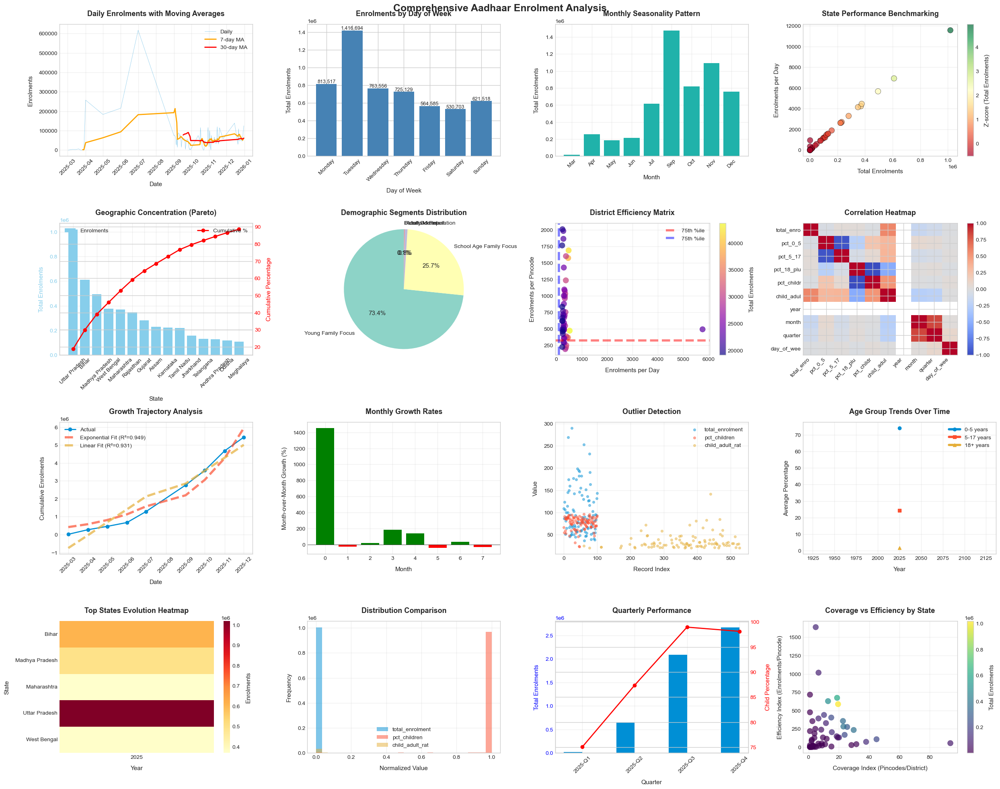

In [105]:
# Create comprehensive visualizations
fig = plt.figure(figsize=(25, 20))
fig.suptitle('Comprehensive Aadhaar Enrolment Analysis', fontsize=18, fontweight='bold')

# Plot 1: Time Series with Moving Averages
ax1 = plt.subplot(4, 4, 1)
ax1.plot(daily_series.index, daily_series['total_enrolments'], 
         alpha=0.5, label='Daily', linewidth=0.5)
ax1.plot(daily_series.index, daily_series['7_day_MA'], 
         label='7-day MA', linewidth=2, color='orange')
ax1.plot(daily_series.index, daily_series['30_day_MA'], 
         label='30-day MA', linewidth=2, color='red')
ax1.set_xlabel('Date')
ax1.set_ylabel('Enrolments')
ax1.set_title('Daily Enrolments with Moving Averages')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.tick_params(axis='x', rotation=45)

# Plot 2: Day of Week Analysis
ax2 = plt.subplot(4, 4, 2)
bars = ax2.bar(dow_analysis['day_name'], dow_analysis['total_enrolments'], 
              color='steelblue')
ax2.set_xlabel('Day of Week')
ax2.set_ylabel('Total Enrolments')
ax2.set_title('Enrolments by Day of Week')
ax2.tick_params(axis='x', rotation=45)
for bar in bars:
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
            f'{height:,.0f}', ha='center', va='bottom', fontsize=9)

# Plot 3: Monthly Seasonality
ax3 = plt.subplot(4, 4, 3)
months = month_seasonality['month_name']
x = np.arange(len(months))
ax3.bar(x, month_seasonality['total_enrolments_sum'], color='lightseagreen')
ax3.set_xlabel('Month')
ax3.set_ylabel('Total Enrolments')
ax3.set_title('Monthly Seasonality Pattern')
ax3.set_xticks(x)
ax3.set_xticklabels(months, rotation=45)
ax3.grid(True, alpha=0.3)

# Plot 4: Performance Benchmarking Scatter
ax4 = plt.subplot(4, 4, 4)
scatter = ax4.scatter(state_performance['total_enrolments'], 
                     state_performance['enrolments_per_day'],
                     c=state_performance['enrolments_zscore'], 
                     cmap='RdYlGn', s=100, alpha=0.7, edgecolors='black')
ax4.set_xlabel('Total Enrolments')
ax4.set_ylabel('Enrolments per Day')
ax4.set_title('State Performance Benchmarking')
ax4.grid(True, alpha=0.3)
plt.colorbar(scatter, ax=ax4, label='Z-score (Total Enrolments)')

# Plot 5: Geographic Concentration (Pareto)
ax5 = plt.subplot(4, 4, 5)
states_plot = state_totals.head(15)
x = np.arange(len(states_plot))
ax5.bar(x, states_plot['total_enrolments'], color='skyblue', label='Enrolments')
ax5.set_xlabel('State')
ax5.set_ylabel('Total Enrolments', color='skyblue')
ax5.set_title('Geographic Concentration (Pareto)')
ax5.set_xticks(x)
ax5.set_xticklabels(states_plot['state'], rotation=45)
ax5.tick_params(axis='y', labelcolor='skyblue')
ax5.grid(True, alpha=0.3)

ax6 = ax5.twinx()
ax6.plot(x, states_plot['cumulative_percentage'], 
        color='red', marker='o', linewidth=2, label='Cumulative %')
ax6.set_ylabel('Cumulative Percentage', color='red')
ax6.tick_params(axis='y', labelcolor='red')
ax5.legend(loc='upper left')
ax6.legend(loc='upper right')

# Plot 6: Demographic Segments
ax7 = plt.subplot(4, 4, 6)
segment_counts = df['demographic_segment'].value_counts()
colors = plt.cm.Set3(np.arange(len(segment_counts)))
ax7.pie(segment_counts.values, labels=segment_counts.index, 
       autopct='%1.1f%%', colors=colors, startangle=90)
ax7.set_title('Demographic Segments Distribution')
ax7.axis('equal')

# Plot 7: Efficiency Matrix
ax8 = plt.subplot(4, 4, 7)
efficiency_sample = efficiency_metrics.nlargest(50, 'total_enrolments')
scatter2 = ax8.scatter(efficiency_sample['enrolments_per_day'], 
                      efficiency_sample['enrolments_per_pincode'],
                      c=efficiency_sample['total_enrolments'], 
                      cmap='plasma', s=100, alpha=0.7)
ax8.axhline(y=efficiency_metrics['enrolments_per_pincode'].quantile(0.75), 
           color='red', linestyle='--', alpha=0.5, label='75th %ile')
ax8.axvline(x=efficiency_metrics['enrolments_per_day'].quantile(0.75), 
           color='blue', linestyle='--', alpha=0.5, label='75th %ile')
ax8.set_xlabel('Enrolments per Day')
ax8.set_ylabel('Enrolments per Pincode')
ax8.set_title('District Efficiency Matrix')
ax8.grid(True, alpha=0.3)
ax8.legend()
plt.colorbar(scatter2, ax=ax8, label='Total Enrolments')

# Plot 8: Correlation Heatmap
ax9 = plt.subplot(4, 4, 8)
corr_plot = ax9.imshow(corr_data, cmap='coolwarm', vmin=-1, vmax=1, aspect='auto')
ax9.set_xticks(range(len(corr_data.columns)))
ax9.set_yticks(range(len(corr_data.columns)))
ax9.set_xticklabels([col[:10] for col in corr_data.columns], rotation=45, ha='right')
ax9.set_yticklabels([col[:10] for col in corr_data.columns])
ax9.set_title('Correlation Heatmap')
plt.colorbar(corr_plot, ax=ax9)

# Plot 9: Growth Trajectory
ax10 = plt.subplot(4, 4, 9)
ax10.plot(monthly_series['period'], monthly_series['cumulative_enrolments'], 
         marker='o', linewidth=2, label='Actual')
try:
    ax10.plot(monthly_series['period'], exp_pred, 
             linestyle='--', label=f'Exponential Fit (R²={exp_r2:.3f})', alpha=0.7)
    ax10.plot(monthly_series['period'], lin_pred, 
             linestyle='--', label=f'Linear Fit (R²={lin_r2:.3f})', alpha=0.7)
except:
    pass
ax10.set_xlabel('Date')
ax10.set_ylabel('Cumulative Enrolments')
ax10.set_title('Growth Trajectory Analysis')
ax10.legend()
ax10.grid(True, alpha=0.3)
ax10.tick_params(axis='x', rotation=45)

# Plot 10: Monthly Growth Rates
ax11 = plt.subplot(4, 4, 10)
growth_data = monthly_series.dropna(subset=['mom_growth'])
bars = ax11.bar(range(len(growth_data)), growth_data['mom_growth'], 
               color=np.where(growth_data['mom_growth'] > 0, 'green', 'red'))
ax11.set_xlabel('Month')
ax11.set_ylabel('Month-over-Month Growth (%)')
ax11.set_title('Monthly Growth Rates')
ax11.axhline(y=0, color='black', linestyle='-', linewidth=0.5)
ax11.grid(True, alpha=0.3)

# Plot 11: Outlier Detection
ax12 = plt.subplot(4, 4, 11)
for metric, color in zip(['total_enrolments', 'pct_children', 'child_adult_ratio_safe'], 
                        ['blue', 'green', 'purple']):
    data = df[metric].dropna()
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = df[(df[metric] < lower_bound) | (df[metric] > upper_bound)]
    ax12.scatter(outliers.index[:100], outliers[metric][:100], 
                alpha=0.5, label=metric[:15], s=20)
ax12.set_xlabel('Record Index')
ax12.set_ylabel('Value')
ax12.set_title('Outlier Detection')
ax12.legend()
ax12.grid(True, alpha=0.3)

# Plot 12: Age Group Trends Over Time
ax13 = plt.subplot(4, 4, 12)
yearly_avg = df.groupby('year').agg({
    'pct_0_5': 'mean',
    'pct_5_17': 'mean',
    'pct_18_plus': 'mean'
}).reset_index()
ax13.plot(yearly_avg['year'], yearly_avg['pct_0_5'], marker='o', label='0-5 years')
ax13.plot(yearly_avg['year'], yearly_avg['pct_5_17'], marker='s', label='5-17 years')
ax13.plot(yearly_avg['year'], yearly_avg['pct_18_plus'], marker='^', label='18+ years')
ax13.set_xlabel('Year')
ax13.set_ylabel('Average Percentage')
ax13.set_title('Age Group Trends Over Time')
ax13.legend()
ax13.grid(True, alpha=0.3)

# Plot 13: State Ranking Evolution
ax14 = plt.subplot(4, 4, 13)
top_states_yearly = pd.DataFrame()
for year in sorted(df['year'].unique()):
    yearly_state = df[df['year'] == year].groupby('state')['total_enrolments'].sum()
    top_year = yearly_state.nlargest(5).reset_index()
    top_year['year'] = year
    top_states_yearly = pd.concat([top_states_yearly, top_year])

# Pivot for heatmap
heatmap_data = top_states_yearly.pivot(index='state', columns='year', values='total_enrolments')
heatmap_data = heatmap_data.fillna(0)
sns.heatmap(heatmap_data, cmap='YlOrRd', ax=ax14, cbar_kws={'label': 'Enrolments'})
ax14.set_xlabel('Year')
ax14.set_ylabel('State')
ax14.set_title('Top States Evolution Heatmap')
ax14.tick_params(axis='x', rotation=0)

# Plot 14: Distribution Analysis
ax15 = plt.subplot(4, 4, 14)
metrics_to_plot = ['total_enrolments', 'pct_children', 'child_adult_ratio_safe']
for i, metric in enumerate(metrics_to_plot):
    data = df[metric].dropna()
    if len(data) > 0:
        # Normalize for comparison
        normalized = (data - data.min()) / (data.max() - data.min())
        ax15.hist(normalized, bins=30, alpha=0.5, label=metric[:15])
ax15.set_xlabel('Normalized Value')
ax15.set_ylabel('Frequency')
ax15.set_title('Distribution Comparison')
ax15.legend()
ax15.grid(True, alpha=0.3)

# Plot 15: Quarterly Performance
ax16 = plt.subplot(4, 4, 15)
quarterly_perf = df.groupby(['year', 'quarter']).agg({
    'total_enrolments': 'sum',
    'pct_children': 'mean'
}).reset_index()
quarterly_perf['period'] = quarterly_perf['year'].astype(str) + '-Q' + quarterly_perf['quarter'].astype(str)
x = np.arange(len(quarterly_perf))
width = 0.35
bars1 = ax16.bar(x - width/2, quarterly_perf['total_enrolments'], width, label='Enrolments')
ax16.set_xlabel('Quarter')
ax16.set_ylabel('Total Enrolments', color='blue')
ax16.set_title('Quarterly Performance')
ax16.set_xticks(x)
ax16.set_xticklabels(quarterly_perf['period'], rotation=45)
ax16.tick_params(axis='y', labelcolor='blue')
ax16.grid(True, alpha=0.3)

ax16_2 = ax16.twinx()
ax16_2.plot(x, quarterly_perf['pct_children'], color='red', marker='o', linewidth=2, label='Child %')
ax16_2.set_ylabel('Child Percentage', color='red')
ax16_2.tick_params(axis='y', labelcolor='red')

# Plot 16: Efficiency vs Coverage
ax17 = plt.subplot(4, 4, 16)
state_coverage = df.groupby('state').agg({
    'district': 'nunique',
    'pincode': 'nunique',
    'total_enrolments': 'sum'
}).reset_index()
state_coverage['coverage_index'] = state_coverage['pincode'] / state_coverage['district']
state_coverage['efficiency_index'] = state_coverage['total_enrolments'] / state_coverage['pincode']

scatter3 = ax17.scatter(state_coverage['coverage_index'], 
                       state_coverage['efficiency_index'],
                       c=state_coverage['total_enrolments'], 
                       cmap='viridis', s=100, alpha=0.7)
ax17.set_xlabel('Coverage Index (Pincodes/District)')
ax17.set_ylabel('Efficiency Index (Enrolments/Pincode)')
ax17.set_title('Coverage vs Efficiency by State')
ax17.grid(True, alpha=0.3)
plt.colorbar(scatter3, ax=ax17, label='Total Enrolments')

plt.tight_layout()
plt.show()

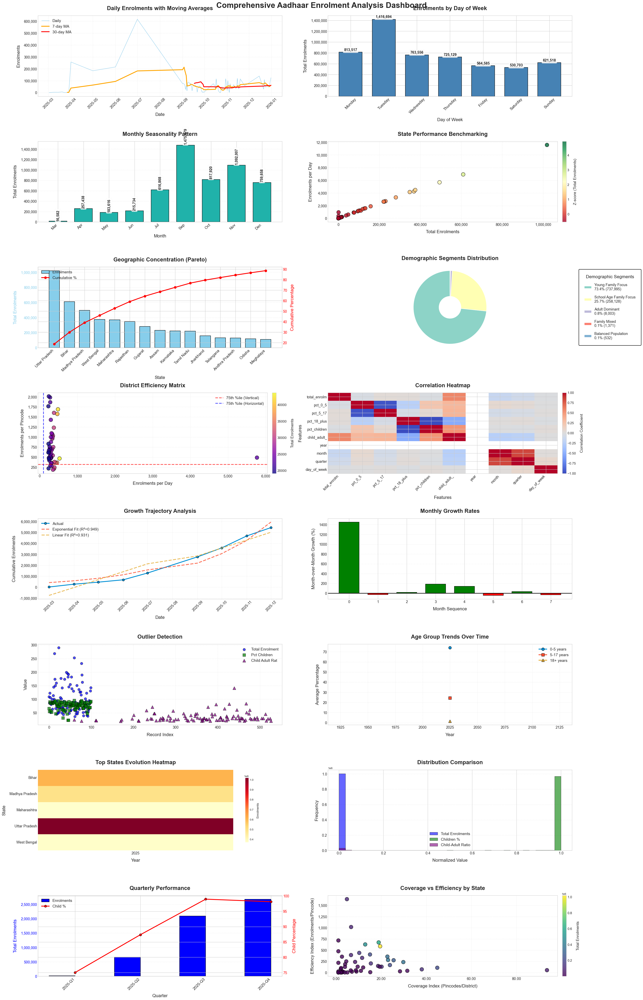

In [108]:
# Create comprehensive visualizations with enhanced readability
fig = plt.figure(figsize=(32, 50))
fig.suptitle('Comprehensive Aadhaar Enrolment Analysis Dashboard', 
             fontsize=28, fontweight='bold', y=0.99)

# Adjust subplot spacing for 2-column layout with 8 rows (8x2=16 positions)
plt.subplots_adjust(wspace=0.35, hspace=0.45, top=0.96, bottom=0.04, left=0.08, right=0.95)

# Plot 1: Time Series with Moving Averages
ax1 = plt.subplot(8, 2, 1)
ax1.plot(daily_series.index, daily_series['total_enrolments'], 
         alpha=0.5, label='Daily', linewidth=1)
ax1.plot(daily_series.index, daily_series['7_day_MA'], 
         label='7-day MA', linewidth=3, color='orange')
ax1.plot(daily_series.index, daily_series['30_day_MA'], 
         label='30-day MA', linewidth=3, color='red')
ax1.set_xlabel('Date', fontsize=16, labelpad=12)
ax1.set_ylabel('Enrolments', fontsize=16, labelpad=12)
ax1.set_title('Daily Enrolments with Moving Averages', fontsize=20, fontweight='bold', pad=20)
ax1.legend(fontsize=14, loc='upper left', framealpha=0.9)
ax1.grid(True, alpha=0.3, linestyle='--')
ax1.tick_params(axis='x', rotation=45, labelsize=13)
ax1.tick_params(axis='y', labelsize=13)
ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))

# Plot 2: Day of Week Analysis
ax2 = plt.subplot(8, 2, 2)
bars = ax2.bar(dow_analysis['day_name'], dow_analysis['total_enrolments'], 
              color='steelblue', width=0.7, edgecolor='black', linewidth=1.2)
ax2.set_xlabel('Day of Week', fontsize=16, labelpad=12)
ax2.set_ylabel('Total Enrolments', fontsize=16, labelpad=12)
ax2.set_title('Enrolments by Day of Week', fontsize=20, fontweight='bold', pad=20)
ax2.tick_params(axis='x', rotation=45, labelsize=14)
ax2.tick_params(axis='y', labelsize=13)
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))

for bar in bars:
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + height*0.01,
            f'{height:,.0f}', ha='center', va='bottom', fontsize=13, 
            fontweight='bold', bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

# Plot 3: Monthly Seasonality
ax3 = plt.subplot(8, 2, 3)
months = month_seasonality['month_name']
x = np.arange(len(months))
bars3 = ax3.bar(x, month_seasonality['total_enrolments_sum'], 
                color='lightseagreen', width=0.7, edgecolor='black', linewidth=1.2)
ax3.set_xlabel('Month', fontsize=16, labelpad=12)
ax3.set_ylabel('Total Enrolments', fontsize=16, labelpad=12)
ax3.set_title('Monthly Seasonality Pattern', fontsize=20, fontweight='bold', pad=20)
ax3.set_xticks(x)
ax3.set_xticklabels(months, rotation=45, fontsize=14, ha='right')
ax3.tick_params(axis='y', labelsize=13)
ax3.grid(True, alpha=0.3, linestyle='--', axis='y')
ax3.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))

for bar in bars3:
    height = bar.get_height()
    ax3.text(bar.get_x() + bar.get_width()/2., height + height*0.01,
            f'{height:,.0f}', ha='center', va='bottom', fontsize=13, 
            fontweight='bold', rotation=90, 
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

# Plot 4: Performance Benchmarking Scatter
ax4 = plt.subplot(8, 2, 4)
scatter = ax4.scatter(state_performance['total_enrolments'], 
                     state_performance['enrolments_per_day'],
                     c=state_performance['enrolments_zscore'], 
                     cmap='RdYlGn', s=180, alpha=0.8, edgecolors='black', linewidth=1.2)
ax4.set_xlabel('Total Enrolments', fontsize=16, labelpad=12)
ax4.set_ylabel('Enrolments per Day', fontsize=16, labelpad=12)
ax4.set_title('State Performance Benchmarking', fontsize=20, fontweight='bold', pad=20)
ax4.grid(True, alpha=0.3, linestyle='--')
ax4.tick_params(axis='both', labelsize=13)
ax4.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))
ax4.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))

cbar4 = plt.colorbar(scatter, ax=ax4, fraction=0.04, pad=0.02)
cbar4.set_label('Z-score (Total Enrolments)', fontsize=14, labelpad=15)
cbar4.ax.tick_params(labelsize=12)

# Plot 5: Geographic Concentration (Pareto)
ax5 = plt.subplot(8, 2, 5)
states_plot = state_totals.head(15)
x = np.arange(len(states_plot))
bars5 = ax5.bar(x, states_plot['total_enrolments'], color='skyblue', 
                width=0.7, edgecolor='black', linewidth=1.2, label='Enrolments')
ax5.set_xlabel('State', fontsize=16, labelpad=12)
ax5.set_ylabel('Total Enrolments', color='skyblue', fontsize=16, labelpad=12)
ax5.set_title('Geographic Concentration (Pareto)', fontsize=20, fontweight='bold', pad=20)
ax5.set_xticks(x)
ax5.set_xticklabels(states_plot['state'], rotation=45, fontsize=14, ha='right')
ax5.tick_params(axis='y', labelcolor='skyblue', labelsize=13)
ax5.tick_params(axis='x', labelsize=14)
ax5.grid(True, alpha=0.3, linestyle='--', axis='y')
ax5.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))

ax6 = ax5.twinx()
ax6.plot(x, states_plot['cumulative_percentage'], 
        color='red', marker='o', linewidth=3, markersize=8, label='Cumulative %')
ax6.set_ylabel('Cumulative Percentage', color='red', fontsize=16, labelpad=12)
ax6.tick_params(axis='y', labelcolor='red', labelsize=13)

lines5, labels5 = ax5.get_legend_handles_labels()
lines6, labels6 = ax6.get_legend_handles_labels()
ax5.legend(lines5 + lines6, labels5 + labels6, fontsize=14, 
           loc='upper left', framealpha=0.9)

# Plot 6: Demographic Segments (ENHANCED PIE CHART)
ax7 = plt.subplot(8, 2, 6)
segment_counts = df['demographic_segment'].value_counts()
colors = plt.cm.Set3(np.arange(len(segment_counts)))

# Create pie chart without labels on wedges
wedges, texts = ax7.pie(segment_counts.values, 
                       colors=colors, 
                       startangle=90,
                       wedgeprops={'edgecolor': 'white', 'linewidth': 1.5, 'width': 0.7})

ax7.set_title('Demographic Segments Distribution', fontsize=20, fontweight='bold', pad=25)
ax7.axis('equal')

# Create comprehensive legend with percentages and counts
legend_labels = []
for i, (segment, count) in enumerate(segment_counts.items()):
    percentage = 100 * count / segment_counts.values.sum()
    legend_labels.append(f'{segment}\n{percentage:.1f}% ({count:,})')

# Add legend with improved positioning and styling
legend = ax7.legend(wedges, legend_labels, 
                   title="Demographic Segments",
                   title_fontsize=16,
                   fontsize=13,
                   loc="center left",
                   bbox_to_anchor=(1.02, 0.5),
                   frameon=True,
                   framealpha=0.95,
                   edgecolor='black',
                   borderpad=1.5,
                   labelspacing=1.2)
legend.get_frame().set_linewidth(1.5)

# Plot 7: Efficiency Matrix
ax8 = plt.subplot(8, 2, 7)
efficiency_sample = efficiency_metrics.nlargest(50, 'total_enrolments')
scatter2 = ax8.scatter(efficiency_sample['enrolments_per_day'], 
                      efficiency_sample['enrolments_per_pincode'],
                      c=efficiency_sample['total_enrolments'], 
                      cmap='plasma', s=180, alpha=0.8, edgecolors='black', linewidth=1.2)
ax8.axhline(y=efficiency_metrics['enrolments_per_pincode'].quantile(0.75), 
           color='red', linestyle='--', alpha=0.7, linewidth=2.5, label='75th %ile (Vertical)')
ax8.axvline(x=efficiency_metrics['enrolments_per_day'].quantile(0.75), 
           color='blue', linestyle='--', alpha=0.7, linewidth=2.5, label='75th %ile (Horizontal)')
ax8.set_xlabel('Enrolments per Day', fontsize=16, labelpad=12)
ax8.set_ylabel('Enrolments per Pincode', fontsize=16, labelpad=12)
ax8.set_title('District Efficiency Matrix', fontsize=20, fontweight='bold', pad=20)
ax8.grid(True, alpha=0.3, linestyle='--')
ax8.tick_params(axis='both', labelsize=13)
ax8.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))
ax8.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))
ax8.legend(fontsize=14, framealpha=0.9)

cbar8 = plt.colorbar(scatter2, ax=ax8, fraction=0.04, pad=0.02)
cbar8.set_label('Total Enrolments', fontsize=14, labelpad=15)
cbar8.ax.tick_params(labelsize=12)

# Plot 8: Correlation Heatmap
ax9 = plt.subplot(8, 2, 8)
corr_plot = ax9.imshow(corr_data, cmap='coolwarm', vmin=-1, vmax=1, aspect='auto')
ax9.set_xticks(range(len(corr_data.columns)))
ax9.set_yticks(range(len(corr_data.columns)))
ax9.set_xticklabels([col[:12] for col in corr_data.columns], rotation=45, 
                   fontsize=13, ha='right')
ax9.set_yticklabels([col[:12] for col in corr_data.columns], fontsize=13)
ax9.set_title('Correlation Heatmap', fontsize=20, fontweight='bold', pad=20)
ax9.set_xlabel('Features', fontsize=16, labelpad=12)
ax9.set_ylabel('Features', fontsize=16, labelpad=12)

cbar9 = plt.colorbar(corr_plot, ax=ax9, fraction=0.04, pad=0.02)
cbar9.set_label('Correlation Coefficient', fontsize=14, labelpad=15)
cbar9.ax.tick_params(labelsize=12)

# Plot 9: Growth Trajectory
ax10 = plt.subplot(8, 2, 9)
ax10.plot(monthly_series['period'], monthly_series['cumulative_enrolments'], 
         marker='o', linewidth=3, markersize=8, markeredgecolor='black', 
         markeredgewidth=1, label='Actual')
try:
    ax10.plot(monthly_series['period'], exp_pred, 
             linestyle='--', linewidth=3, label=f'Exponential Fit (R²={exp_r2:.3f})', 
             alpha=0.8)
    ax10.plot(monthly_series['period'], lin_pred, 
             linestyle='--', linewidth=3, label=f'Linear Fit (R²={lin_r2:.3f})', 
             alpha=0.8)
except:
    pass
ax10.set_xlabel('Date', fontsize=16, labelpad=12)
ax10.set_ylabel('Cumulative Enrolments', fontsize=16, labelpad=12)
ax10.set_title('Growth Trajectory Analysis', fontsize=20, fontweight='bold', pad=20)
ax10.legend(fontsize=14, framealpha=0.9)
ax10.grid(True, alpha=0.3, linestyle='--')
ax10.tick_params(axis='both', labelsize=13)
ax10.tick_params(axis='x', rotation=45)
ax10.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))

# Plot 10: Monthly Growth Rates
ax11 = plt.subplot(8, 2, 10)
growth_data = monthly_series.dropna(subset=['mom_growth'])
x_pos = np.arange(len(growth_data))
bars11 = ax11.bar(x_pos, growth_data['mom_growth'], 
                 color=np.where(growth_data['mom_growth'] > 0, 'green', 'red'),
                 width=0.7, edgecolor='black', linewidth=1.2)
ax11.set_xlabel('Month Sequence', fontsize=16, labelpad=12)
ax11.set_ylabel('Month-over-Month Growth (%)', fontsize=16, labelpad=12)
ax11.set_title('Monthly Growth Rates', fontsize=20, fontweight='bold', pad=20)
ax11.axhline(y=0, color='black', linestyle='-', linewidth=2)
ax11.grid(True, alpha=0.3, linestyle='--', axis='y')
ax11.tick_params(axis='both', labelsize=13)

# Plot 11: Outlier Detection
ax12 = plt.subplot(8, 2, 11)
markers = ['o', 's', '^']
sizes = [80, 100, 120]

for i, (metric, color) in enumerate(zip(['total_enrolments', 'pct_children', 'child_adult_ratio_safe'], 
                                        ['blue', 'green', 'purple'])):
    data = df[metric].dropna()
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = df[(df[metric] < lower_bound) | (df[metric] > upper_bound)]
    ax12.scatter(outliers.index[:100], outliers[metric][:100], 
                alpha=0.7, label=metric[:15].replace('_', ' ').title(), 
                s=sizes[i], color=color, marker=markers[i], edgecolor='black', linewidth=1)

ax12.set_xlabel('Record Index', fontsize=16, labelpad=12)
ax12.set_ylabel('Value', fontsize=16, labelpad=12)
ax12.set_title('Outlier Detection', fontsize=20, fontweight='bold', pad=20)
ax12.legend(fontsize=14, framealpha=0.9)
ax12.grid(True, alpha=0.3, linestyle='--')
ax12.tick_params(axis='both', labelsize=13)

# Plot 12: Age Group Trends Over Time
ax13 = plt.subplot(8, 2, 12)
yearly_avg = df.groupby('year').agg({
    'pct_0_5': 'mean',
    'pct_5_17': 'mean',
    'pct_18_plus': 'mean'
}).reset_index()
ax13.plot(yearly_avg['year'], yearly_avg['pct_0_5'], marker='o', 
         linewidth=3, markersize=10, markeredgecolor='black', markeredgewidth=1, 
         label='0-5 years')
ax13.plot(yearly_avg['year'], yearly_avg['pct_5_17'], marker='s', 
         linewidth=3, markersize=10, markeredgecolor='black', markeredgewidth=1, 
         label='5-17 years')
ax13.plot(yearly_avg['year'], yearly_avg['pct_18_plus'], marker='^', 
         linewidth=3, markersize=10, markeredgecolor='black', markeredgewidth=1, 
         label='18+ years')
ax13.set_xlabel('Year', fontsize=16, labelpad=12)
ax13.set_ylabel('Average Percentage', fontsize=16, labelpad=12)
ax13.set_title('Age Group Trends Over Time', fontsize=20, fontweight='bold', pad=20)
ax13.legend(fontsize=14, framealpha=0.9)
ax13.grid(True, alpha=0.3, linestyle='--')
ax13.tick_params(axis='both', labelsize=13)

# Plot 13: State Ranking Evolution
ax14 = plt.subplot(8, 2, 13)
top_states_yearly = pd.DataFrame()
for year in sorted(df['year'].unique()):
    yearly_state = df[df['year'] == year].groupby('state')['total_enrolments'].sum()
    top_year = yearly_state.nlargest(5).reset_index()
    top_year['year'] = year
    top_states_yearly = pd.concat([top_states_yearly, top_year])

# Pivot for heatmap
heatmap_data = top_states_yearly.pivot(index='state', columns='year', values='total_enrolments')
heatmap_data = heatmap_data.fillna(0)
sns.heatmap(heatmap_data, cmap='YlOrRd', ax=ax14, 
           cbar_kws={'label': 'Enrolments', 'shrink': 0.8})
ax14.set_xlabel('Year', fontsize=16, labelpad=12)
ax14.set_ylabel('State', fontsize=16, labelpad=12)
ax14.set_title('Top States Evolution Heatmap', fontsize=20, fontweight='bold', pad=20)
ax14.tick_params(axis='x', rotation=0, labelsize=13)
ax14.tick_params(axis='y', labelsize=13)

# Plot 14: Distribution Analysis
ax15 = plt.subplot(8, 2, 14)
metrics_to_plot = ['total_enrolments', 'pct_children', 'child_adult_ratio_safe']
colors_dist = ['blue', 'green', 'purple']
labels_dist = ['Total Enrolments', 'Children %', 'Child-Adult Ratio']

for i, (metric, color, label) in enumerate(zip(metrics_to_plot, colors_dist, labels_dist)):
    data = df[metric].dropna()
    if len(data) > 0:
        normalized = (data - data.min()) / (data.max() - data.min())
        ax15.hist(normalized, bins=35, alpha=0.6, label=label, 
                 color=color, edgecolor='black', linewidth=1)

ax15.set_xlabel('Normalized Value', fontsize=16, labelpad=12)
ax15.set_ylabel('Frequency', fontsize=16, labelpad=12)
ax15.set_title('Distribution Comparison', fontsize=20, fontweight='bold', pad=20)
ax15.legend(fontsize=14, framealpha=0.9)
ax15.grid(True, alpha=0.3, linestyle='--', axis='y')
ax15.tick_params(axis='both', labelsize=13)

# Plot 15: Quarterly Performance
ax16 = plt.subplot(8, 2, 15)
quarterly_perf = df.groupby(['year', 'quarter']).agg({
    'total_enrolments': 'sum',
    'pct_children': 'mean'
}).reset_index()
quarterly_perf['period'] = quarterly_perf['year'].astype(str) + '-Q' + quarterly_perf['quarter'].astype(str)
x = np.arange(len(quarterly_perf))
width = 0.4

bars16 = ax16.bar(x - width/2, quarterly_perf['total_enrolments'], width, 
                 label='Enrolments', color='blue', edgecolor='black', linewidth=1.2)
ax16.set_xlabel('Quarter', fontsize=16, labelpad=12)
ax16.set_ylabel('Total Enrolments', color='blue', fontsize=16, labelpad=12)
ax16.set_title('Quarterly Performance', fontsize=20, fontweight='bold', pad=20)
ax16.set_xticks(x)
ax16.set_xticklabels(quarterly_perf['period'], rotation=45, fontsize=14, ha='right')
ax16.tick_params(axis='y', labelcolor='blue', labelsize=13)
ax16.tick_params(axis='x', labelsize=14)
ax16.grid(True, alpha=0.3, linestyle='--', axis='y')
ax16.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))

ax16_2 = ax16.twinx()
ax16_2.plot(x, quarterly_perf['pct_children'], color='red', 
           marker='o', linewidth=3, markersize=8, 
           markeredgecolor='black', markeredgewidth=1, 
           label='Child %')
ax16_2.set_ylabel('Child Percentage', color='red', fontsize=16, labelpad=12)
ax16_2.tick_params(axis='y', labelcolor='red', labelsize=13)

lines16, labels16 = ax16.get_legend_handles_labels()
lines16_2, labels16_2 = ax16_2.get_legend_handles_labels()
ax16.legend(lines16 + lines16_2, labels16 + labels16_2, 
           fontsize=14, loc='upper left', framealpha=0.9)

# Plot 16: Efficiency vs Coverage
ax17 = plt.subplot(8, 2, 16)
state_coverage = df.groupby('state').agg({
    'district': 'nunique',
    'pincode': 'nunique',
    'total_enrolments': 'sum'
}).reset_index()
state_coverage['coverage_index'] = state_coverage['pincode'] / state_coverage['district']
state_coverage['efficiency_index'] = state_coverage['total_enrolments'] / state_coverage['pincode']

scatter3 = ax17.scatter(state_coverage['coverage_index'], 
                       state_coverage['efficiency_index'],
                       c=state_coverage['total_enrolments'], 
                       cmap='viridis', s=180, alpha=0.8, 
                       edgecolors='black', linewidth=1.2)
ax17.set_xlabel('Coverage Index (Pincodes/District)', fontsize=16, labelpad=12)
ax17.set_ylabel('Efficiency Index (Enrolments/Pincode)', fontsize=16, labelpad=12)
ax17.set_title('Coverage vs Efficiency by State', fontsize=20, fontweight='bold', pad=20)
ax17.grid(True, alpha=0.3, linestyle='--')
ax17.tick_params(axis='both', labelsize=13)
ax17.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.2f}'))
ax17.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))

cbar17 = plt.colorbar(scatter3, ax=ax17, fraction=0.04, pad=0.02)
cbar17.set_label('Total Enrolments', fontsize=14, labelpad=15)
cbar17.ax.tick_params(labelsize=12)

plt.tight_layout()
plt.show()

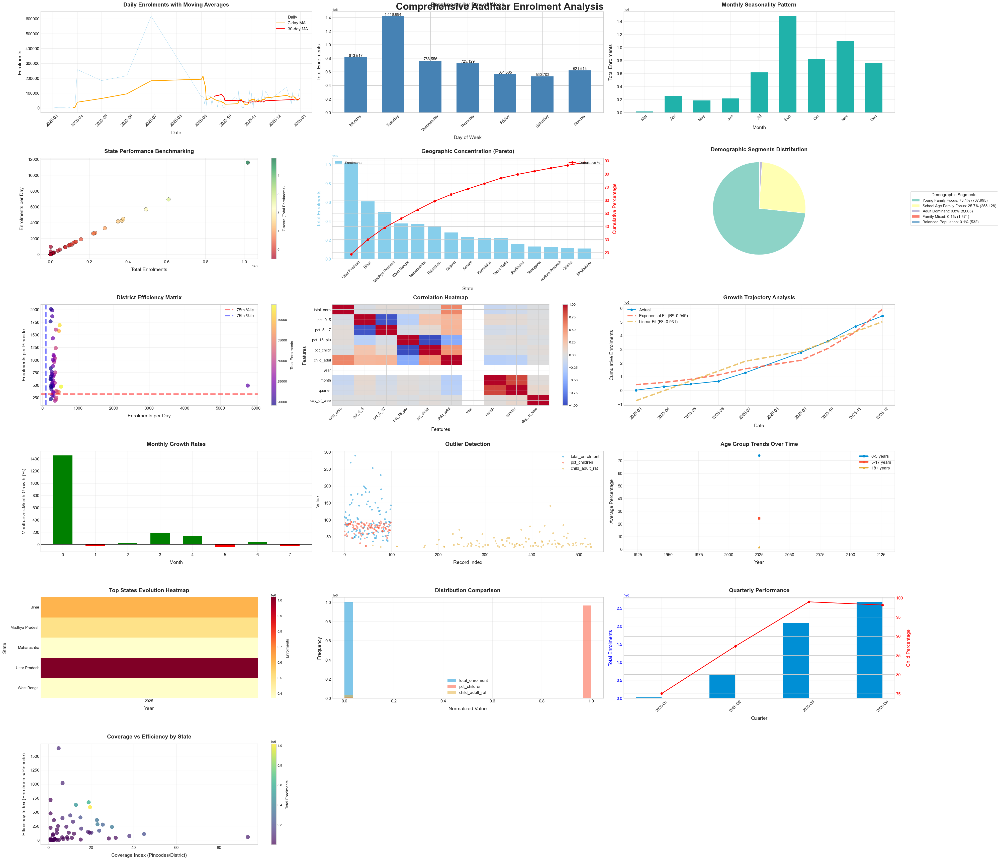

In [107]:
# Create comprehensive visualizations
fig = plt.figure(figsize=(40, 35))
fig.suptitle('Comprehensive Aadhaar Enrolment Analysis', fontsize=28, fontweight='bold', y=0.98)

# Adjust subplot spacing for 3-column layout with 6 rows (since 16 plots, 6x3=18 positions)
plt.subplots_adjust(wspace=0.3, hspace=0.4, top=0.94, bottom=0.06, left=0.06, right=0.98)

# Plot 1: Time Series with Moving Averages
ax1 = plt.subplot(6, 3, 1)
ax1.plot(daily_series.index, daily_series['total_enrolments'], 
         alpha=0.5, label='Daily', linewidth=0.5)
ax1.plot(daily_series.index, daily_series['7_day_MA'], 
         label='7-day MA', linewidth=2, color='orange')
ax1.plot(daily_series.index, daily_series['30_day_MA'], 
         label='30-day MA', linewidth=2, color='red')
ax1.set_xlabel('Date', fontsize=14)
ax1.set_ylabel('Enrolments', fontsize=14)
ax1.set_title('Daily Enrolments with Moving Averages', fontsize=16, fontweight='bold')
ax1.legend(fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.tick_params(axis='x', rotation=45)
ax1.tick_params(axis='both', labelsize=12)

# Plot 2: Day of Week Analysis
ax2 = plt.subplot(6, 3, 2)
bars = ax2.bar(dow_analysis['day_name'], dow_analysis['total_enrolments'], 
              color='steelblue', width=0.6)
ax2.set_xlabel('Day of Week', fontsize=14)
ax2.set_ylabel('Total Enrolments', fontsize=14)
ax2.set_title('Enrolments by Day of Week', fontsize=16, fontweight='bold')
ax2.tick_params(axis='x', rotation=45)
ax2.tick_params(axis='both', labelsize=12)
for bar in bars:
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
            f'{height:,.0f}', ha='center', va='bottom', fontsize=11)

# Plot 3: Monthly Seasonality
ax3 = plt.subplot(6, 3, 3)
months = month_seasonality['month_name']
x = np.arange(len(months))
ax3.bar(x, month_seasonality['total_enrolments_sum'], color='lightseagreen', width=0.6)
ax3.set_xlabel('Month', fontsize=14)
ax3.set_ylabel('Total Enrolments', fontsize=14)
ax3.set_title('Monthly Seasonality Pattern', fontsize=16, fontweight='bold')
ax3.set_xticks(x)
ax3.set_xticklabels(months, rotation=45, fontsize=12)
ax3.tick_params(axis='y', labelsize=12)
ax3.grid(True, alpha=0.3)

# Plot 4: Performance Benchmarking Scatter
ax4 = plt.subplot(6, 3, 4)
scatter = ax4.scatter(state_performance['total_enrolments'], 
                     state_performance['enrolments_per_day'],
                     c=state_performance['enrolments_zscore'], 
                     cmap='RdYlGn', s=120, alpha=0.7, edgecolors='black')
ax4.set_xlabel('Total Enrolments', fontsize=14)
ax4.set_ylabel('Enrolments per Day', fontsize=14)
ax4.set_title('State Performance Benchmarking', fontsize=16, fontweight='bold')
ax4.grid(True, alpha=0.3)
ax4.tick_params(axis='both', labelsize=12)
plt.colorbar(scatter, ax=ax4, label='Z-score (Total Enrolments)')

# Plot 5: Geographic Concentration (Pareto)
ax5 = plt.subplot(6, 3, 5)
states_plot = state_totals.head(15)
x = np.arange(len(states_plot))
ax5.bar(x, states_plot['total_enrolments'], color='skyblue', label='Enrolments')
ax5.set_xlabel('State', fontsize=14)
ax5.set_ylabel('Total Enrolments', color='skyblue', fontsize=14)
ax5.set_title('Geographic Concentration (Pareto)', fontsize=16, fontweight='bold')
ax5.set_xticks(x)
ax5.set_xticklabels(states_plot['state'], rotation=45, fontsize=11)
ax5.tick_params(axis='y', labelcolor='skyblue', labelsize=12)
ax5.grid(True, alpha=0.3)

ax6 = ax5.twinx()
ax6.plot(x, states_plot['cumulative_percentage'], 
        color='red', marker='o', linewidth=2, label='Cumulative %')
ax6.set_ylabel('Cumulative Percentage', color='red', fontsize=14)
ax6.tick_params(axis='y', labelcolor='red', labelsize=12)
ax5.legend(loc='upper left')
ax6.legend(loc='upper right')

# Plot 6: Demographic Segments
ax7 = plt.subplot(6, 3, 6)
segment_counts = df['demographic_segment'].value_counts()
colors = plt.cm.Set3(np.arange(len(segment_counts)))

# Create pie chart without percentage labels on wedges
wedges, texts = ax7.pie(segment_counts.values, 
                       colors=colors, 
                       startangle=90,
                       wedgeprops={'edgecolor': 'white', 'linewidth': 1})

ax7.set_title('Demographic Segments Distribution', fontsize=16, fontweight='bold', pad=20)
ax7.axis('equal')

# Create legend with percentages and counts
legend_labels = []
for i, (segment, count) in enumerate(segment_counts.items()):
    percentage = 100 * count / segment_counts.values.sum()
    legend_labels.append(f'{segment}: {percentage:.1f}% ({count:,})')

# Add legend outside the pie chart
ax7.legend(wedges, legend_labels, 
          title="Demographic Segments",
          title_fontsize=12,
          fontsize=11,
          loc="center left",
          bbox_to_anchor=(1.05, 0.5),
          frameon=True,
          framealpha=0.9)

# Plot 7: Efficiency Matrix
ax8 = plt.subplot(6, 3, 7)
efficiency_sample = efficiency_metrics.nlargest(50, 'total_enrolments')
scatter2 = ax8.scatter(efficiency_sample['enrolments_per_day'], 
                      efficiency_sample['enrolments_per_pincode'],
                      c=efficiency_sample['total_enrolments'], 
                      cmap='plasma', s=120, alpha=0.7)
ax8.axhline(y=efficiency_metrics['enrolments_per_pincode'].quantile(0.75), 
           color='red', linestyle='--', alpha=0.5, label='75th %ile')
ax8.axvline(x=efficiency_metrics['enrolments_per_day'].quantile(0.75), 
           color='blue', linestyle='--', alpha=0.5, label='75th %ile')
ax8.set_xlabel('Enrolments per Day', fontsize=14)
ax8.set_ylabel('Enrolments per Pincode', fontsize=14)
ax8.set_title('District Efficiency Matrix', fontsize=16, fontweight='bold')
ax8.grid(True, alpha=0.3)
ax8.legend(fontsize=12)
ax8.tick_params(axis='both', labelsize=12)
plt.colorbar(scatter2, ax=ax8, label='Total Enrolments')

# Plot 8: Correlation Heatmap
ax9 = plt.subplot(6, 3, 8)
corr_plot = ax9.imshow(corr_data, cmap='coolwarm', vmin=-1, vmax=1, aspect='auto')
ax9.set_xticks(range(len(corr_data.columns)))
ax9.set_yticks(range(len(corr_data.columns)))
ax9.set_xticklabels([col[:10] for col in corr_data.columns], rotation=45, ha='right', fontsize=11)
ax9.set_yticklabels([col[:10] for col in corr_data.columns], fontsize=11)
ax9.set_title('Correlation Heatmap', fontsize=16, fontweight='bold')
ax9.set_xlabel('Features', fontsize=14)
ax9.set_ylabel('Features', fontsize=14)
plt.colorbar(corr_plot, ax=ax9)

# Plot 9: Growth Trajectory
ax10 = plt.subplot(6, 3, 9)
ax10.plot(monthly_series['period'], monthly_series['cumulative_enrolments'], 
         marker='o', linewidth=2, label='Actual')
try:
    ax10.plot(monthly_series['period'], exp_pred, 
             linestyle='--', label=f'Exponential Fit (R²={exp_r2:.3f})', alpha=0.7)
    ax10.plot(monthly_series['period'], lin_pred, 
             linestyle='--', label=f'Linear Fit (R²={lin_r2:.3f})', alpha=0.7)
except:
    pass
ax10.set_xlabel('Date', fontsize=14)
ax10.set_ylabel('Cumulative Enrolments', fontsize=14)
ax10.set_title('Growth Trajectory Analysis', fontsize=16, fontweight='bold')
ax10.legend(fontsize=12)
ax10.grid(True, alpha=0.3)
ax10.tick_params(axis='both', labelsize=12)
ax10.tick_params(axis='x', rotation=45)

# Plot 10: Monthly Growth Rates
ax11 = plt.subplot(6, 3, 10)
growth_data = monthly_series.dropna(subset=['mom_growth'])
bars = ax11.bar(range(len(growth_data)), growth_data['mom_growth'], 
               color=np.where(growth_data['mom_growth'] > 0, 'green', 'red'),
               width=0.6)
ax11.set_xlabel('Month', fontsize=14)
ax11.set_ylabel('Month-over-Month Growth (%)', fontsize=14)
ax11.set_title('Monthly Growth Rates', fontsize=16, fontweight='bold')
ax11.axhline(y=0, color='black', linestyle='-', linewidth=0.5)
ax11.grid(True, alpha=0.3)
ax11.tick_params(axis='both', labelsize=12)

# Plot 11: Outlier Detection
ax12 = plt.subplot(6, 3, 11)
for metric, color in zip(['total_enrolments', 'pct_children', 'child_adult_ratio_safe'], 
                        ['blue', 'green', 'purple']):
    data = df[metric].dropna()
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = df[(df[metric] < lower_bound) | (df[metric] > upper_bound)]
    ax12.scatter(outliers.index[:100], outliers[metric][:100], 
                alpha=0.5, label=metric[:15], s=20)
ax12.set_xlabel('Record Index', fontsize=14)
ax12.set_ylabel('Value', fontsize=14)
ax12.set_title('Outlier Detection', fontsize=16, fontweight='bold')
ax12.legend(fontsize=12)
ax12.grid(True, alpha=0.3)
ax12.tick_params(axis='both', labelsize=12)

# Plot 12: Age Group Trends Over Time
ax13 = plt.subplot(6, 3, 12)
yearly_avg = df.groupby('year').agg({
    'pct_0_5': 'mean',
    'pct_5_17': 'mean',
    'pct_18_plus': 'mean'
}).reset_index()
ax13.plot(yearly_avg['year'], yearly_avg['pct_0_5'], marker='o', label='0-5 years')
ax13.plot(yearly_avg['year'], yearly_avg['pct_5_17'], marker='s', label='5-17 years')
ax13.plot(yearly_avg['year'], yearly_avg['pct_18_plus'], marker='^', label='18+ years')
ax13.set_xlabel('Year', fontsize=14)
ax13.set_ylabel('Average Percentage', fontsize=14)
ax13.set_title('Age Group Trends Over Time', fontsize=16, fontweight='bold')
ax13.legend(fontsize=12)
ax13.grid(True, alpha=0.3)
ax13.tick_params(axis='both', labelsize=12)

# Plot 13: State Ranking Evolution
ax14 = plt.subplot(6, 3, 13)
top_states_yearly = pd.DataFrame()
for year in sorted(df['year'].unique()):
    yearly_state = df[df['year'] == year].groupby('state')['total_enrolments'].sum()
    top_year = yearly_state.nlargest(5).reset_index()
    top_year['year'] = year
    top_states_yearly = pd.concat([top_states_yearly, top_year])

# Pivot for heatmap
heatmap_data = top_states_yearly.pivot(index='state', columns='year', values='total_enrolments')
heatmap_data = heatmap_data.fillna(0)
sns.heatmap(heatmap_data, cmap='YlOrRd', ax=ax14, cbar_kws={'label': 'Enrolments'})
ax14.set_xlabel('Year', fontsize=14)
ax14.set_ylabel('State', fontsize=14)
ax14.set_title('Top States Evolution Heatmap', fontsize=16, fontweight='bold')
ax14.tick_params(axis='x', rotation=0)
ax14.tick_params(axis='both', labelsize=11)

# Plot 14: Distribution Analysis
ax15 = plt.subplot(6, 3, 14)
metrics_to_plot = ['total_enrolments', 'pct_children', 'child_adult_ratio_safe']
for i, metric in enumerate(metrics_to_plot):
    data = df[metric].dropna()
    if len(data) > 0:
        # Normalize for comparison
        normalized = (data - data.min()) / (data.max() - data.min())
        ax15.hist(normalized, bins=30, alpha=0.5, label=metric[:15])
ax15.set_xlabel('Normalized Value', fontsize=14)
ax15.set_ylabel('Frequency', fontsize=14)
ax15.set_title('Distribution Comparison', fontsize=16, fontweight='bold')
ax15.legend(fontsize=12)
ax15.grid(True, alpha=0.3)
ax15.tick_params(axis='both', labelsize=12)

# Plot 15: Quarterly Performance
ax16 = plt.subplot(6, 3, 15)
quarterly_perf = df.groupby(['year', 'quarter']).agg({
    'total_enrolments': 'sum',
    'pct_children': 'mean'
}).reset_index()
quarterly_perf['period'] = quarterly_perf['year'].astype(str) + '-Q' + quarterly_perf['quarter'].astype(str)
x = np.arange(len(quarterly_perf))
width = 0.35
bars1 = ax16.bar(x - width/2, quarterly_perf['total_enrolments'], width, label='Enrolments')
ax16.set_xlabel('Quarter', fontsize=14)
ax16.set_ylabel('Total Enrolments', color='blue', fontsize=14)
ax16.set_title('Quarterly Performance', fontsize=16, fontweight='bold')
ax16.set_xticks(x)
ax16.set_xticklabels(quarterly_perf['period'], rotation=45, fontsize=11)
ax16.tick_params(axis='y', labelcolor='blue', labelsize=12)
ax16.grid(True, alpha=0.3)

ax16_2 = ax16.twinx()
ax16_2.plot(x, quarterly_perf['pct_children'], color='red', marker='o', linewidth=2, label='Child %')
ax16_2.set_ylabel('Child Percentage', color='red', fontsize=14)
ax16_2.tick_params(axis='y', labelcolor='red', labelsize=12)

# Plot 16: Efficiency vs Coverage
ax17 = plt.subplot(6, 3, 16)
state_coverage = df.groupby('state').agg({
    'district': 'nunique',
    'pincode': 'nunique',
    'total_enrolments': 'sum'
}).reset_index()
state_coverage['coverage_index'] = state_coverage['pincode'] / state_coverage['district']
state_coverage['efficiency_index'] = state_coverage['total_enrolments'] / state_coverage['pincode']

scatter3 = ax17.scatter(state_coverage['coverage_index'], 
                       state_coverage['efficiency_index'],
                       c=state_coverage['total_enrolments'], 
                       cmap='viridis', s=120, alpha=0.7)
ax17.set_xlabel('Coverage Index (Pincodes/District)', fontsize=14)
ax17.set_ylabel('Efficiency Index (Enrolments/Pincode)', fontsize=14)
ax17.set_title('Coverage vs Efficiency by State', fontsize=16, fontweight='bold')
ax17.grid(True, alpha=0.3)
ax17.tick_params(axis='both', labelsize=12)
plt.colorbar(scatter3, ax=ax17, label='Total Enrolments')

plt.tight_layout()
plt.show()

#### 4.7.11 [ KEY INSIGHTS AND RECOMMENDATIONS ]

In [85]:
print("\n" + "="*80)
print("11. KEY INSIGHTS AND RECOMMENDATIONS")
print("="*80)

print("\nA. TEMPORAL INSIGHTS:")
print("1. Peak enrolment days: ", end="")
top_days = dow_analysis.nlargest(2, 'total_enrolments')['day_name'].tolist()
print(f"{', '.join(top_days)}")

print("2. High season months: ", end="")
top_months = month_seasonality.nlargest(3, 'total_enrolments_sum')['month_name'].tolist()
print(f"{', '.join(top_months)}")

print("\nB. PERFORMANCE INSIGHTS:")
print("1. Top performing state: ", end="")
top_state = state_performance.nlargest(1, 'total_enrolments').iloc[0]
print(f"{top_state['state']} ({top_state['total_enrolments']:,} enrolments)")

print("2. Most efficient state: ", end="")
eff_state = state_performance.nlargest(1, 'enrolments_per_day').iloc[0]
print(f"{eff_state['state']} ({eff_state['enrolments_per_day']:.1f} enrolments/day)")

print("\nC. DEMOGRAPHIC INSIGHTS:")
dominant_segment = segment_analysis.nlargest(1, 'total_enrolments').index[0]
print(f"1. Dominant demographic segment: {dominant_segment}")

print("\nD. EFFICIENCY INSIGHTS:")
print(f"1. High-efficiency districts: {len(high_efficiency)} ({len(high_efficiency)/len(efficiency_metrics)*100:.1f}% of total)")

print("\nE. GROWTH INSIGHTS:")
if 'mom_growth' in monthly_series.columns:
    avg_growth = monthly_series['mom_growth'].mean()
    print(f"1. Average monthly growth rate: {avg_growth:.1f}%")

print("\nF. STRATEGIC RECOMMENDATIONS:")
print("1. Resource allocation: Focus on top-performing states/districts for maximum impact")
print("2. Timing optimization: Schedule campaigns during peak enrolment months")
print("3. Demographic targeting: Tailor approaches based on dominant age groups")
print("4. Efficiency improvement: Study and replicate practices from high-efficiency districts")
print("5. Coverage expansion: Identify and address gaps in low-performing regions")

print("\n" + "="*80)
print("COMPREHENSIVE ANALYSIS COMPLETED")
print("="*80)


11. KEY INSIGHTS AND RECOMMENDATIONS

A. TEMPORAL INSIGHTS:
1. Peak enrolment days: Tuesday, Monday
2. High season months: Sep, Nov, Oct

B. PERFORMANCE INSIGHTS:
1. Top performing state: Uttar Pradesh (1,018,629 enrolments)
2. Most efficient state: Uttar Pradesh (11575.3 enrolments/day)

C. DEMOGRAPHIC INSIGHTS:
1. Dominant demographic segment: Young Family Focus

D. EFFICIENCY INSIGHTS:
1. High-efficiency districts: 182 (17.0% of total)

E. GROWTH INSIGHTS:
1. Average monthly growth rate: 215.6%

F. STRATEGIC RECOMMENDATIONS:
1. Resource allocation: Focus on top-performing states/districts for maximum impact
2. Timing optimization: Schedule campaigns during peak enrolment months
3. Demographic targeting: Tailor approaches based on dominant age groups
4. Efficiency improvement: Study and replicate practices from high-efficiency districts
5. Coverage expansion: Identify and address gaps in low-performing regions

COMPREHENSIVE ANALYSIS COMPLETED


#### 4.7.12 EXPORT KEY METRICS

In [86]:
# Create summary metrics for export
summary_metrics = {
    'Total Records': len(df),
    'Total Enrolments': df['total_enrolments'].sum(),
    'Total States': df['state'].nunique(),
    'Total Districts': df['district'].nunique(),
    'Total Pincodes': df['pincode'].nunique(),
    'Average Daily Enrolments': df['total_enrolments'].mean(),
    'Child Enrolment Percentage': child_percentage,
    'Adult Enrolment Percentage': adult_percentage,
    'Average Child-Adult Ratio': df['child_adult_ratio_safe'].mean(),
    'Geographic Concentration (HHI)': hhi,
    'Days of Data': df['date'].nunique(),
    'Time Period': f"{df['date'].min().date()} to {df['date'].max().date()}",
    'Top State': top_state['state'],
    'Top State Share': f"{(top_state['total_enrolments']/df['total_enrolments'].sum()*100):.1f}%"
}

print("\n" + "="*80)
print("KEY SUMMARY METRICS")
print("="*80)
for key, value in summary_metrics.items():
    print(f"{key}: {value}")

# Create final summary DataFrame
final_summary = pd.DataFrame({
    'Metric': list(summary_metrics.keys()),
    'Value': list(summary_metrics.values())
})

print("\nAnalysis complete! All visualizations displayed and insights generated.")


KEY SUMMARY METRICS
Total Records: 1006029
Total Enrolments: 5435702
Total States: 55
Total Districts: 985
Total Pincodes: 19463
Average Daily Enrolments: 5.40312655002987
Child Enrolment Percentage: 96.90282874226733
Adult Enrolment Percentage: 3.097171257732672
Average Child-Adult Ratio: 6.715991585119087
Geographic Concentration (HHI): 816.3510157889632
Days of Data: 92
Time Period: 2025-03-02 to 2025-12-31
Top State: Uttar Pradesh
Top State Share: 18.7%

Analysis complete! All visualizations displayed and insights generated.


## 5. Identifying Coverage Gaps
Gap analysis helps UIDAI prioritize interventions:
1. **Absolute Gaps**: Districts with lowest enrolment numbers
2. **Relative Gaps**: Enrolment rates compared to expected population
3. **Demographic Gaps**: Age groups with lower coverage
4. **Geographic Gaps**: Regions with sparse enrolment activity

**Methodology:**
1. Flag districts with below-median enrolment for multiple months
2. Calculate coverage intensity (active days/total days)
3. Identify demographic imbalance (abnormal child-adult ratios)

🔍 ENROLMENT GAP ANALYSIS RESULTS:
National median (district-month): 618 enrolments
Total months analyzed: 9

📈 Coverage Gap Distribution:
gap_category
Minor Gap            770
Adequate Coverage    226
Moderate Gap          63
Severe Gap            11
Name: count, dtype: int64

📊 Percentage of districts with severe gaps: 1.0%

⚠️  TOP 10 DISTRICTS WITH SEVERE ENROLMENT GAPS:


,state,district,low_months_count,gap_category
83,Assam,Bongaigaon,8,Severe Gap
116,Assam,West Karbi Anglong,8,Severe Gap
625,Nagaland,Peren,8,Severe Gap
101,Assam,Kokrajhar,7,Severe Gap
203,Chhattisgarh,Sukma,7,Severe Gap
246,Gujarat,Devbhumi Dwarka,7,Severe Gap
243,Gujarat,Chhotaudepur,7,Severe Gap
262,Gujarat,Porbandar,7,Severe Gap
604,Mizoram,Champhai,7,Severe Gap
608,Mizoram,Lawngtlai,7,Severe Gap


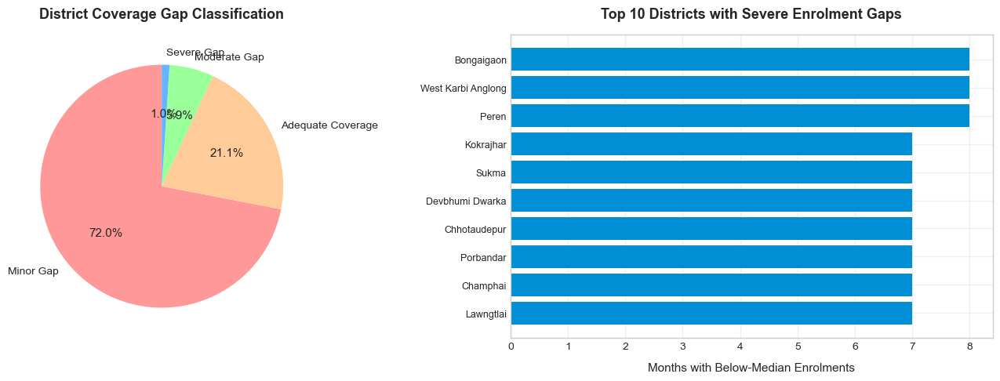

In [87]:
# Calculate national median
national_median = district_month['total_enrolments'].median()

# Flag months below median
district_month['below_median'] = district_month['total_enrolments'] < national_median

# Count low-enrolment months per district
gap_analysis = district_month.groupby(['state', 'district'])['below_median'].sum().reset_index()
gap_analysis.columns = ['state', 'district', 'low_months_count']

# Classify coverage gaps
def classify_coverage_gap(count, total_months):
    if count >= total_months * 0.75:  # Low in ≥75% of months
        return 'Severe Gap'
    elif count >= total_months * 0.5:  # Low in ≥50% of months
        return 'Moderate Gap'
    elif count >= 1:
        return 'Minor Gap'
    else:
        return 'Adequate Coverage'

# Assuming 3 months of data
total_months = district_month['month'].nunique()
gap_analysis['gap_category'] = gap_analysis['low_months_count'].apply(
    lambda x: classify_coverage_gap(x, total_months)
)

# Distribution of gap categories
gap_dist = gap_analysis['gap_category'].value_counts()

print("🔍 ENROLMENT GAP ANALYSIS RESULTS:")
print("=" * 50)
print(f"National median (district-month): {national_median:,.0f} enrolments")
print(f"Total months analyzed: {total_months}")
print("\n📈 Coverage Gap Distribution:")
print(gap_dist)
print(f"\n📊 Percentage of districts with severe gaps: {gap_dist['Severe Gap']/len(gap_analysis)*100:.1f}%")

# Display districts with severe gaps
severe_gap_districts = gap_analysis[gap_analysis['gap_category'] == 'Severe Gap'].sort_values(
    'low_months_count', ascending=False)

print("\n⚠️  TOP 10 DISTRICTS WITH SEVERE ENROLMENT GAPS:")
display(severe_gap_districts.head(10))

# Visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Pie chart of gap categories
colors = ['#ff9999', '#ffcc99', '#99ff99', '#66b3ff']
ax1.pie(gap_dist.values, labels=gap_dist.index, autopct='%1.1f%%', 
        colors=colors, startangle=90)
ax1.set_title('District Coverage Gap Classification')

# Top gap districts bar chart
top_gap = severe_gap_districts.head(10)
ax2.barh(range(len(top_gap)), top_gap['low_months_count'])
ax2.set_yticks(range(len(top_gap)))
ax2.set_yticklabels(top_gap['district'], fontsize=9)
ax2.set_xlabel('Months with Below-Median Enrolments')
ax2.set_title('Top 10 Districts with Severe Enrolment Gaps')
ax2.invert_yaxis()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('gap_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

## 6. Data Metrics Computation

### 6.1 Enrolment Momentum Index (EMI)

#### What it Measures

The **rate of change in enrolments** between two consecutive time periods, indicating growth, stability, or decline in enrolment activity.

#### 📐 Formula

$$EMI_t = \frac{\text{Average Enrolments}_{t}}{\text{Average Enrolments}_{t-1}}$$



Where:

- ( t ) = current month/year
- ( t-1 ) = previous month/year

#### Interpretation

| EMI Value | Meaning |
| --- | --- |
| EMI > 1 | Enrolment growth |
| EMI = 1 | Stable enrolment |
| EMI < 1 | Declining enrolment |

#### 🏛️ UIDAI Use

- Early detection of declining enrolment demand
- Identification of saturated vs expanding regions
- Planning awareness and outreach campaigns

In [88]:
def calculate_emi(df, groupby_cols=['state', 'district']):
    """
    Measures rate of change in enrolments between consecutive periods
    EMI > 1: Growth | EMI = 1: Stable | EMI < 1: Decline
    """
    df = df.sort_values(['date'] + groupby_cols)
    df['year_month'] = df['date'].dt.to_period('M')
    
    monthly_enrolments = df.groupby(groupby_cols + ['year_month'])['total_enrolments'].sum().reset_index()
    monthly_enrolments = monthly_enrolments.sort_values(groupby_cols + ['year_month'])
    
    monthly_enrolments['prev_enrolments'] = monthly_enrolments.groupby(groupby_cols)['total_enrolments'].shift(1)
    monthly_enrolments['EMI'] = monthly_enrolments['total_enrolments'] / monthly_enrolments['prev_enrolments']
    
    # Get latest EMI for each region
    latest_emi = monthly_enrolments.groupby(groupby_cols).last().reset_index()
    latest_emi['EMI_interpretation'] = latest_emi['EMI'].apply(
        lambda x: 'Growth' if x > 1 else ('Stable' if x == 1 else 'Decline')
    )
    
    return latest_emi[groupby_cols + ['EMI', 'EMI_interpretation']]

emi_results = calculate_emi(df)
print("\n" + "="*80)
print("ENROLMENT MOMENTUM INDEX (EMI)")
print("="*80)
print(emi_results.head(10))
print()
print("="*80)
print("(S) Summary")
print("="*80)
print(f"\nGrowth regions: {(emi_results['EMI'] > 1).sum()}")
print(f"Declining regions: {(emi_results['EMI'] < 1).sum()}")
print(f"Stable regions: {(emi_results['EMI'] == 1).sum()}")


ENROLMENT MOMENTUM INDEX (EMI)
                         state                  district        EMI  \
0                       100000                    100000  17.636364   
1    Andaman & Nicobar Islands                  Andamans   1.538462   
2    Andaman & Nicobar Islands                  Nicobars        NaN   
3    Andaman & Nicobar Islands             South Andaman   1.000000   
4  Andaman and Nicobar Islands                   Nicobar   0.500000   
5  Andaman and Nicobar Islands  North And Middle Andaman   1.290323   
6  Andaman and Nicobar Islands             South Andaman   1.145833   
7               Andhra Pradesh                  Adilabad   0.309456   
8               Andhra Pradesh     Alluri Sitharama Raju   0.757669   
9               Andhra Pradesh                Anakapalli   0.711864   

  EMI_interpretation  
0             Growth  
1             Growth  
2            Decline  
3             Stable  
4            Decline  
5             Growth  
6             Growth  
7 

### 6.2 Enrolment Penetration Score (EPS)

#### What it Measures

The **depth of Aadhaar coverage** in a region relative to its population proxy.

#### Formula

$$EPS = \frac{Total\ Enrolments\ in\ Region}{Population\ Proxy} \times 10{,}000$$

*(Population proxy may be census data or total state enrolments)*

#### Interpretation

- Low EPS → under-penetrated region
- High EPS → mature Aadhaar coverage

#### 🏛️ UIDAI Use

- Identify inclusion gaps
- Decide where new enrolment centres are required
- Support universal coverage objectives

In [89]:
def calculate_eps(df, groupby_cols=['state', 'district']):
    """
    Measures depth of Aadhaar coverage relative to population proxy
    Higher EPS = Better coverage
    """
    total_enrolments = df.groupby(groupby_cols)['total_enrolments'].sum().reset_index()
    
    # Use state-level total as population proxy for districts
    state_totals = df.groupby('state')['total_enrolments'].sum().reset_index()
    state_totals.columns = ['state', 'state_total']
    
    total_enrolments = total_enrolments.merge(state_totals, on='state')
    total_enrolments['EPS'] = (total_enrolments['total_enrolments'] / 
                                total_enrolments['state_total']) * 10000
    
    total_enrolments['EPS_category'] = pd.cut(total_enrolments['EPS'], 
                                               bins=[0, 50, 150, 500, float('inf')],
                                               labels=['Very Low', 'Low', 'Medium', 'High'])
    
    return total_enrolments[groupby_cols + ['EPS', 'EPS_category']]

eps_results = calculate_eps(df)
print("\n" + "="*80)
print("ENROLMENT PENETRATION SCORE (EPS)")
print("="*80)
print(eps_results.head(10))
print()
print("="*80)
print("(S) Summary")
print("="*80)
print(f"\nPenetration Distribution:\n{eps_results['EPS_category'].value_counts()}")


ENROLMENT PENETRATION SCORE (EPS)
                         state                  district           EPS  \
0                       100000                    100000  10000.000000   
1    Andaman & Nicobar Islands                  Andamans   6578.947368   
2    Andaman & Nicobar Islands                  Nicobars     87.719298   
3    Andaman & Nicobar Islands             South Andaman   3333.333333   
4  Andaman and Nicobar Islands                   Nicobar   1889.168766   
5  Andaman and Nicobar Islands  North And Middle Andaman   3324.937028   
6  Andaman and Nicobar Islands             South Andaman   4785.894207   
7               Andhra Pradesh                  Adilabad    111.136348   
8               Andhra Pradesh     Alluri Sitharama Raju     98.291837   
9               Andhra Pradesh                Anakapalli     42.527862   

  EPS_category  
0         High  
1         High  
2          Low  
3         High  
4         High  
5         High  
6         High  
7          Low

### 6.3 Regional Inequality Ratio (RIR)

#### What it Measures

The **inequality of enrolment access within a state**, across its districts.

#### Formula

$$RIR = \frac{\max(District\ Enrolments)}{\min(District\ Enrolments)}$$

#### Interpretation

- High RIR → uneven access and service imbalance
- Low RIR → equitable district-level coverage

#### 🏛️ UIDAI Use

- Detect intra-state disparities
- Enable targeted district-level interventions

In [90]:
def calculate_rir(df):
    """
    Measures inequality of enrolment access within a state across districts
    Higher RIR = Greater inequality
    """
    district_totals = df.groupby(['state', 'district'])['total_enrolments'].sum().reset_index()
    
    state_stats = district_totals.groupby('state').agg(
        max_district=('total_enrolments', 'max'),
        min_district=('total_enrolments', 'min'),
        num_districts=('district', 'count')
    ).reset_index()
    
    state_stats['RIR'] = state_stats['max_district'] / state_stats['min_district']
    state_stats['RIR_interpretation'] = state_stats['RIR'].apply(
        lambda x: 'High Inequality' if x > 10 else ('Moderate' if x > 3 else 'Low Inequality')
    )
    
    return state_stats[['state', 'RIR', 'num_districts', 'RIR_interpretation']]

rir_results = calculate_rir(df)
print("\n" + "="*80)
print("REGIONAL INEQUALITY RATIO (RIR)")
print("="*80)
print(rir_results.sort_values('RIR', ascending=False).head(10))


REGIONAL INEQUALITY RATIO (RIR)
            state      RIR  num_districts RIR_interpretation
28    Maharashtra  43688.0             53    High Inequality
45  Uttar Pradesh  39338.0             89    High Inequality
51    West Bengal  35911.0             58    High Inequality
39      Rajasthan  31146.0             43    High Inequality
17        Haryana  16155.0             26    High Inequality
23      Karnataka  15490.0             56    High Inequality
41     Tamil Nadu  13050.0             46    High Inequality
42      Telangana  12995.0             42    High Inequality
14          Delhi   9707.0             14    High Inequality
34         Odisha   8122.0             45    High Inequality


## 7. Correlation Analysis
Relationship between age-wise enrolments

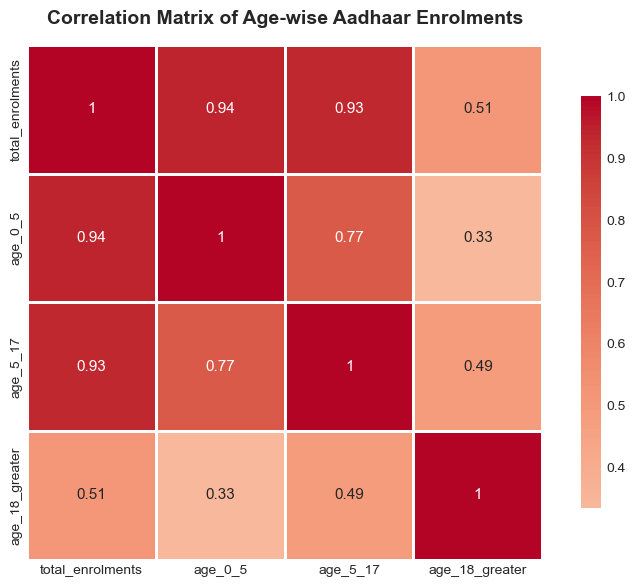

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select meaningful variables only
correlation_cols = [
    'total_enrolments',
    'age_0_5',
    'age_5_17',
    'age_18_greater'
]

# Compute correlation matrix
correlation_matrix = df[correlation_cols].corr()

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=1,
    cbar_kws={"shrink": 0.8}
)

plt.title('Correlation Matrix of Age-wise Aadhaar Enrolments', fontsize=14)
plt.tight_layout()
plt.show()


## 8. Anomaly detection using Z-score

Number of anomalies detected: 2962
Percentage of anomalies: 0.29%

Anomalous Records:
         date          state             district  total_enrolments
0  2025-03-02      Meghalaya     East Khasi Hills               109
2  2025-03-09  Uttar Pradesh         Kanpur Nagar               123
3  2025-03-09  Uttar Pradesh              Aligarh               106
10 2025-03-09  Uttar Pradesh          Maharajganj               114
11 2025-03-09          Bihar            Sitamarhi               145
13 2025-03-09          Bihar            Sitamarhi               269
14 2025-03-09  Uttar Pradesh            Ghaziabad               174
15 2025-03-09        Haryana            Faridabad               150
17 2025-03-09          Bihar            Madhubani               160
23 2025-03-09  Uttar Pradesh  Gautam Buddha Nagar               290


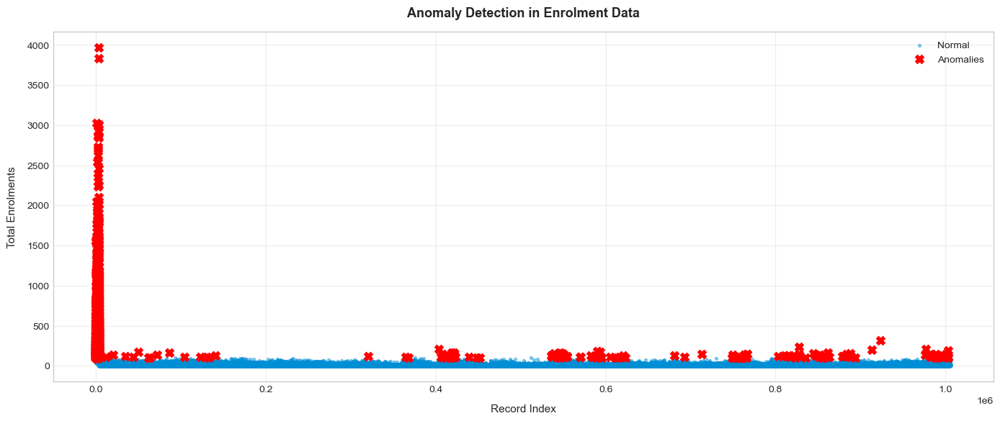


Time-series anomalies detected: 0


In [92]:
def detect_anomalies_zscore(data, threshold=3):
    """Detect anomalies using Z-score method"""
    mean = np.mean(data)
    std = np.std(data)
    z_scores = (data - mean) / std
    anomalies = np.where(np.abs(z_scores) > threshold)[0]
    return anomalies, z_scores

# Detect anomalies in enrolment patterns
anomalies, z_scores = detect_anomalies_zscore(df['total_enrolments'].values)

print(f"Number of anomalies detected: {len(anomalies)}")
print(f"Percentage of anomalies: {(len(anomalies)/len(df))*100:.2f}%")

if len(anomalies) > 0:
    print("\nAnomalous Records:")
    anomalous_data = df.iloc[anomalies]
    print(anomalous_data[['date', 'state', 'district', 'total_enrolments']].head(10))

# Visualize anomalies
plt.figure(figsize=(15, 6))
plt.scatter(range(len(df)), df['total_enrolments'], 
           alpha=0.5, label='Normal', s=10)
plt.scatter(anomalies, df['total_enrolments'].iloc[anomalies], 
           color='red', label='Anomalies', s=50, marker='x')
plt.xlabel('Record Index')
plt.ylabel('Total Enrolments')
plt.title('Anomaly Detection in Enrolment Data')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Time-based anomaly detection (sudden spikes/drops)
df['enrolment_ma'] = df.groupby('state')['total_enrolments'].transform(
    lambda x: x.rolling(window=5, min_periods=1).mean()
)
df['enrolment_std'] = df.groupby('state')['total_enrolments'].transform(
    lambda x: x.rolling(window=5, min_periods=1).std()
)

df['is_anomaly_time'] = (
    (df['total_enrolments'] > df['enrolment_ma'] + 3*df['enrolment_std']) |
    (df['total_enrolments'] < df['enrolment_ma'] - 3*df['enrolment_std'])
)

time_anomalies = df[df['is_anomaly_time']]
print(f"\nTime-series anomalies detected: {len(time_anomalies)}")

## 9. Predictive Models

### 9.1 Predictive Analytics and Enrolment Demand Forecasting (Pipeline-Based)

This module implements a **production-grade machine learning pipeline** that integrates automated feature engineering, categorical encoding, and ensemble-based regression to forecast Aadhaar enrolment demand. In parallel, a trend-based time-series model is used for short-term directional forecasting.

The pipeline-based architecture ensures **reproducibility, scalability, and consistency** between training and inference, eliminating manual preprocessing steps and reducing the risk of data leakage. The model leverages temporal and geographic attributes to identify key drivers of enrolment demand and generate actionable decision-support insig
ts.

**Key outputs** include short-term enrolment forecasts, feature importance diagnostics, seasonal growth patterns, and risk–opportunity segmentation at state and pincode levels.
#
---

## Technical Usage: Pipeline Inputs and O#utputs

### Input Requirements

The predictive pipeline expects a pandas DataFrame with the following minimum columns:

- `date` (datetime): Enrolment date
- `state` (string): State name
- `district` (string): District name
- `age_0_5` (int): Enrolments (0–5 years)
- `age_5_17` (int): Enrolments (5–17 years)
- `age_18_greater` (int): Enrolments (18+ years)

The target variable is **computed internally**:

```
total_enrolments = age_0_5 + age_5_17 + a#ge_18_greater

```

---

### Automated Feature Engineering (Pipeline-Generated)

All feature transformations are #handled **inside the pipeline**.

### Temporal Features (Auto-Derived)

- `day_of_week`
- `day_of_month`
- `mont#h`
- `quarter`
- `year`
- `is_weekend`

### Geographic Features

- `state` → ordinal-encoded
- `district` → ordinal-encoded

> No manual feature creation or ##encoding is required during prediction.
> 

---

## Pipeline Architecture

```
InputDataFrame
   ↓
DateFeatureEngineering
   ↓
CategoricalEncoding+FeaturePassthrough
   ↓
Random##ForestRegressionModel
   ↓
PredictedEnrolmentOutput

```

---

## Model Training

```
rf_pipeline.fit(X_train, y_train)

```

**Input:**

- `X_train`: DataFrame containing `date`, `state`, and `district`
- `y_train`: `tot##al_enrolments`

**Output:**

- Fully trained end-to-end prediction pipeline

---

## Model Inference (Prediction)

```
predictions = rf_pipeline.predict(X_new)

```

**Input:**

- `X_new`: DataFrame with columns `date`, `state`, and `district`

**Output:**

- Numeric predictions of `total_enrolments`

The pipeline automatically:

-## Extracts temporal features
- Encodes geographic identifiers
- Applies the trained regression model

---

## Future Date & Location Prediction

To generate forecasts for unseen dates or locations:

1. Provide a DataFrame containing future `date`, `state`, and `district`
2. Pass the DataFrame directly to the pipeline’s `predict()` method
##
```
rf_pipeline.predict(future_data)

```

No manual preprocessing, encoding, or feature selection is required.

---

## Model Outputs

- Predicted daily enrolment volumes (`total_enrolments`)
- Performance metrics: MAE, RMSE, R²
- Feature importance scores derived from the Random Forest model
- Short-term (30-day) enrolment trend forecast usi##ng linear regression
- State-level growth potential and volatility indicators
- Pincode-level risk and opportunity segmentation

---

## Operational Notes

- All preprocessing steps are embedded within the pipeline and reused consistently at inference time
- The model produces reliable predictions only for **known states and districts** present during training
- Forecasts are **decision-support estimates** and should## be interpreted alongside domain and policy context
- Pipeline-based design enables seamless deployment as a batch process or API service

---

## Practical Applications

- **Enrolment Forecasting:** Predict daily, weekly, or monthly Aadhaar enrolment demand at district and state levels
- **Resource Optimization:** Support staffing, center allocation, and infrastructure planning
- **Risk Identification:** Flag high-volatility or declining enrolment regions for intervention
- **Targeted Outreach:** Identify low-enrolment pincodes and high-growth potential regions
- **Policy Support:** Enable data-driven planning and continuous monitoring of enrolment dynamics

In [93]:
from sklearn import set_config
set_config(display='diagram')

#### 9.1.1 Custom Feature Builder

In [94]:
from sklearn.base import BaseEstimator, TransformerMixin

class DateFeatureEngineer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X = X.copy()
        X['day_of_week'] = X['date'].dt.dayofweek
        X['day_of_month'] = X['date'].dt.day
        X['month'] = X['date'].dt.month
        X['quarter'] = X['date'].dt.quarter
        X['year'] = X['date'].dt.year
        X['is_weekend'] = (X['day_of_week'] >= 5).astype(int)
        return X

#### 9.1.2 Column Transformer (Encoding)

In [95]:
from sklearn.preprocessing import OrdinalEncoder
from sklearn.compose import ColumnTransformer

numeric_features = [
    'day_of_week', 'day_of_month', 'month',
    'quarter', 'year', 'is_weekend'
]

categorical_features = ['state', 'district']

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), categorical_features),
        ('num', 'passthrough', numeric_features)
    ]
)

#### 9.1.3 Full Random Forest Pipeline

In [96]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor

rf_pipeline = Pipeline(steps=[
    ('date_features', DateFeatureEngineer()),
    ('preprocessing', preprocessor),
    ('model', RandomForestRegressor(
        n_estimators=100,
        max_depth=15,
        random_state=42,
        n_jobs=-1
    ))
])

#### 9.1.4 Train–Test Split + Training

In [97]:
X = df[['date', 'state', 'district']]
y = df['total_enrolments']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

rf_pipeline.fit(X_train, y_train)

NameError: name 'train_test_split' is not defined

#### 9.1.5 Evaluation

In [98]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

y_train_pred = rf_pipeline.predict(X_train)
y_test_pred = rf_pipeline.predict(X_test)

print("TRAINING")
print("MAE:", mean_absolute_error(y_train, y_train_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_train, y_train_pred)))
print("R²:", r2_score(y_train, y_train_pred))

print("\nTESTING")
print("MAE:", mean_absolute_error(y_test, y_test_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_test_pred)))
print("R²:", r2_score(y_test, y_test_pred))

NameError: name 'X_train' is not defined

#### 9.1.6 Feature Importance

In [99]:
feature_names = (
    categorical_features +
    numeric_features
)

importances = rf_pipeline.named_steps['model'].feature_importances_

feature_importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values(by='importance', ascending=False)

print(feature_importance_df)

NotFittedError: This RandomForestRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

#### 9.1.7 How to use this Model?

##### ⇒ Predict for a Specific Future Date & Location

In [100]:
future_data = pd.DataFrame({
    'date': [pd.to_datetime('2026-02-01')],
    'state': ['Maharashtra'],
    'district': ['Pune']
})

prediction = rf_pipeline.predict(future_data)

print(f"Predicted enrolments: {int(prediction[0])}")

NotFittedError: Pipeline is not fitted yet.

##### ⇒ Predict Multiple Days (Next 7 Days)

In [101]:
future_dates = pd.date_range(start='2026-02-01', periods=7)

future_df = pd.DataFrame({
    'date': future_dates,
    'state': ['Maharashtra'] * 7,
    'district': ['Pune'] * 7
})

future_df['predicted_enrolments'] = rf_pipeline.predict(future_df)

print(future_df)

NotFittedError: Pipeline is not fitted yet.

##### ⇒ Predict for an Entire State (All Districts)

In [102]:
districts = df[df['state'] == 'Maharashtra']['district'].unique()

future_df = pd.DataFrame({
    'date': pd.to_datetime('2026-02-01'),
    'state': 'Maharashtra',
    'district': districts
})

future_df['predicted_enrolments'] = rf_pipeline.predict(future_df)

state_total = future_df['predicted_enrolments'].sum()

print("Total predicted enrolments:", int(state_total))

NotFittedError: Pipeline is not fitted yet.